<h1 align="center"><strong>Final Project - Social Graphs and Interactions</strong></h1>
<h3 align="center"><strong>Cinematic Networks: Sentiment, Temporal Dynamics, and Genre-Based Differences</strong></h3>
<p align="center">
<strong>Date:</strong> December 12th, 2024 <br>
<strong>Created by:</strong><br>
Johan Böcher Hanehøj (s194495) <br>
Melis Cemre Akyol (s232165) <br>
Md Jahidul Islam (s240010)
</p>

---

In this final project, we turn our lens towards the world of cinema. Leveraging the *Cornell Movie Dialogue Dataset* in conjunction with metadata from TMDB (The Movie Database), we seek to map the intricate networks formed by films, their characters, and the connections between them.

We will investigate how temporal changes, sentiment extracted from dialogues, and differences in genres influence the structure and patterns of these cinematic networks. Ultimately, our goal is to reveal hidden dimensions of the cinematic universe - its communities, thematic clusters, and the interplay between sentiment and genre over time.

---
All code associated with this final project can be viewed on the following [Github Reposority](https://github.com/johan-bh/Social_Graphs_ExamProject/tree/main)



### **Key References to Report Sections**

This Explainer Notebook is very long but we were instructed to include all the things that did not make it to the report. Therefore, we provide the following links (that hopefully will work) to guide you to the key sections that are the most relevant to the figures/tables in the report:

- [Actor-Movie Hybrid Network](#a-hybrid-actor-movie-graph)
- [Biparite Networks](#building-and-visualizing-bipartite-actor-movie-networks)
- [Cluster Analysis](#clustering-analysis-of-actor-actor-and-movie-movie-networks)
- [Semantic Clustering](#semantic-clustering-data-loading-preprocessing-and-analysis)
- [Semantic Arcs](#semantic-arc-clustering)
- [Temporal Patterns of Semantics](#average-sentiment-analysis-by-genre-over-decades)
- [Genre-based difference](#genre-based-insights)

Nb. these links usually don't work as intended - if so, apologies, please consult your outline in your prefered IDE

### **Part 1: Data Collection and Preprocessing**

Before we dive into network construction, sentiment extraction, or temporal analysis, we must first gather and preprocess our data. This involves:

- **Integrating Multiple Sources:** Combining the Cornell Movie Dialogue Dataset with TMDB metadata.
- **Ensuring Data Integrity:** Cleaning and harmonizing entries, dealing with missing values, and standardizing formats.
- **Preparing for Analysis:** Extracting key attributes, such as cast members, genres, and dialogue lines ready for sentiment analysis.

Below, we begin by loading the Cornell dataset, exploring its size and structure, and then proceeding to integrate additional metadata from TMDB.

In [160]:
import kagglehub 
import pandas as pd
import os
import numpy as np
import ast

path = kagglehub.dataset_download("rajathmc/cornell-moviedialog-corpus")
print("Path to dataset files:", path)

# Calculate total size of data
total_size = 0
for filename in os.listdir(path):
    if filename.endswith('.txt'):
        file_size = os.path.getsize(os.path.join(path, filename))
        total_size += file_size
print(f"Total size of data: {total_size / (1024 * 1024):.2f} MB")


Path to dataset files: C:\Users\jbhan\.cache\kagglehub\datasets\rajathmc\cornell-moviedialog-corpus\versions\1
Total size of data: 40.28 MB


**Next, we load the key components of the Cornell dataset:**
- `movie_lines.txt` contains individual lines of dialogue.
- `movie_titles_metadata.txt` includes metadata about each movie.
- `movie_conversations.txt` connects sets of lines into conversations.

We will also perform initial cleaning steps such as renaming columns and stripping whitespace.


In [161]:
# Load the datasets

# Load movie lines dataset
movie_lines = pd.read_csv(
    f"{path}/movie_lines.txt",
    # Custom separator
    sep=r' \+\+\+\$\+\+\+ ',
    header=None,
    # Skip lines with errors
    on_bad_lines='skip',
    encoding='ISO-8859-1',
    engine='python'
)

# Load movie titles metadata
movie_titles = pd.read_csv(
    f"{path}/movie_titles_metadata.txt",
    sep=r' \+\+\+\$\+\+\+ ',
    header=None,
    encoding='ISO-8859-1',
    engine='python',
    # Assign column names
    names=['MovieID', 'Title', 'Year', 'Rating', 'Votes', 'Genres']
)

# Load movie conversations dataset
movie_conversations = pd.read_csv(
    f"{path}/movie_conversations.txt",
    sep=r' \+\+\+\$\+\+\+ ',
    header=None,
    on_bad_lines='skip',
    encoding='ISO-8859-1',
    engine='python'
)

**Renaming columns for clarity and performing basic data transformations.**

In [162]:
# Rename columns
movie_lines.columns = ['LineID', 'CharacterID', 'MovieID', 'CharacterName', 'Text']
movie_conversations.columns = ['CharacterID1', 'CharacterID2', 'MovieID', 'Conversation']

# Strip whitespace from character IDs
movie_lines['CharacterID'] = movie_lines['CharacterID'].str.strip()
movie_conversations['CharacterID1'] = movie_conversations['CharacterID1'].str.strip()
movie_conversations['CharacterID2'] = movie_conversations['CharacterID2'].str.strip()

# Convert character IDs to strings if necessary
movie_lines['CharacterID'] = movie_lines['CharacterID'].astype(str)
movie_conversations['CharacterID1'] = movie_conversations['CharacterID1'].astype(str)
movie_conversations['CharacterID2'] = movie_conversations['CharacterID2'].astype(str)


**We will now construct dictionaries and a combined DataFrame to facilitate quick lookups of characters, their movies, and related metadata.**


In [163]:
# Create dictionaries for quick lookups
character_names = dict(zip(movie_lines['CharacterID'], movie_lines['CharacterName']))
character_movies = dict(zip(movie_lines['CharacterID'], movie_lines['MovieID']))
movie_titles_dict = dict(zip(movie_titles['MovieID'], movie_titles['Title']))

# Prepare lists for DataFrame creation
character_ids = []
character_names_list = []
movie_ids = []
movie_titles_list = []

# Populate lists with character and movie information
for character_id, character_name in character_names.items():
    movie_id = character_movies.get(character_id, None)
    movie_title = movie_titles_dict.get(movie_id, None)
    
    character_ids.append(character_id)
    character_names_list.append(character_name)
    movie_ids.append(movie_id)
    movie_titles_list.append(movie_title)

# Create DataFrame from lists
df = pd.DataFrame({
    "CharacterID": character_ids,
    "CharacterName": character_names_list,
    "MovieID": movie_ids,
    "MovieTitle": movie_titles_list
})

# Display the first few rows of the DataFrame
df.head()

,CharacterID,CharacterName,MovieID,MovieTitle
0,u0,BIANCA,m0,10 things i hate about you
1,u2,CAMERON,m0,10 things i hate about you
2,u3,CHASTITY,m0,10 things i hate about you
3,u4,JOEY,m0,10 things i hate about you
4,u5,KAT,m0,10 things i hate about you


**To enrich our dataset with cast and production details, we will now integrate data from TMDB.**  
The next code cells define functions to query TMDB’s API, link characters to cast information, and unify the data.

We will:
- Use `get_movie_cast` to fetch cast details from TMDB.
- Map Cornell characters to TMDB cast to construct a unified dataset.

*Note: Make sure you have your TMDB API key ready and assigned to `API_KEY` and `BASE_URL` variables before running the next cells.*


In [164]:
from tqdm import tqdm
import time
import requests
import configparser

# Load API key from configuration file
config = configparser.ConfigParser()
config.read('Config/config.ini')
API_KEY = config['TMDB']['API_KEY']

BASE_URL = "https://api.themoviedb.org/3"

def get_movie_cast(movie_title):
    try:
        # Search for the movie by title
        search_url = f"{BASE_URL}/search/movie"
        response = requests.get(search_url, params={"api_key": API_KEY, "query": movie_title})
        results = response.json().get("results", [])
        if not results:
            return None

        # Get movie ID and fetch credits
        movie_id = results[0]["id"]
        credits_url = f"{BASE_URL}/movie/{movie_id}/credits"
        response = requests.get(credits_url, params={"api_key": API_KEY})
        cast = response.json().get("cast", [])
        return cast
    except Exception as e:
        print(f"Error fetching cast for {movie_title}: {e}")
        return None

**We group the Cornell characters by movie and attempt to match them to their TMDB counterparts.**


In [165]:
# Group characters by movie
movies = df.groupby("MovieTitle")["CharacterName"].apply(list).to_dict()

def extract_movie_cast(movie_title, cornell_characters):
    # Return empty list if movie title is NaN or None
    if pd.isna(movie_title) or movie_title is None:
        return []
    
    # Clean movie title and get characters
    clean_title = str(movie_title).strip('"')
    movie_chars = cornell_characters.get(clean_title, [])
    
    # Convert character names to lowercase, ignoring NaN values
    movie_chars = [str(char).lower() for char in movie_chars if pd.notna(char)]
    
    # Get cast from external source
    cast = get_movie_cast(clean_title)
    if cast:
        cast_info = []
        matched_cornell_chars = set()
        
        # Match Cornell characters with cast
        for person in cast:
            char_name = person['character'].lower()
            main_char_name = char_name.split('(')[0].split("'s")[0].strip()
            
            for cornell_char in movie_chars:
                if cornell_char not in matched_cornell_chars and (
                    cornell_char == char_name or 
                    cornell_char == main_char_name or
                    cornell_char in main_char_name.split()
                ):
                    matched_cornell_chars.add(cornell_char)
                    cast_info.append({
                        'movie_title': clean_title,
                        'character_name': person['character'],
                        'cornell_character': cornell_char.upper(),
                        'actor_name': person['name'],
                        'cast_order': person['order'],
                        'actor_id': person['id']
                    })
                    break
        return cast_info
    return []

**We now iterate over our movie set, extracting cast info using the function defined above.**  
We provide a `sample_size` parameter if we want to limit the data for testing.  
After processing, we create a DataFrame with all cast information.


In [166]:
def create_cast_dataframe(movies_dict, sample_size=None):
    # Initialize list to store cast information
    all_cast = []
    
    # Get list of movie titles
    movie_titles = list(movies_dict.keys())
    if sample_size:
        movie_titles = movie_titles[:sample_size]
    
    # Filter out any non-NaN movie titles
    movie_titles = [title for title in movie_titles if pd.notna(title)]
    
    # Process each movie title
    for movie_title in tqdm(movie_titles, desc="Processing movies"):
        try:
            # Extract cast information for the movie
            cast_info = extract_movie_cast(movie_title, movies_dict)
            if cast_info:
                all_cast.extend(cast_info)
            # Pause to respect API rate limits
            time.sleep(0.1)
        except Exception as e:
            print(f"Error processing movie '{movie_title}': {str(e)}")
            continue
    
    # Create DataFrame from collected cast information
    cast_df = pd.DataFrame(all_cast) if all_cast else pd.DataFrame()
    return cast_df

# Create cast DataFrame
sample_size = None
cast_df = create_cast_dataframe(movies, sample_size)

# Display the first few rows of the DataFrame
print("\nCast DataFrame:")
print(cast_df.head())

# Optionally save the DataFrame to a CSV file
# cast_df.to_csv("movie_casts_sample.csv", index=False)

Processing movies: 100%|██████████| 617/617 [03:00<00:00,  3.41it/s]


Cast DataFrame:
                  movie_title    character_name cornell_character  \
0  10 things i hate about you    Patrick Verona           PATRICK   
1  10 things i hate about you     Cameron James           CAMERON   
2  10 things i hate about you  Bianca Stratford            BIANCA   
3  10 things i hate about you    Michael Eckman           MICHAEL   
4  10 things i hate about you       Joey Donner              JOEY   

             actor_name  cast_order  actor_id  
0          Heath Ledger           0      1810  
1  Joseph Gordon-Levitt           2     24045  
2        Larisa Oleynik           3     40978  
3       David Krumholtz           4     38582  
4         Andrew Keegan           5     40979  


**In the following cell, we define a function `analyze_mismatches` to understand how well the Cornell characters map onto the TMDB cast for a given movie.**  
For each movie:
- It retrieves the Cornell characters.
- Compares them against the characters matched from TMDB.
- Prints a sample of miss-match summary of how many Cornell characters remain unmatched in the TMDB data - rest is saved in `Data/missmatch_analysis.txt`


In [157]:
def analyze_mismatches(movie_title, df, cast_df, file, print_example=False):
    # Get Cornell characters
    cornell_chars = set(df[df['MovieTitle'] == movie_title]['CharacterName'].str.lower())
    
    # Get TMDB matched characters (those successfully mapped)
    tmdb_chars = set(cast_df[cast_df['movie_title'] == movie_title]['cornell_character'].str.lower())
    
    # Find missing characters that do not appear in TMDB data
    missing_chars = cornell_chars - tmdb_chars
    
    # Prepare the analysis output
    analysis_output = [
        f"\nAnalysis for: {movie_title}",
        f"Cornell characters: {len(cornell_chars)}",
        f"TMDB matched characters: {len(tmdb_chars)}",
        f"Missing characters: {len(missing_chars)}"
    ]
    
    if missing_chars:
        analysis_output.append("Characters not found in TMDB:")
        for char in missing_chars:
            analysis_output.append(f"- {char}")
    
    analysis_output.append("-" * 50)
    
    # Write the analysis to the file
    file.write("\n".join(analysis_output) + "\n")
    
    # Print a single example to the console if specified
    if print_example:
        print("\n".join(analysis_output[:5]))  # Adjust the slice as needed to show a sample


**Let's inspect a sample set of movies to see a summary of character coverage.**


In [158]:
# Open the file once and write all analyses
with open('Data/missmatch_analysis.txt', 'w', encoding='utf-8') as file:
    # Analyze each movie in our sample
    sample_movies = cast_df['movie_title'].unique()
    
    # Flag to ensure only one example is printed
    printed_example = False
    
    for movie in sample_movies:
        analyze_mismatches(movie, df, cast_df, file, print_example=not printed_example)
        
        # Ensure only one example is printed
        if not printed_example:
            printed_example = True


Analysis for: 10 things i hate about you
Cornell characters: 12
TMDB matched characters: 8
Missing characters: 4
Characters not found in TMDB:


As one can see in the output above there are quite a few discreptancies between the characters in the Cornell Dataset and TMDB. Thus to better understand this phenomenon we conduct further investigation on a random selection of movies. The following code attempts to verify the casts between the two sources

In [54]:
def verify_tmdb_characters(movie_title):
    print(f"\nVerifying TMDB cast for: {movie_title}")
    
    # Get full cast from TMDB
    cast = get_movie_cast(movie_title)
    if cast:
        # Print all character names from TMDB
        print("\nAll TMDB characters:")
        for person in cast:
            print(f"- {person['character']}")
            
        # Get Cornell characters for this movie
        cornell_chars = set(df[df['MovieTitle'] == movie_title]['CharacterName'].str.lower())
        print("\nCornell characters not found in any form:")
        
        # Check each Cornell character
        for cornell_char in cornell_chars:
            found = False
            for person in cast:
                tmdb_char = person['character'].lower()
                # Check various conditions of partial name matches
                if (cornell_char in tmdb_char or 
                    tmdb_char in cornell_char or 
                    any(word in tmdb_char.split() for word in cornell_char.split())):
                    found = True
                    break
            
            if not found:
                print(f"- {cornell_char}")
    else:
        print("No cast found in TMDB")
    print("-" * 50)


**Below, we use `verify_tmdb_characters` to deeply inspect a selection of movies that presented discrepancies.**  
We will look at:
- *10 things i hate about you*
- *1492: conquest of paradise*
- *15 minutes*
- *2001: a space odyssey*
  
This helps us understand specific cases and potentially guide our decisions on how to handle these mismatches in later analysis.

In [55]:
movies_to_verify = [
    '10 things i hate about you',
    '1492: conquest of paradise',
    '15 minutes',
    '2001: a space odyssey'
]

for movie in movies_to_verify:
    verify_tmdb_characters(movie)



Verifying TMDB cast for: 10 things i hate about you

All TMDB characters:
- Patrick Verona
- Katarina Stratford
- Cameron James
- Bianca Stratford
- Michael Eckman
- Joey Donner
- Mandella
- Chastity
- Walter Stratford
- Mr. Morgan
- Ms. Perky
- Mr. Chapin
- Scruvy
- Bogey Lowenstien
- Derek
- Trevor
- Audio Visual Guy
- Beautiful Jock
- Coffee Kid
- Coffee Kid
- Cohort
- Coffee Girl
- Drugged Out Loser
- Wimpy Loser
- Laughing Loser
- Crying Loser
- Screaming Loser
- Detention Student
- Bartender
- Drunken Girl
- Jock
- MBA Guy at Party
- Heather
- Clem
- Cowboy
- Kissing Guy
- Judith
- Perky Girl
- Buckaroo Bartender
- Biker
- Save Ferris Singer
- Save Ferris Singer
- Letters To Cleo Singer
- Letters To Cleo Singer

Cornell characters not found in any form:
- sharon
- bruce
--------------------------------------------------

Verifying TMDB cast for: 1492: conquest of paradise

All TMDB characters:
- Christopher Columbus
- Sanchez
- Queen Isabella
- Older Fernando
- Beatrix
- Marchen

**Note on Character Discrepancies**
The observed discrepancies in the number of characters seem to mostly arise from differences between the Cornell Movie Dialogue Dataset and the TMDB cast listings. While the Cornell dataset often includes a broad range of speaking characters - some quite minor or context-specific—TMDB’s cast data may focus more on principal and credited roles. As a result, certain secondary or non-critical characters present in the Cornell dataset are not found in TMDB’s metadata. This leads to “missing” characters that do not appear in the TMDB cast lists, reflecting a natural divergence in how the two sources document and classify film characters. E.g. from `2001: A Space Oddyssey` the missing characters are:

- b20
- c12
- pilot
- child
- co-pilot

**NB:** we deem it out of scope to attempt to mitigate these discreptancies as we still have a significant portion of the most important characters for all the movies.


**Now, let’s turn our attention to the cast data and see how diverse our actor set is.**  
We begin by counting how many unique actors are in `cast_df`.

In [56]:
# How many unique actors are in the cast_df?
len(cast_df["actor_name"].unique())

4246

In [91]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from collections import defaultdict
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import os
import ast  # In case we need it

def plot_actor_network(cast_df, top_n=20, show_title=True):
    # Ensure directories exist
    os.makedirs('Figures', exist_ok=True)
    os.makedirs('Tables', exist_ok=True)

    # Get top actors by number of movies
    actor_counts = cast_df['actor_name'].value_counts().head(top_n)
    top_actors = actor_counts.index.tolist()
    
    # Create graph
    G = nx.Graph()
    
    # Filter data to relevant actors
    relevant_data = cast_df[cast_df['actor_name'].isin(top_actors)]
    
    # Add actor nodes
    for actor in top_actors:
        G.add_node(actor, node_type='actor', movie_count=actor_counts[actor])
    
    # Add movie nodes and edges from actors to movies
    movie_degrees = defaultdict(int)
    for _, row in relevant_data.iterrows():
        movie = row['movie_title']
        actor = row['actor_name']
        
        if movie not in G:
            G.add_node(movie, node_type='movie')
        G.add_edge(actor, movie)
        movie_degrees[movie] += 1
    
    # Add edges between actors who collaborated
    actor_movies = defaultdict(set)
    for _, row in relevant_data.iterrows():
        actor_movies[row['actor_name']].add(row['movie_title'])
    
    for i, actor1 in enumerate(top_actors):
        for actor2 in top_actors[i+1:]:
            shared_movies = len(actor_movies[actor1] & actor_movies[actor2])
            if shared_movies > 0:
                G.add_edge(actor1, actor2, weight=shared_movies)
    
    # Compute collaboration counts for each actor (with top actors)
    collaboration_counts = {}
    for actor in top_actors:
        collab_count = sum(
            1 for other in top_actors if other != actor and G.has_edge(actor, other)
        )
        collaboration_counts[actor] = collab_count
    
    # Convert stats to DataFrames for LaTeX output
    actor_df = pd.DataFrame({
        'Actor': top_actors,
        'Movies': [actor_counts[actor] for actor in top_actors],
        'Collaborations': [collaboration_counts[actor] for actor in top_actors]
    }).sort_values('Movies', ascending=False)
    
    actor_df_latex = actor_df.to_latex(index=False, float_format="%.0f")
    with open("Tables/top_actors_stats.tex", "w") as f:
        f.write(actor_df_latex)
    
    movie_df = pd.DataFrame({
        'Movie': list(movie_degrees.keys()),
        'TopActorsInMovie': list(movie_degrees.values())
    }).sort_values('TopActorsInMovie', ascending=False)
    
    movie_df_latex = movie_df.to_latex(index=False, float_format="%.0f")
    with open("Tables/top_movies_stats.tex", "w") as f:
        f.write(movie_df_latex)
    
    # Plot the network
    plt.figure(figsize=(20, 20))
    plt.subplots_adjust(top=0.95, bottom=0.1, right=0.95, left=0.05)
    
    pos = nx.spring_layout(G, k=2, iterations=50, seed=42)
    
    # Separate nodes by type
    actor_nodes = [node for node in G.nodes() if node in top_actors]
    movie_nodes = [node for node in G.nodes() if node not in top_actors]
    
    # Node sizes
    actor_sizes = [G.degree(node) * 300 for node in actor_nodes]
    movie_sizes = [movie_degrees[node] * 200 for node in movie_nodes]
    
    # Draw nodes
    nx.draw_networkx_nodes(G, pos, nodelist=actor_nodes, 
                           node_color='lightblue', 
                           node_size=actor_sizes, 
                           alpha=0.7)
    nx.draw_networkx_nodes(G, pos, nodelist=movie_nodes, 
                           node_color='lightgreen', 
                           node_size=movie_sizes, 
                           alpha=0.5)
    
    # Draw edges
    nx.draw_networkx_edges(G, pos, alpha=0.4, width=0.5)
    
    # Labels
    # Increase font sizes and make them bold
    actor_labels = {node: f"{node}\n({G.nodes[node]['movie_count']} movies)" for node in actor_nodes}
    movie_labels = {node: node for node in movie_nodes}
    nx.draw_networkx_labels(G, pos, actor_labels, font_size=16, font_weight='bold')
    nx.draw_networkx_labels(G, pos, movie_labels, font_size=8, font_weight='bold')
    
    # Show or hide titles based on show_title parameter
    if show_title:
        plt.suptitle("Actor-Movie Collaboration Network", fontsize=24, y=0.98, fontweight='bold')
        plt.title("Top 20 Most Frequent Actors and Their Movie Connections", fontsize=18, y=0.92, pad=20, fontweight='bold')
    
    # Legend handles
    actor_patch = mpatches.Patch(color='lightblue', label='Actors')
    movie_patch = mpatches.Patch(color='lightgreen', label='Movies')
    low_degree_node = Line2D([0], [0], marker='o', color='w', label='Low Degree',
                             markerfacecolor='gray', markersize=6)
    high_degree_node = Line2D([0], [0], marker='o', color='w', label='High Degree',
                              markerfacecolor='gray', markersize=12)
    
    # Increase legend visibility: larger font, bold, frame
    legend = plt.legend(handles=[actor_patch, movie_patch, low_degree_node, high_degree_node],
                        loc='upper right', bbox_to_anchor=(0.98, 1),
                        prop={'size':12, 'weight':'bold'},
                        frameon=True, fancybox=True, framealpha=1, edgecolor='black')
    
    plt.axis('off')
    plt.show()


### **A Hybrid Actor-Movie Graph:**  
While a strictly bipartite actor-movie network better represents the logical structure of our dataset (actors and movies as two distinct categories), sometimes a more visually compelling hybrid graph can provide additional intuitive insights. By including both actors and movies as nodes. This hybrid graph highlights not only which movies connect sets of top actors, but also how those actors interrelate through shared film appearances. The resulting display can reveal clusters of frequent collaborators and key bridging movies that shape the professional network around these top-billed performers.
However, for practical purposes we will work with bipartite networks with our further analysis as they're a better fit given the nature of the data.


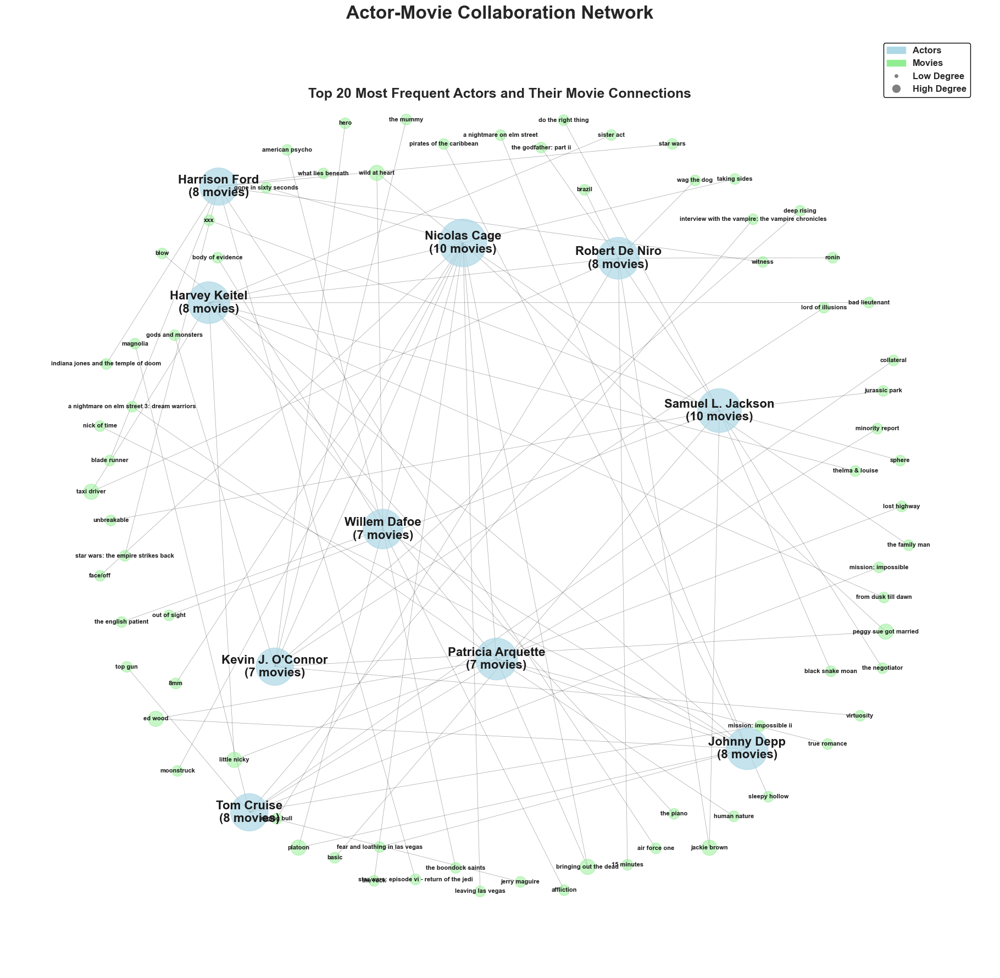

In [92]:
# Load the dataset
file_path = r"Data/movie_casts_sample.csv"
cast_df = pd.read_csv(file_path)
# Example call:
plot_actor_network(cast_df, top_n=10, show_title=True)

### **Building and Visualizing Bipartite Actor-Movie Networks**

Up to this point, we have examined how to integrate data from multiple sources and reconcile differences between character listings. Now, we shift our focus toward constructing and analyzing the underlying networks formed by the data. In cinema, understanding the patterns of collaboration between actors and the interconnections between movies can highlight which figures and films serve as central hubs in the industry.

**What We Aim to Do:**
1. **Create Actor-Actor and Movie-Movie Networks:**  
   Using our processed `cast_df`, we can build two distinct networks:
   - An **Actor-Actor** network, where edges represent co-appearances of actors in the same movies.
   - A **Movie-Movie** network, where edges represent shared actors between different movies.

2. **Compute Network Metrics:**  
   Once we have these networks, we will:
   - Calculate various centrality measures (degree, betweenness, eigenvector).
   - Visualize the distributions of these centralities.
   - Identify top nodes (actors or movies) that stand out in terms of connectivity and influence.

3. **Bipartite Representation and Filtering:**  
   We will also construct a bipartite network connecting actors directly to movies. This will enable:
   - Filtering by minimum number of appearances for actors and minimum number of actors per movie.
   - Visualizing the network to identify patterns or clusters.
   - Computing summary statistics like density and identifying top nodes.

Below, we start by creating and analyzing the actor-actor and movie-movie networks.


#### **Creating the Bipartie networks and computing summary statistics**

In [57]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

def create_networks(cast_df):
    """Create actor-actor and movie-movie networks from the cast DataFrame."""
    print("Creating actor-actor network...")
    actor_network = nx.Graph()
    movie_groups = cast_df.groupby('movie_title')['actor_name'].apply(list)
    
    for movie, actors in tqdm(movie_groups.items(), desc="Processing movies"):
        # Remove duplicates for safety
        actors = list(set(actors))
        for i, actor1 in enumerate(actors):
            for actor2 in actors[i + 1:]:
                if actor_network.has_edge(actor1, actor2):
                    actor_network[actor1][actor2]['weight'] += 1
                else:
                    actor_network.add_edge(actor1, actor2, weight=1)
    
    print("\nCreating movie-movie network...")
    movie_network = nx.Graph()
    actor_groups = cast_df.groupby('actor_name')['movie_title'].apply(list)
    
    for actor, movies in tqdm(actor_groups.items(), desc="Processing movies"):
        # Remove duplicates for safety
        movies = list(set(movies))
        for i, movie1 in enumerate(movies):
            for movie2 in movies[i + 1:]:
                if movie_network.has_edge(movie1, movie2):
                    movie_network[movie1][movie2]['weight'] += 1
                else:
                    movie_network.add_edge(movie1, movie2, weight=1)
    
    return actor_network, movie_network

def analyze_centralities(G):
    """Calculate degree, betweenness, and eigenvector centralities."""
    print("Calculating centralities...")
    centralities = {
        'Degree': nx.degree_centrality(G),
        'Betweenness': nx.betweenness_centrality(G),
        'Eigenvector': nx.eigenvector_centrality(G, max_iter=1000)
    }
    return centralities

def plot_centrality_distributions(centralities, name):
    """Plot centrality distributions for each centrality measure."""
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f'Centrality Distributions for {name} Network', y=1.02)
    
    for ax, (measure, values) in zip(axes, centralities.items()):
        # Create histogram
        ax.hist(list(values.values()), bins=50, alpha=0.7)
        
        # Add vertical line for mean
        mean_val = np.mean(list(values.values()))
        ax.axvline(mean_val, color='r', linestyle='--', alpha=0.5)
        
        # Add statistics text
        stats_text = f'Mean: {mean_val:.3f}\nMedian: {np.median(list(values.values())):.3f}'
        ax.text(0.95, 0.95, stats_text,
                transform=ax.transAxes,
                verticalalignment='top',
                horizontalalignment='right',
                bbox=dict(facecolor='white', alpha=0.8))
        
        ax.set_title(f'{measure} Centrality')
        ax.set_xlabel('Centrality Value')
        ax.set_ylabel('Frequency')
        
        # If highly skewed, use log scale
        if np.max(list(values.values())) / np.mean(list(values.values())) > 10:
            ax.set_yscale('log')
    
    plt.tight_layout()
    plt.savefig(f'Figures/{name.lower()}_centrality_distributions.png', dpi=300, bbox_inches='tight')
    plt.close()

def print_top_nodes(centralities, name):
    """Print top 5 nodes by each centrality measure."""
    print(f"\nTop 5 {name}s by centrality measures:")
    for measure, values in centralities.items():
        print(f"\n{measure} Centrality:")
        top_nodes = sorted(values.items(), key=lambda x: x[1], reverse=True)[:5]
        for node, value in top_nodes:
            print(f"  {node}: {value:.4f}")

if __name__ == "__main__":
    # Load data
    print("Loading data...")
    cast_df = pd.read_csv("Data/movie_casts_sample.csv")
    
    # Create actor and movie networks
    actor_network, movie_network = create_networks(cast_df)
    
    # Analyze Actor Network
    print("\nAnalyzing actor network...")
    actor_centralities = analyze_centralities(actor_network)
    plot_centrality_distributions(actor_centralities, "Actor")
    print_top_nodes(actor_centralities, "Actor")
    
    # Analyze Movie Network
    print("\nAnalyzing movie network...")
    movie_centralities = analyze_centralities(movie_network)
    plot_centrality_distributions(movie_centralities, "Movie")
    print_top_nodes(movie_centralities, "Movie")
    
    print("\nAnalysis complete! Check the Figures directory for visualizations.")


Loading data...
Creating actor-actor network...


Processing movies: 573it [00:00, 14885.49it/s]



Creating movie-movie network...


Processing movies: 4237it [00:00, 563469.55it/s]


Analyzing actor network...
Calculating centralities...



Top 5 Actors by centrality measures:

Degree Centrality:
  Tom Cruise: 0.0232
  William H. Macy: 0.0230
  Robert De Niro: 0.0227
  Nicolas Cage: 0.0222
  Joan Allen: 0.0220

Betweenness Centrality:
  Paul Guilfoyle: 0.0353
  Samuel L. Jackson: 0.0345
  Jack Lemmon: 0.0305
  Harry Carey, Jr.: 0.0261
  Nicolas Cage: 0.0242

Eigenvector Centrality:
  Frances McDormand: 0.1738
  Elizabeth Peña: 0.1733
  Tony Plana: 0.1731
  Matthew McConaughey: 0.1688
  Chris Cooper: 0.1682

Analyzing movie network...
Calculating centralities...

Top 5 Movies by centrality measures:

Degree Centrality:
  true romance: 0.0727
  nixon: 0.0688
  out of sight: 0.0650
  magnolia: 0.0593
  jfk: 0.0574

Betweenness Centrality:
  jfk: 0.0482
  tombstone: 0.0406
  nixon: 0.0316
  true romance: 0.0295
  u turn: 0.0265

Eigenvector Centrality:
  bringing out the dead: 0.1664
  true romance: 0.1587
  out of sight: 0.1522
  nixon: 0.1429
  magnolia: 0.1335

Analysis complete! Check the Figures directory for visualizat

Having seen how actors co-appear in films and how movies share actors, we now turn to a more direct representation of the system. Instead of building actor-actor or movie-movie networks, we construct a bipartite network where actors and movies are two distinct sets of nodes, connected by edges that indicate appearances.

This bipartite perspective allows for more fine-grained filtering and can help us explore how the network changes as we adjust thresholds for minimum actor involvement or minimum number of actors per movie. We will visualize these networks and produce summary statistics to understand their structure better.

#### **Visualizing the Bipartie Networks**

Loading data...

Initial distribution:
Total actors: 4237
Total movies: 573
Creating bipartite network for min_actor_movies=1, min_movie_actors=2...
Network created with 4226 actors and 559 movies, and 5759 edges.
Calculating layout...


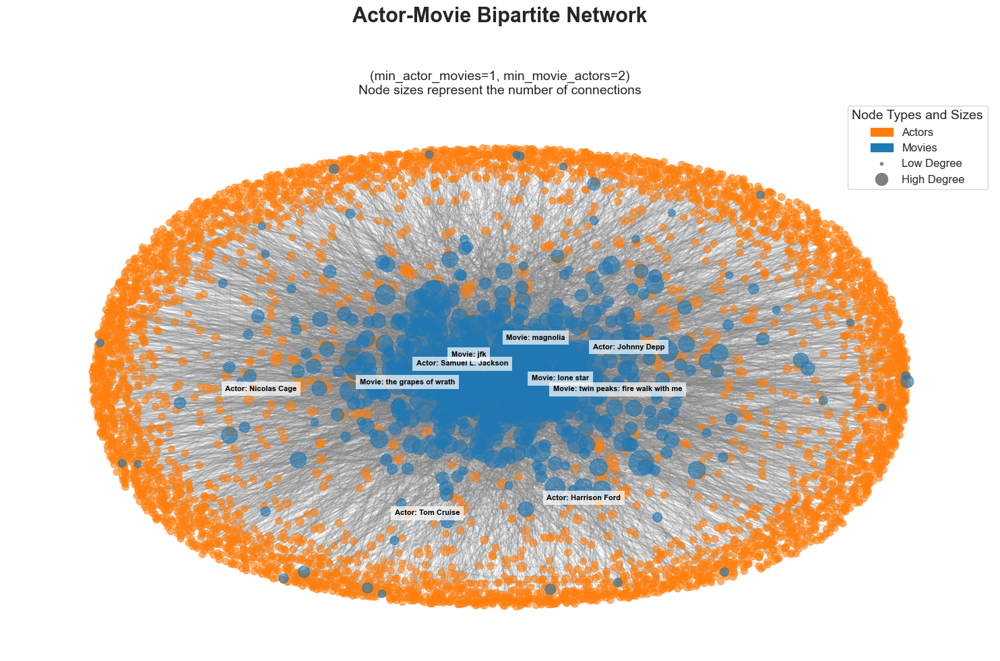


Network Metrics (min_actor_movies=1, min_movie_actors=2):
Network density: 0.0005
Top 5 most connected nodes:
Movie: lone star (Connections: 36)
Movie: jfk (Connections: 29)
Movie: magnolia (Connections: 28)
Movie: the grapes of wrath (Connections: 25)
Movie: twin peaks: fire walk with me (Connections: 24)
Creating bipartite network for min_actor_movies=2, min_movie_actors=2...
Network created with 867 actors and 521 movies, and 2400 edges.
Calculating layout...


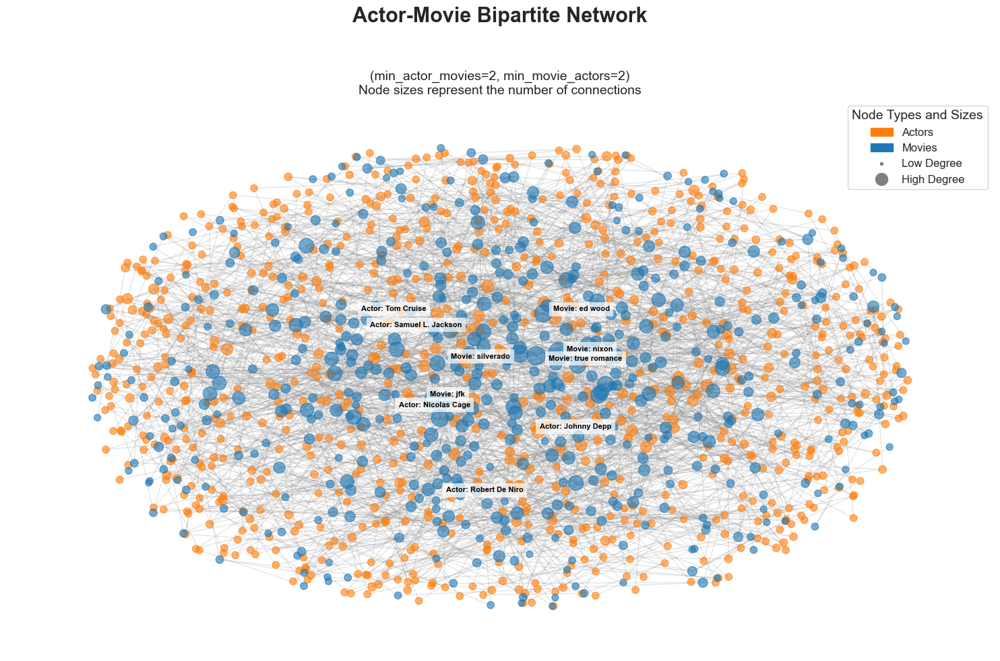


Network Metrics (min_actor_movies=2, min_movie_actors=2):
Network density: 0.0025
Top 5 most connected nodes:
Movie: nixon (Connections: 16)
Movie: jfk (Connections: 13)
Movie: true romance (Connections: 13)
Movie: silverado (Connections: 12)
Movie: ed wood (Connections: 12)
Creating bipartite network for min_actor_movies=3, min_movie_actors=2...
Network created with 353 actors and 456 movies, and 1372 edges.
Calculating layout...


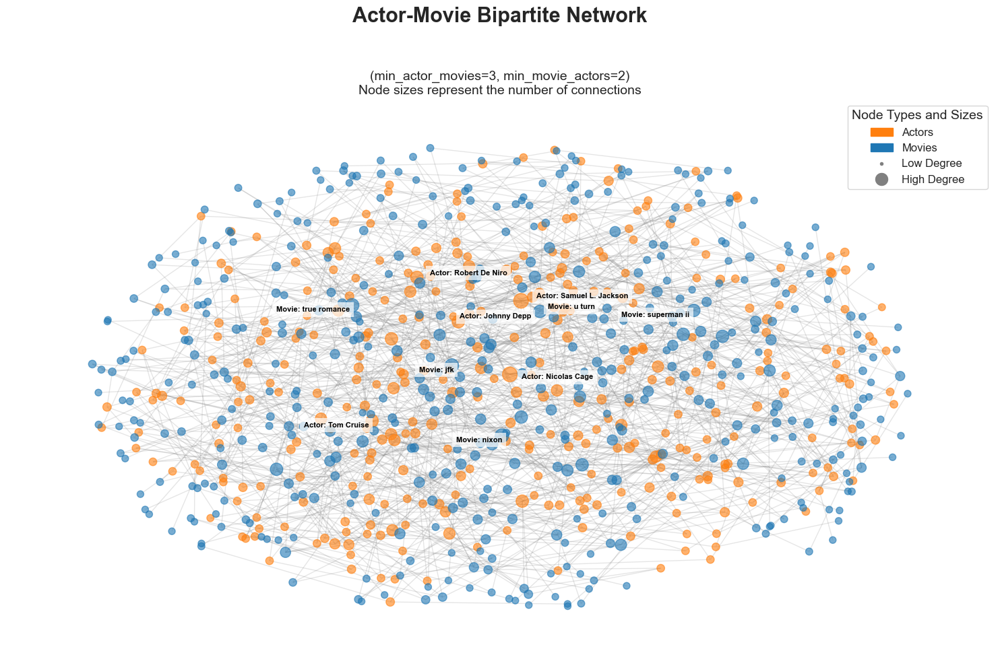


Network Metrics (min_actor_movies=3, min_movie_actors=2):
Network density: 0.0042
Top 5 most connected nodes:
Actor: Samuel L. Jackson (Connections: 10)
Actor: Nicolas Cage (Connections: 10)
Movie: nixon (Connections: 9)
Movie: jfk (Connections: 9)
Movie: true romance (Connections: 9)
Creating bipartite network for min_actor_movies=4, min_movie_actors=2...
Network created with 168 actors and 373 movies, and 819 edges.
Calculating layout...


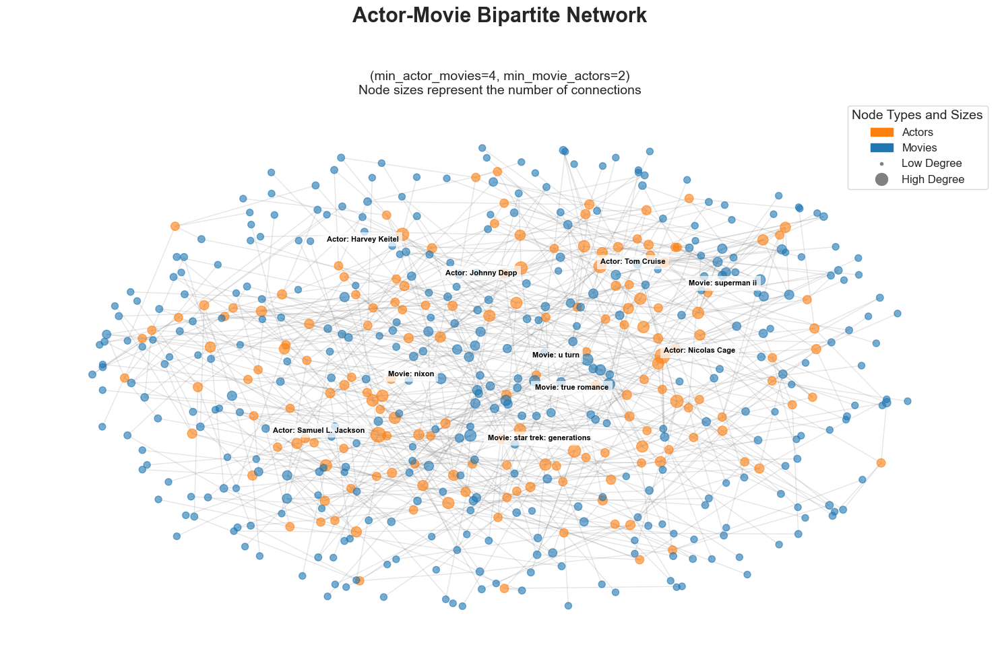


Network Metrics (min_actor_movies=4, min_movie_actors=2):
Network density: 0.0056
Top 5 most connected nodes:
Actor: Samuel L. Jackson (Connections: 10)
Actor: Nicolas Cage (Connections: 10)
Actor: Tom Cruise (Connections: 8)
Actor: Harvey Keitel (Connections: 8)
Actor: Johnny Depp (Connections: 8)
Summary statistics LaTeX table saved to Tables/summary_stats.tex


In [167]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from adjustText import adjust_text
import os

def create_and_visualize_bipartite_network(cast_df, min_actor_movies=5, min_movie_actors=5, output_filename=None):
    """Create and visualize a bipartite network of actors and movies."""
    print(f"Creating bipartite network for min_actor_movies={min_actor_movies}, min_movie_actors={min_movie_actors}...")
    
    # Filter actors and movies by thresholds
    actor_counts = cast_df['actor_name'].value_counts()
    movie_counts = cast_df['movie_title'].value_counts()
    
    qualified_actors = actor_counts[actor_counts >= min_actor_movies].index
    qualified_movies = movie_counts[movie_counts >= min_movie_actors].index
    
    filtered_df = cast_df[
        cast_df['actor_name'].isin(qualified_actors) & 
        cast_df['movie_title'].isin(qualified_movies)
    ]
    
    # Create bipartite graph
    B = nx.Graph()
    actors = set(filtered_df['actor_name'])
    movies = set(filtered_df['movie_title'])
    
    B.add_nodes_from(actors, bipartite=0, node_type='actor')
    B.add_nodes_from(movies, bipartite=1, node_type='movie')
    
    edges = list(zip(filtered_df['actor_name'], filtered_df['movie_title']))
    B.add_edges_from(edges)
    
    print(f"Network created with {len(actors)} actors and {len(movies)} movies, and {len(B.edges())} edges.")
    
    if len(actors) == 0 or len(movies) == 0:
        print("No nodes meet the criteria. No visualization created.")
        return B
    
    # Calculate layout for visualization
    print("Calculating layout...")
    pos = nx.spring_layout(B, k=0.3, iterations=50, seed=42)
    
    # Calculate node sizes based on degree
    actor_degrees = dict(B.degree(actors))
    movie_degrees = dict(B.degree(movies))
    actor_sizes = [50 + (actor_degrees[node] ** 2) * 2 for node in actors]
    movie_sizes = [50 + (movie_degrees[node] ** 2) * 2 for node in movies]
    
    plt.figure(figsize=(15, 10))
    ax = plt.gca()
    ax.set_facecolor('white')
    
    # Draw edges
    nx.draw_networkx_edges(B, pos, edge_color='gray', alpha=0.2, width=1)
    
    # Draw actor nodes
    nx.draw_networkx_nodes(B, pos,
                           nodelist=actors,
                           node_color='#ff7f0e',
                           node_size=actor_sizes,
                           alpha=0.6,
                           label='Actors')
    
    # Draw movie nodes
    nx.draw_networkx_nodes(B, pos,
                           nodelist=movies,
                           node_color='#1f77b4',
                           node_size=movie_sizes,
                           alpha=0.6,
                           label='Movies')
    
    # Label top actors and movies
    top_actors = sorted(actor_degrees.items(), key=lambda x: x[1], reverse=True)[:5]
    top_movies = sorted(movie_degrees.items(), key=lambda x: x[1], reverse=True)[:5]
    
    texts = []
    for node, degree in top_actors:
        x, y = pos[node]
        text = plt.text(x, y, f"Actor: {node}", fontsize=8, fontweight='bold', color='black',
                        horizontalalignment='center', verticalalignment='center',
                        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
        texts.append(text)
    for node, degree in top_movies:
        x, y = pos[node]
        text = plt.text(x, y, f"Movie: {node}", fontsize=8, fontweight='bold', color='black',
                        horizontalalignment='center', verticalalignment='center',
                        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
        texts.append(text)
    
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))
    
    plt.suptitle("Actor-Movie Bipartite Network", fontsize=22, fontweight='bold')
    plt.title(f"(min_actor_movies={min_actor_movies}, min_movie_actors={min_movie_actors})\n"
              "Node sizes represent the number of connections", fontsize=14)
    
    # Legend
    size_legend = [
        Line2D([0], [0], marker='o', color='w', label='Low Degree', markerfacecolor='gray', markersize=5),
        Line2D([0], [0], marker='o', color='w', label='High Degree', markerfacecolor='gray', markersize=15)
    ]
    actor_patch = mpatches.Patch(color='#ff7f0e', label='Actors')
    movie_patch = mpatches.Patch(color='#1f77b4', label='Movies')
    legend_elements = [actor_patch, movie_patch] + size_legend
    
    plt.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1, 1),
               fontsize=12, title='Node Types and Sizes', title_fontsize=14)
    
    plt.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    # Save visualization if filename is provided
    if output_filename:
        os.makedirs(os.path.dirname(output_filename), exist_ok=True)
        print(f"Saving visualization to {output_filename}...")
        plt.savefig(output_filename, dpi=300, bbox_inches='tight')
    
    plt.show()
    return B

if __name__ == "__main__":
    # Load the dataset
    print("Loading data...")
    file_path = r"Data/movie_casts_sample.csv"
    cast_df = pd.read_csv(file_path)
    
    print("\nInitial distribution:")
    print(f"Total actors: {len(cast_df['actor_name'].unique())}")
    print(f"Total movies: {len(cast_df['movie_title'].unique())}")
    
    os.makedirs("Tables", exist_ok=True)
    summary_data = []

    for min_collab in [1, 2, 3, 4]:
        B = create_and_visualize_bipartite_network(
            cast_df, 
            min_actor_movies=min_collab, 
            min_movie_actors=2
        )
        
        num_actors = len([n for n, d in B.nodes(data=True) if d.get('node_type') == 'actor'])
        num_movies = len([n for n, d in B.nodes(data=True) if d.get('node_type') == 'movie'])
        num_edges = B.number_of_edges()
        density = nx.density(B)
        
        summary_data.append({
            'min_actor_movies': min_collab,
            'min_movie_actors': 2,
            'num_actors': num_actors,
            'num_movies': num_movies,
            'num_edges': num_edges,
            'density': density
        })
        
        print(f"\nNetwork Metrics (min_actor_movies={min_collab}, min_movie_actors=2):")
        if len(B) > 0:
            print(f"Network density: {density:.4f}")
            degrees = dict(B.degree())
            top_nodes = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:5]
            print("Top 5 most connected nodes:")
            for node, degree in top_nodes:
                node_type = 'Actor' if B.nodes[node]['node_type'] == 'actor' else 'Movie'
                print(f"{node_type}: {node} (Connections: {degree})")
        else:
            print("No network to report metrics on.")
    
    summary_df = pd.DataFrame(summary_data)
    latex_table = summary_df.to_latex(index=False, float_format="%.4f")
    
    with open("Tables/summary_stats.tex", "w") as f:
        f.write(latex_table)
    
    print("Summary statistics LaTeX table saved to Tables/summary_stats.tex")

### **Visualizing Centralities**

Centrality metrics, such as degree, betweenness, and eigenvector centrality, provide insights into the structural importance of nodes within a network. For example, degree centrality identifies the most connected nodes, highlighting prominent actors or movies with widespread influence. Betweenness centrality, on the other hand, identifies nodes that act as bridges between different communities, shedding light on key connectors. Eigenvector centrality measures a node's influence based on the centrality of its neighbors, emphasizing nodes that are part of influential clusters. By visualizing these metrics, we aim to uncover how network structure distributes power and connectivity across nodes, providing a deeper understanding of the collaboration dynamics in cinematic networks

Original: 0.0, Random: 0.0, BA: 0.01794814526934577
Modularity: 0.8340251538000308
Calculating best minimal value for power law fit
Power law alpha: 7.981168092730613, Lognormal sigma: 1.0524506891812944
Weighted Average Path Length: 7.525360607914051
Average Path Length (Largest Connected Component): 7.990495369590977


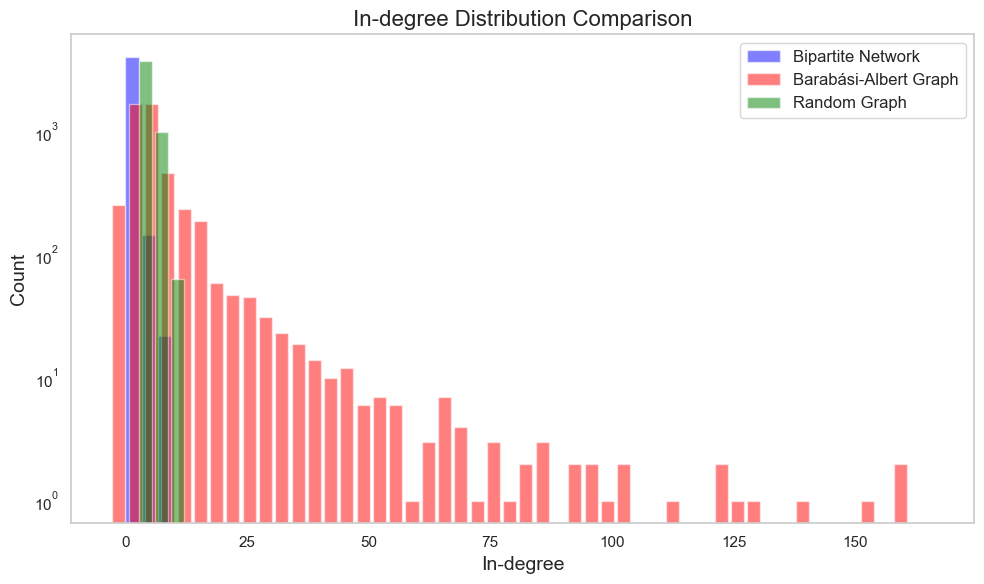

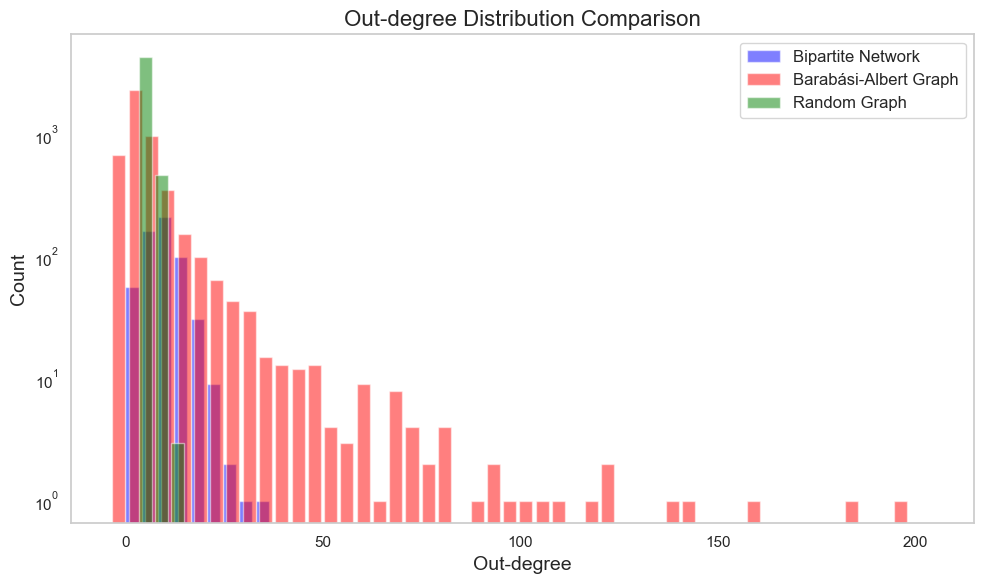

In [59]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from community import community_louvain
import powerlaw

sns.set(style="whitegrid")

# Load the bipartite graph dataset
file_path = r"Data\movie_casts_sample.csv"
movie_casts = pd.read_csv(file_path)

# Build bipartite graph
B = nx.Graph()
movies = movie_casts['movie_title'].unique()
actors = movie_casts['actor_name'].unique()

# Add movie and actor nodes
B.add_nodes_from(movies, bipartite=0)
B.add_nodes_from(actors, bipartite=1)

# Add edges between movies and actors
for _, row in movie_casts.iterrows():
    B.add_edge(row['movie_title'], row['actor_name'])

# Compute degrees for actors and movies
actor_degrees = [B.degree(n) for n in actors]
movie_degrees = [B.degree(n) for n in movies]

# Generate comparison graphs
n = len(movies) + len(actors)
m = B.number_of_edges()
ba_graph = nx.barabasi_albert_graph(n, max(1, m // len(movies)))
random_graph = nx.gnm_random_graph(n, m)

# Convert BA graph to directed for in/out-degree testing
directed_ba_graph = nx.DiGraph()
for u, v in ba_graph.edges():
    if np.random.rand() > 0.5:
        directed_ba_graph.add_edge(u, v)
    else:
        directed_ba_graph.add_edge(v, u)

# Compute in/out-degrees for comparison
ba_in_degrees = [directed_ba_graph.in_degree(n) for n in directed_ba_graph.nodes()]
ba_out_degrees = [directed_ba_graph.out_degree(n) for n in directed_ba_graph.nodes()]
random_in_degrees = [random_graph.degree(n) for n in random_graph.nodes()]

# Compute clustering coefficients
original_clustering = nx.average_clustering(B)
random_clustering = nx.average_clustering(random_graph)
ba_clustering = nx.average_clustering(ba_graph)
print(f"Original: {original_clustering}, Random: {random_clustering}, BA: {ba_clustering}")

# Compute modularity
partition = community_louvain.best_partition(B)
modularity = community_louvain.modularity(partition, B)
print(f"Modularity: {modularity}")

# Fit power law to degree data
degree_data = [d for n, d in B.degree()]
fit = powerlaw.Fit(degree_data)
print(f"Power law alpha: {fit.alpha}, Lognormal sigma: {fit.sigma}")

# Compute path lengths
components = [B.subgraph(c).copy() for c in nx.connected_components(B)]
component_path_lengths = [nx.average_shortest_path_length(component) for component in components]
total_nodes = sum(len(c) for c in components)
weighted_avg_path_length = sum(len(c) * nx.average_shortest_path_length(c) for c in components) / total_nodes
print(f"Weighted Average Path Length: {weighted_avg_path_length}")

# Compute average path length for largest connected component
largest_cc = max(nx.connected_components(B), key=len)
largest_cc_subgraph = B.subgraph(largest_cc).copy()
avg_path_length = nx.average_shortest_path_length(largest_cc_subgraph)
print(f"Average Path Length (Largest Connected Component): {avg_path_length}")

def plot_degree_distributions(real_data, ba_data, random_data, title, xlabel):
    # Plot degree distributions
    num_bins = 50
    bins = np.linspace(0, max(max(real_data), max(ba_data), max(random_data)), num_bins)
    real_hist, _ = np.histogram(real_data, bins=bins)
    ba_hist, _ = np.histogram(ba_data, bins=bins)
    random_hist, _ = np.histogram(random_data, bins=bins)

    fig, ax = plt.subplots(figsize=(10, 6))
    bar_width = (bins[1] - bins[0]) * 0.8

    ax.bar(bins[:-1], real_hist, width=bar_width, color="blue", alpha=0.5, label="Bipartite Network", align='edge')
    ax.bar(bins[:-1] - bar_width, ba_hist, width=bar_width, color="red", alpha=0.5, label="Barabási-Albert Graph", align='edge')
    ax.bar(bins[:-1] + bar_width, random_hist, width=bar_width, color="green", alpha=0.5, label="Random Graph", align='edge')

    ax.set_title(title, fontsize=16)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel("Count", fontsize=14)
    ax.set_yscale("log")
    ax.legend(fontsize=12)
    ax.grid(False)

    plt.tight_layout()
    plt.savefig(f'Figures/{title.replace(" ", "_")}_degree_distribution.png', dpi=300)
    plt.show()

# Plot degree distributions for actors and movies
plot_degree_distributions(actor_degrees, ba_in_degrees, random_in_degrees, "In-degree Distribution Comparison", "In-degree")
plot_degree_distributions(movie_degrees, ba_out_degrees, random_in_degrees, "Out-degree Distribution Comparison", "Out-degree")

The visualizations reveal patterns that numerical metrics alone cannot capture, such as star-driven clusters and niche collaborations, supported by a high modularity score (0.8340). The steep power-law fit (alpha = 7.9812, sigma = 1.0525) confirms the scale-free nature of the network, dominated by a few highly connected hubs. Moderate connectivity, reflected in the weighted average path length (7.5254) and the largest connected component's path length (7.9905), highlights the network's cohesion. While the clustering coefficient is zero, as expected for bipartite networks, the network's structure strongly aligns with scale-free characteristics, emphasizing hierarchical hubs and community-rich modularity.

**We have successfully:**
- Constructed actor-actor and movie-movie networks and examined their centralities.
- Built a bipartite network to visualize and analyze how network structure changes with filtering criteria.
- Compared our real network’s degree distributions and clustering patterns to synthetic networks.

This approach helps us understand the underlying complexities and dynamics of the cinematic landscape, revealing how collaboration and film production patterns may differ from theoretical network models.

### **Clustering Analysis of Actor-Actor and Movie-Movie Networks**

In this section, we focus on detecting communities within our Actor-Actor and Movie-Movie networks. By applying the Louvain algorithm, we aim to understand the modular structure that emerges when actors are linked through their co-appearances in films and when movies are linked through their shared actors.

**Key Steps:**

1. **Building the Networks:**  
   - **Actor-Actor Network:** Nodes represent actors, and edges represent co-occurrences in the same movie.
   - **Movie-Movie Network:** Nodes represent movies, and edges represent shared actors.

2. **Community Detection (Louvain):**  
   We use the Louvain algorithm to detect communities. This algorithm aims to maximize the network's modularity—a measure of how well the network is divided into communities, with many edges within communities and few between them.

3. **Visualizing the Top Communities:**  
   We identify the largest communities, select top nodes by degree from these communities, and visualize them with color-coding.

4. **Computing Metrics and Creating Summary Tables:**  
   We compute metrics like density, average clustering, and degree distributions. Finally, we summarize the results and save them to a LaTeX table.

---


In [60]:
import networkx as nx
import pandas as pd
from community import community_louvain
import collections
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import os
from adjustText import adjust_text

# Ensure the Figures and Tables directories exist
os.makedirs('Figures', exist_ok=True)
os.makedirs('Tables', exist_ok=True)

# Load dataset
file_path = r"Data\movie_casts_sample.csv"
cast_df = pd.read_csv(file_path)
print("Data loaded successfully!")
print(f"Number of unique actors: {cast_df['actor_name'].nunique()}")
print(f"Number of unique movies: {cast_df['movie_title'].nunique()}")


Data loaded successfully!
Number of unique actors: 4237
Number of unique movies: 573


**Building the Actor-Actor Network**

We construct the Actor-Actor network by:
1. Grouping actors by movie.
2. Counting how many times each pair of actors co-appear.
3. Adding edges weighted by the number of co-appearances.


In [61]:
def create_actor_actor_network(cast_df):
    # Initialize an empty graph
    actor_network = nx.Graph()
    print("\nCreating actor-actor network...")
    
    # Group actors by movie
    movie_groups = cast_df.groupby('movie_title')['actor_name'].apply(list)
    
    # Dictionary to count collaborations between actor pairs
    collaborations = {}
    for movie, actors in tqdm(movie_groups.items(), desc="Processing movies"):
        actors = list(set(actors))  # Remove duplicate actors
        for i, actor1 in enumerate(actors):
            for actor2 in actors[i + 1:]:
                pair = tuple(sorted([actor1, actor2]))
                collaborations[pair] = collaborations.get(pair, 0) + 1

    # Add edges to the graph with weights
    for (actor1, actor2), weight in collaborations.items():
        actor_network.add_edge(actor1, actor2, weight=weight)
    
    return actor_network

# Create the actor-actor network
actor_network = create_actor_actor_network(cast_df)
print(f"Actor-Actor network created with {actor_network.number_of_nodes()} nodes and {actor_network.number_of_edges()} edges.")


Creating actor-actor network...


Processing movies: 573it [00:00, 46324.01it/s]

Actor-Actor network created with 4226 nodes and 31961 edges.


**Building the Movie-Movie Network**

Similarly, for the Movie-Movie network:
1. Group movies by actor.
2. Count how many times each pair of movies share actors.
3. Add edges weighted by the number of shared actors.


In [62]:
def create_movie_movie_network(cast_df):
    # Initialize an empty graph
    movie_network = nx.Graph()
    print("\nCreating movie-movie network...")
    
    # Group movies by actor
    actor_groups = cast_df.groupby('actor_name')['movie_title'].apply(list)
    
    # Dictionary to count shared actors between movie pairs
    shared_actors = {}
    for actor, movies in tqdm(actor_groups.items(), desc="Processing actors"):
        movies = list(set(movies))  # Remove duplicate movies
        for i, movie1 in enumerate(movies):
            for movie2 in movies[i + 1:]:
                pair = tuple(sorted([movie1, movie2]))
                shared_actors[pair] = shared_actors.get(pair, 0) + 1
    
    # Add edges to the graph with weights
    for (movie1, movie2), weight in shared_actors.items():
        movie_network.add_edge(movie1, movie2, weight=weight)
    
    return movie_network

# Create the movie-movie network
movie_network = create_movie_movie_network(cast_df)
print(f"Movie-Movie network created with {movie_network.number_of_nodes()} nodes and {movie_network.number_of_edges()} edges.")


Creating movie-movie network...


Processing actors: 4237it [00:00, 1674480.92it/s]

Movie-Movie network created with 524 nodes and 2552 edges.


**Community Detection and Visualization**

We will:
- Apply the Louvain algorithm to detect communities in each network.
- Print the number and sizes of communities.
- Compute the network’s modularity score.
- Identify the top communities and their prominent nodes (by degree).
- Visualize a subgraph of top nodes from the top communities.



Analyzing Actor communities...

Actor Community Detection Results:
Number of communities detected: 101

Top 5 community sizes:
Community 44: 151 nodes
Community 84: 131 nodes
Community 18: 122 nodes
Community 3: 101 nodes
Community 66: 97 nodes
Community modularity: 0.7601


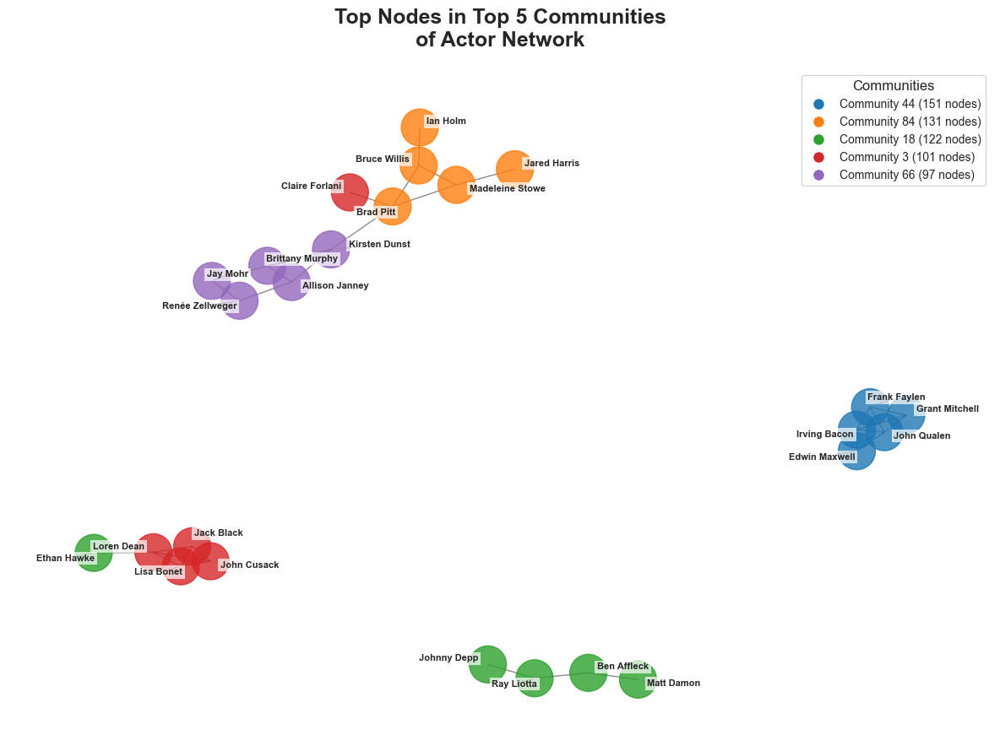


Analyzing Movie communities...

Movie Community Detection Results:
Number of communities detected: 33

Top 5 community sizes:
Community 12: 31 nodes
Community 20: 26 nodes
Community 30: 26 nodes
Community 8: 26 nodes
Community 21: 26 nodes
Community modularity: 0.4444


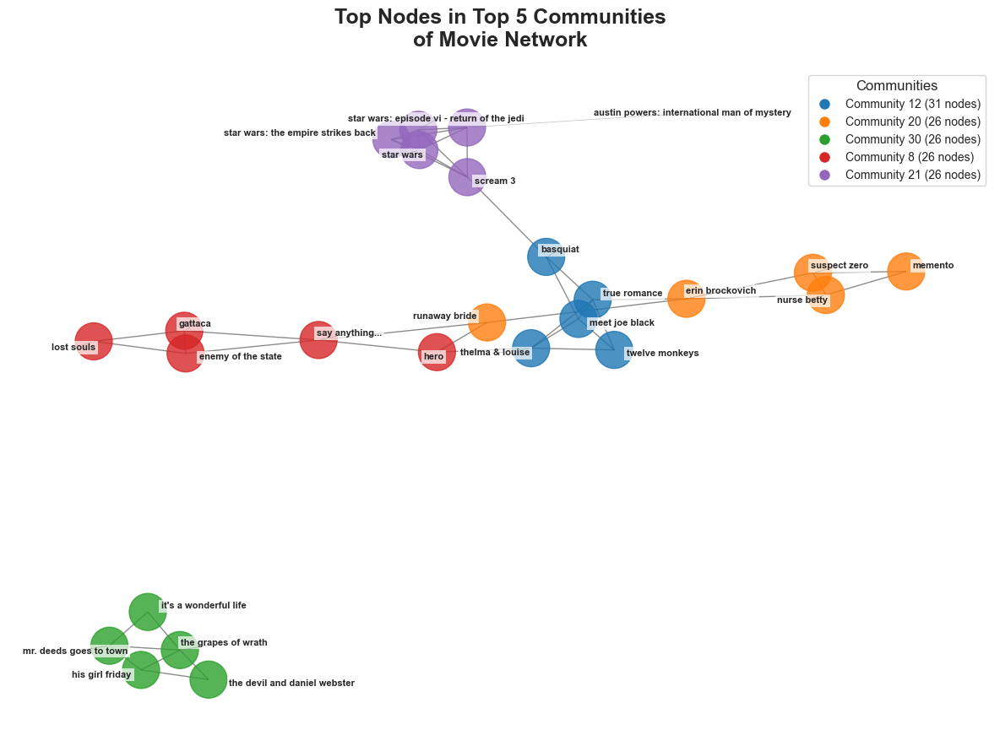

In [63]:
def analyze_communities(G, name):
    print(f"\nAnalyzing {name} communities...")
    
    # Detect communities
    communities = community_louvain.best_partition(G, weight='weight')
    n_communities = len(set(communities.values()))
    community_sizes = collections.Counter(communities.values())
    
    print(f"\n{name} Community Detection Results:")
    print(f"Number of communities detected: {n_communities}")
    
    # Get top N largest communities
    top_n_communities = 5
    top_communities = sorted(community_sizes.items(), key=lambda x: x[1], reverse=True)[:top_n_communities]
    print(f"\nTop {top_n_communities} community sizes:")
    for comm_id, size in top_communities:
        print(f"Community {comm_id}: {size} nodes")
    
    # Calculate modularity
    modularity = community_louvain.modularity(communities, G)
    print(f"Community modularity: {modularity:.4f}")
    
    # Build a subgraph with top nodes from each of the top communities
    top_nodes = []
    for comm_id, _ in top_communities:
        nodes_in_comm = [node for node, comm in communities.items() if comm == comm_id]
        subgraph = G.subgraph(nodes_in_comm)
        degrees = subgraph.degree()
        top_nodes_in_comm = sorted(degrees, key=lambda x: x[1], reverse=True)[:5]
        top_nodes.extend([node for node, _ in top_nodes_in_comm])
    
    top_nodes_subgraph = G.subgraph(top_nodes)
    
    # Assign colors
    color_palette = plt.get_cmap('tab10')
    top_communities_ids = [comm_id for comm_id, _ in top_communities]
    community_color_map = {comm_id: color_palette(i) for i, comm_id in enumerate(top_communities_ids)}
    
    node_colors = []
    for node in top_nodes_subgraph.nodes():
        comm_id = communities[node]
        node_colors.append(community_color_map[comm_id])
    
    # Layout and visualization
    pos = nx.spring_layout(top_nodes_subgraph, seed=42)
    plt.figure(figsize=(12, 9))
    nx.draw_networkx_edges(top_nodes_subgraph, pos, alpha=0.5, width=1)
    nx.draw_networkx_nodes(top_nodes_subgraph, pos, node_color=node_colors, node_size=1000, alpha=0.8)
    
    texts = []
    for node in top_nodes_subgraph.nodes():
        x, y = pos[node]
        text = plt.text(x, y, node, fontsize=8, fontweight='bold', horizontalalignment='center', verticalalignment='center',
                        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, pad=2))
        texts.append(text)
    
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5, alpha=0.5), expand_points=(1.5, 1.5))
    
    legend_elements = []
    for comm_id, size in top_communities:
        legend_elements.append(
            plt.Line2D([0], [0], marker='o', color='w', label=f'Community {comm_id} ({size} nodes)',
                       markerfacecolor=community_color_map[comm_id], markersize=10)
        )
    plt.legend(handles=legend_elements, loc='upper right', title='Communities', fontsize=10)
    
    plt.title(f"Top Nodes in Top {top_n_communities} Communities\nof {name} Network", pad=20, fontsize=18, fontweight='bold')
    plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(f'Figures/{name.lower()}_top_nodes_in_communities.png', dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()
    
    return communities, community_sizes, modularity

actor_communities, actor_sizes, actor_modularity = analyze_communities(actor_network, "Actor")
movie_communities, movie_sizes, movie_modularity = analyze_communities(movie_network, "Movie")


**Computing and Printing Network Metrics**

We compute:
- Density
- Average clustering coefficient
- Degree distribution stats (min, max, median)
- Top central nodes

These metrics help us understand the structure and cohesiveness of our networks.


In [64]:
def compute_network_metrics(G):
    # Return default metrics if graph is empty
    if len(G) == 0:
        return {
            'density': 0.0,
            'avg_clustering': 0.0,
            'avg_degree': 0.0,
            'min_degree': 0,
            'max_degree': 0,
            'median_degree': 0
        }
    
    # Calculate network metrics
    density = nx.density(G)
    avg_clustering = nx.average_clustering(G)
    avg_degree = sum(dict(G.degree()).values()) / len(G)
    degrees = [d for n, d in G.degree()]
    min_degree = min(degrees) if degrees else 0
    max_degree = max(degrees) if degrees else 0
    median_degree = np.median(degrees) if degrees else 0
    
    return {
        'density': density,
        'avg_clustering': avg_clustering,
        'avg_degree': avg_degree,
        'min_degree': min_degree,
        'max_degree': max_degree,
        'median_degree': median_degree
    }

def print_network_metrics(G, name):
    # Print network metrics
    print(f"\n{name} Network Metrics:")
    metrics = compute_network_metrics(G)
    print(f"Network density: {metrics['density']:.4f}")
    print(f"Average clustering coefficient: {metrics['avg_clustering']:.4f}")
    print(f"Average degree: {metrics['avg_degree']:.2f}")
    print("Degree statistics:")
    print(f"  Min degree: {metrics['min_degree']}")
    print(f"  Max degree: {metrics['max_degree']}")
    print(f"  Median degree: {metrics['median_degree']:.1f}")
    
    # Print top 5 most central nodes
    if len(G) > 0:
        centrality = nx.degree_centrality(G)
        top_nodes = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:5]
        print("\nMost central nodes:")
        for node, cent in top_nodes:
            print(f"  {node}: {cent:.4f}")

# Print metrics for actor and movie networks
print_network_metrics(actor_network, "Actor")
print_network_metrics(movie_network, "Movie")


Actor Network Metrics:
Network density: 0.0036
Average clustering coefficient: 0.8832
Average degree: 15.13
Degree statistics:
  Min degree: 1
  Max degree: 98
  Median degree: 12.0

Most central nodes:
  Tom Cruise: 0.0232
  William H. Macy: 0.0230
  Robert De Niro: 0.0227
  Nicolas Cage: 0.0222
  Joan Allen: 0.0220

Movie Network Metrics:
Network density: 0.0186
Average clustering coefficient: 0.2911
Average degree: 9.74
Degree statistics:
  Min degree: 1
  Max degree: 38
  Median degree: 8.0

Most central nodes:
  true romance: 0.0727
  nixon: 0.0688
  out of sight: 0.0650
  magnolia: 0.0593
  jfk: 0.0574


**Community Size Distribution**

We plot the size distribution of the detected communities on a log scale to understand how community sizes are distributed. We also annotate the figure with key statistics such as the largest community size, median size, and modularity.


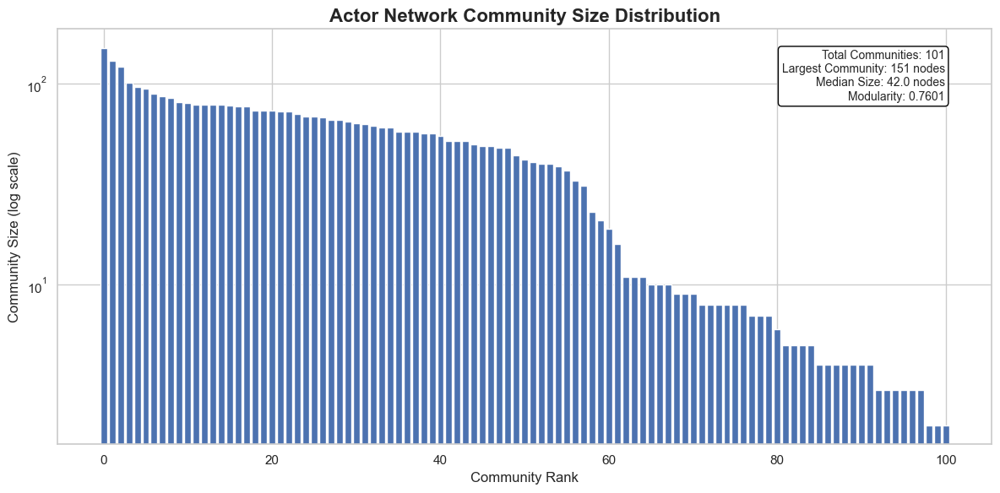

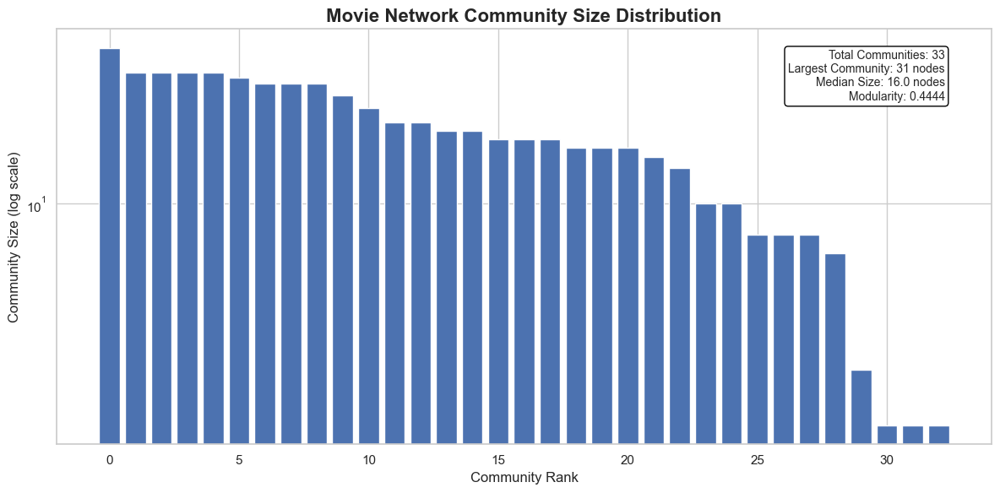

In [65]:
def plot_community_size_distribution(community_sizes, modularity, name):
    # Sort community sizes in descending order
    sizes = sorted(community_sizes.values(), reverse=True)
    
    # Calculate number of communities, largest, and median size
    n_communities = len(sizes)
    largest = max(sizes) if sizes else 0
    median_size = np.median(sizes) if sizes else 0
    
    # Create plot
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.bar(range(n_communities), sizes)
    ax.set_yscale('log')
    ax.set_xlabel("Community Rank")
    ax.set_ylabel("Community Size (log scale)")
    ax.set_title(f"{name} Network Community Size Distribution", fontsize=16, fontweight='bold')
    
    # Add text box with statistics
    textstr = (f"Total Communities: {n_communities}\n"
               f"Largest Community: {largest} nodes\n"
               f"Median Size: {median_size} nodes\n"
               f"Modularity: {modularity:.4f}")
    props = dict(boxstyle='round', facecolor='white', edgecolor='black', alpha=1.0)
    ax.text(0.95, 0.95, textstr, transform=ax.transAxes, fontsize=10,
            verticalalignment='top', horizontalalignment='right', bbox=props)
    
    # Finalize and save plot
    plt.tight_layout()
    plt.savefig(f"Figures/{name.lower()}_community_size_distribution.png", dpi=300, bbox_inches='tight')
    plt.show()

# Plot community size distribution for actor and movie networks
plot_community_size_distribution(actor_sizes, actor_modularity, "Actor")
plot_community_size_distribution(movie_sizes, movie_modularity, "Movie")

**Creating a Summary Table**

We compile our findings (number of nodes, edges, communities, modularity, etc.) into a summary table, which is saved as a LaTeX file for future inclusion in reports.


In [66]:
from IPython.display import Markdown, display

# Compute metrics for actor and movie networks
actor_metrics = compute_network_metrics(actor_network)
movie_metrics = compute_network_metrics(movie_network)

# Actor network data
actor_data = {
    'Network': 'Actor',
    'Nodes': actor_network.number_of_nodes(),
    'Edges': actor_network.number_of_edges(),
    'Communities': len(set(actor_communities.values())),
    'Modularity': actor_modularity,
    'Density': actor_metrics['density'],
    'Avg Degree': actor_metrics['avg_degree'],
    'Avg Clustering': actor_metrics['avg_clustering'],
    'Max Degree': actor_metrics['max_degree']
}

# Movie network data
movie_data = {
    'Network': 'Movie',
    'Nodes': movie_network.number_of_nodes(),
    'Edges': movie_network.number_of_edges(),
    'Communities': len(set(movie_communities.values())),
    'Modularity': movie_modularity,
    'Density': movie_metrics['density'],
    'Avg Degree': movie_metrics['avg_degree'],
    'Avg Clustering': movie_metrics['avg_clustering'],
    'Max Degree': movie_metrics['max_degree']
}

# Create DataFrame from data
summary_df = pd.DataFrame([actor_data, movie_data])

# Convert DataFrame to LaTeX table
latex_table_content = summary_df.to_latex(index=False, float_format="%.4f")

# Construct full LaTeX table
latex_table = (
    r"\begin{table}[h]\centering" + "\n"
    r"\caption{Summary statistics for Louvain communities of the Actor and Movie Networks.}" + "\n"
    r"\label{tab:community_summary_stats}" + "\n"
    + latex_table_content +
    "\n\\end{table}"
)

# Display DataFrame as Markdown
display(Markdown(summary_df.to_markdown(index=False)))

| Network   |   Nodes |   Edges |   Communities |   Modularity |    Density |   Avg Degree |   Avg Clustering |   Max Degree |
|:----------|--------:|--------:|--------------:|-------------:|-----------:|-------------:|-----------------:|-------------:|
| Actor     |    4226 |   31961 |           101 |     0.760115 | 0.00358009 |     15.1259  |         0.883225 |           98 |
| Movie     |     524 |    2552 |            33 |     0.44444  | 0.0186242  |      9.74046 |         0.291115 |           38 |

**Conclusion:**

In this section, we:
- Constructed actor-actor and movie-movie networks.
- Used the Louvain algorithm to detect communities.
- Analyzed and visualized the largest communities.
- Calculated various network metrics, from modularity to clustering.
- Summarized findings in both visual and tabular formats.

This clustering analysis provides insight into the latent structures within the cinematic network, highlighting groups of closely connected actors or films and how these clusters vary in size and internal connectivity.

### **Semantic Clustering: Data Loading, Preprocessing, and Analysis**

We will now move towards an approach focused on semantic clustering and sentiment analysis of movie dialogues. Since our script is quite extensive, we will break it down into multiple cells. Each cell will contain a related set of functions or steps, accompanied by an explanatory markdown block that describes the purpose and logic of the code. After each code cell, we provide a small "bridge" section that leads into the next cell.

In this analysis, we:

- Load and preprocess the Cornell Movie Dialog dataset.
- Construct and analyze networks of character interactions with sentiment-encoded edges.
- Compute and visualize average sentiment arcs and compare top/bottom sets of movies.
- Eventually, we extend these analyses to genre-level comparisons and advanced network metrics.

We import all the necessary libraries and ensure our directories for figures exist. This setup cell provides the environment upon which subsequent cells will build.

In [67]:
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from nltk.sentiment import SentimentIntensityAnalyzer
import os
import kagglehub
import ast
import nltk
from scipy.stats import mannwhitneyu, skew, kurtosis
from nltk.corpus import stopwords
import string
from adjustText import adjust_text
import community.community_louvain as community_louvain  # For Louvain clustering
# supress user warnings
import warnings
warnings.filterwarnings("ignore")


nltk.download('vader_lexicon')  # Ensure VADER is available
os.makedirs('Figures', exist_ok=True)  # Create a directory for figures if not already present


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\jbhan\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


The `load_movie_data()` function:
- Downloads the Cornell Movie Dialog corpus using `kagglehub`.
- Loads movie lines, conversations, and titles into DataFrames.
- Cleans and normalizes conversation texts.
- Constructs a combined conversation text field.

This function returns three DataFrames: 
- `movie_lines`, containing individual dialogue lines.
- `movie_conversations`, containing sets of lines that form a conversation.
- `movie_titles`, containing movie metadata.

In [68]:
def load_movie_data():
    """Load and preprocess the Cornell Movie Dialog Corpus."""
    print("Loading movie dialog dataset...")
    path = kagglehub.dataset_download("rajathmc/cornell-moviedialog-corpus")
    
    # Load movie lines
    movie_lines = pd.read_csv(
        f"{path}/movie_lines.txt", 
        sep=r' \+\+\+\$\+\+\+ ',
        header=None,
        on_bad_lines='skip',
        encoding='ISO-8859-1',
        engine='python'
    )
    movie_lines.columns = ['LineID', 'CharacterID', 'MovieID', 'CharacterName', 'Text']
    
    # Load movie conversations
    movie_conversations = pd.read_csv(
        f"{path}/movie_conversations.txt", 
        sep=r' \+\+\+\$\+\+\+ ',
        header=None,
        on_bad_lines='skip',
        encoding='ISO-8859-1',
        engine='python'
    )
    movie_conversations.columns = ['CharacterID1', 'CharacterID2', 'MovieID', 'Conversation']
    
    # Load movie titles and metadata
    movie_titles = pd.read_csv(
        f"{path}/movie_titles_metadata.txt",
        sep=r' \+\+\+\$\+\+\+ ',
        header=None,
        encoding='ISO-8859-1',
        engine='python'
    )
    movie_titles.columns = ['MovieID', 'Title', 'Year', 'Rating', 'Votes', 'Genres']
    
    # Clean data
    movie_lines['CharacterID'] = movie_lines['CharacterID'].str.strip()
    movie_conversations['CharacterID1'] = movie_conversations['CharacterID1'].str.strip()
    movie_conversations['CharacterID2'] = movie_conversations['CharacterID2'].str.strip()
    movie_lines['CharacterID'] = movie_lines['CharacterID'].astype(str)
    movie_conversations['CharacterID1'] = movie_conversations['CharacterID1'].astype(str)
    movie_conversations['CharacterID2'] = movie_conversations['CharacterID2'].astype(str)
    movie_lines['Text'] = movie_lines['Text'].fillna('')
    
    # Create a dictionary for quick line lookup
    line_dict = dict(zip(movie_lines['LineID'], movie_lines['Text']))
    
    def parse_conversation(conv_str):
        try:
            conv_str = conv_str.strip("[]' ").replace("'", "").replace('"', '')
            return [x.strip() for x in conv_str.split(',') if x.strip()]
        except:
            return []
    
    def get_conversation_text(conv_list):
        texts = []
        for line_id in conv_list:
            text = line_dict.get(line_id.strip(), '')
            if text:
                texts.append(text)
        return ' '.join(texts)
    
    # Process conversations
    print("Processing conversations...")
    movie_conversations['Conversation'] = movie_conversations['Conversation'].apply(parse_conversation)
    movie_conversations['Text'] = movie_conversations['Conversation'].apply(get_conversation_text)
    
    # Remove empty conversations
    movie_conversations = movie_conversations[movie_conversations['Text'].str.len() > 0]
    
    print(f"Loaded {len(movie_lines)} lines from {len(movie_titles)} movies")
    print(f"Found {len(movie_conversations)} valid conversations")
    
    return movie_lines, movie_conversations, movie_titles

After loading the data, we will create a single class `MovieDialogueAnalyzer` that encapsulates various analyses. This class will include methods for:

- Constructing interaction networks from movie dialogues.
- Performing sentiment analysis on lines and edges.
- Plotting sentiment arcs for top/bottom sets of movies.
- Visualizing character interaction networks.
- Extracting emotional keywords.
- Computing advanced network metrics (like modularity, clustering, assortativity).
- Comparing average arcs across sets of movies (top vs bottom and by genre).

Below, we define the entire `MovieDialogueAnalyzer` class in one code cell, with all its methods. You can skip this part as it's quite long. After the code, you will find a detailed explanation of each function and its purpose.

In [193]:
class MovieDialogueAnalyzer:
    """Class for analyzing movie dialogues."""
    
    def __init__(self, movie_lines, movie_conversations, movie_titles):
        # Initialize with movie data and set up sentiment analysis tools
        self.movie_lines = movie_lines
        self.movie_conversations = movie_conversations
        self.movie_titles = movie_titles
        self.sia = SentimentIntensityAnalyzer()  # Sentiment analysis tool
        self.stop_words = set(stopwords.words('english'))  # Common words to ignore
        self.punctuations = set(string.punctuation)  # Punctuation to ignore
        
    def create_interaction_network(self, movie_id):
        """Create a directed interaction network for a specific movie with sentiment on edges."""
        # Filter conversations and lines for the given movie
        movie_convos = self.movie_conversations[self.movie_conversations['MovieID'] == movie_id]
        movie_lines_subset = self.movie_lines[self.movie_lines['MovieID'] == movie_id]
        char_names = dict(zip(movie_lines_subset['CharacterID'], movie_lines_subset['CharacterName']))
        
        MG = nx.DiGraph()  # Directed graph for character interactions
        
        # Map line IDs to character IDs and text
        line_to_character = dict(zip(movie_lines_subset['LineID'], movie_lines_subset['CharacterID']))
        line_dict = dict(zip(movie_lines_subset['LineID'], movie_lines_subset['Text']))
        
        for _, row in movie_convos.iterrows():
            try:
                conversation_ids = row['Conversation']
                for i in range(len(conversation_ids) - 1):
                    line_id_1 = conversation_ids[i]
                    line_id_2 = conversation_ids[i + 1]
                    
                    char1 = line_to_character.get(line_id_1)
                    char2 = line_to_character.get(line_id_2)
                    
                    text = line_dict.get(line_id_1, '')
                    sentiment = self.sia.polarity_scores(text)['compound']  # Sentiment score
                    
                    if char1 and char2:
                        if MG.has_edge(char1, char2):
                            # Update existing edge with new sentiment
                            old_sentiment = MG[char1][char2]['sentiment']
                            old_weight = MG[char1][char2]['weight']
                            new_sentiment = (old_sentiment * old_weight + sentiment) / (old_weight + 1)
                            MG[char1][char2]['sentiment'] = new_sentiment
                            MG[char1][char2]['weight'] += 1
                        else:
                            # Add new edge with initial sentiment
                            MG.add_edge(char1, char2, weight=1, sentiment=sentiment)
                if char1:
                    MG.add_node(char1, name=char_names.get(char1, char1))
                if char2:
                    MG.add_node(char2, name=char_names.get(char2, char2))
            except:
                continue
        
        # Remove self-loops (characters talking to themselves)
        MG.remove_edges_from(nx.selfloop_edges(MG))
        
        return MG, char_names

    def plot_combined_sentiment_arcs(self, top_ids, bottom_ids, title=False):
        """Plot cumulative sentiment arcs for top 10 and bottom 10 in one figure."""
        n_cols = 10
        n_rows = 2
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 15))
        axes = axes.flatten()
        
        # Plot top 10 movies' sentiment arcs
        for i, movie_id in enumerate(top_ids):
            ax = axes[i]
            movie_lines = self.movie_lines[self.movie_lines['MovieID'] == movie_id].sort_values('LineID')
            movie_lines['Sentiment'] = movie_lines['Text'].apply(lambda x: self.sia.polarity_scores(x)['compound'])
            movie_lines['CumulativeAverage'] = movie_lines['Sentiment'].expanding().mean()
            
            x = np.arange(len(movie_lines))
            y = movie_lines['CumulativeAverage'].values
            
            ax.plot(x, y, color='black', linestyle='-', linewidth=2)
            
            # Fill areas based on sentiment
            ax.fill_between(x, y, where=(y >= 0), interpolate=True, color='green', alpha=0.3)
            ax.fill_between(x, y, where=(y < 0), interpolate=True, color='red', alpha=0.3)
            
            ax.set_title("")  # No subplot title
            ax.set_xlabel("")  # No individual x-label
            ax.set_ylabel("")  # No individual y-label
            ax.grid(True, alpha=0.3)
        
        # Plot bottom 10 movies' sentiment arcs
        start_idx = len(top_ids)
        for j, movie_id in enumerate(bottom_ids):
            ax = axes[start_idx + j]
            movie_lines = self.movie_lines[self.movie_lines['MovieID'] == movie_id].sort_values('LineID')
            movie_lines['Sentiment'] = movie_lines['Text'].apply(lambda x: self.sia.polarity_scores(x)['compound'])
            movie_lines['CumulativeAverage'] = movie_lines['Sentiment'].expanding().mean()
            
            x = np.arange(len(movie_lines))
            y = movie_lines['CumulativeAverage'].values
            
            ax.plot(x, y, color='black', linestyle='-', linewidth=2)
            
            ax.fill_between(x, y, where=(y >= 0), interpolate=True, color='green', alpha=0.3)
            ax.fill_between(x, y, where=(y < 0), interpolate=True, color='red', alpha=0.3)
            
            ax.set_title("")
            ax.set_xlabel("")
            ax.set_ylabel("")
            ax.grid(True, alpha=0.3)

        fig.text(0.5, -0.02, "Dialogue Sequence", ha='center', va='center', fontsize=32, fontweight='bold')
        fig.text(-0.005, 0.5, "Cumulative Sentiment", ha='center', va='center', rotation='vertical', fontsize=32, fontweight='bold')

        if title:
            fig.suptitle(
                "Cumulative Semantic Arcs for top 10 movies",
                fontsize=30, fontweight='bold', y=1.02
            )

        plt.tight_layout()
        plt.show()

    def plot_combined_interaction_networks(self, top_ids, bottom_ids, title=False):
        """Plot interaction networks for top 5 and bottom 5 in a 2x5 grid."""
        n_rows = 2
        n_cols = 5
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 15))
        if title:
            fig.suptitle(
                "Character Interaction Networks\nTop 5 Movies (Top Row) vs Bottom 5 Movies (Bottom Row)\nEdge colors indicate sentiment (blue=negative, red=positive)",
                fontsize=30, fontweight='bold', y=1.02
            )
        
        # Plot top movies' interaction networks
        for i, movie_id in enumerate(top_ids):
            ax = axes[0, i]
            movie = self.movie_titles[self.movie_titles['MovieID'] == movie_id].iloc[0]
            
            MG, char_names = self.create_interaction_network(movie_id)
            
            # Transform sentiments for visualization
            for u, v, data in MG.edges(data=True):
                transformed_weight = (data['sentiment'] + 1) / 2.0
                data['weight'] = transformed_weight
            
            UG = MG.to_undirected()
            partition = community_louvain.best_partition(UG, weight='weight')
            
            communities = set(partition.values())
            community_palette = sns.color_palette("hls", len(communities))
            community_color_map = {c: community_palette[i_c] for i_c, c in enumerate(communities)}
            node_colors = [community_color_map[partition[node]] for node in UG.nodes()]
            
            pos = nx.kamada_kawai_layout(MG)
            edge_colors = [MG[u][v]['sentiment'] for u, v in MG.edges()]
            
            nx.draw_networkx_nodes(MG, pos, node_color=node_colors, node_size=300, alpha=0.8, ax=ax)
            nx.draw_networkx_edges(MG, pos, edge_color=edge_colors, edge_cmap=plt.cm.coolwarm,
                                edge_vmin=-1, edge_vmax=1, width=4, alpha=1.0,
                                arrows=False, ax=ax)
            
            labels = {node: char_names.get(node, str(node)) for node in MG.nodes()}
            nx.draw_networkx_labels(MG, pos, labels=labels, font_size=12, font_weight='bold', ax=ax,
                                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
            
            ax.set_title(f"{movie['Title'].title()}\n{MG.number_of_nodes()} chars, {MG.number_of_edges()} interactions",
                        fontsize=12, fontweight='bold')
            ax.axis('off')
        
        # Plot bottom movies' interaction networks
        for i, movie_id in enumerate(bottom_ids):
            ax = axes[1, i]
            movie = self.movie_titles[self.movie_titles['MovieID'] == movie_id].iloc[0]
            
            MG, char_names = self.create_interaction_network(movie_id)
            
            for u, v, data in MG.edges(data=True):
                transformed_weight = (data['sentiment'] + 1) / 2.0
                data['weight'] = transformed_weight
            
            UG = MG.to_undirected()
            partition = community_louvain.best_partition(UG, weight='weight')
            
            communities = set(partition.values())
            community_palette = sns.color_palette("hls", len(communities))
            community_color_map = {c: community_palette[i_c] for i_c, c in enumerate(communities)}
            node_colors = [community_color_map[partition[node]] for node in UG.nodes()]
            
            pos = nx.kamada_kawai_layout(MG)
            edge_colors = [MG[u][v]['sentiment'] for u, v in MG.edges()]
            
            nx.draw_networkx_nodes(MG, pos, node_color=node_colors, node_size=300, alpha=0.8, ax=ax)
            nx.draw_networkx_edges(MG, pos, edge_color=edge_colors, edge_cmap=plt.cm.coolwarm,
                                edge_vmin=-1, edge_vmax=1, width=2, alpha=1.0,
                                arrows=False, ax=ax)
            
            labels = {node: char_names.get(node, str(node)) for node in MG.nodes()}
            nx.draw_networkx_labels(MG, pos, labels=labels, font_size=12, font_weight='bold', ax=ax,
                                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
            
            ax.set_title(f"{movie['Title'].title()}\n{MG.number_of_nodes()} chars, {MG.number_of_edges()} interactions",
                        fontsize=12, fontweight='bold')
            ax.axis('off')
        
        # Add colorbar for sentiment
        sm = plt.cm.ScalarMappable(cmap=plt.cm.coolwarm, norm=plt.Normalize(vmin=-1, vmax=1))
        sm.set_array([])
        cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
        plt.colorbar(sm, cax=cbar_ax)
        
        fig.text(0.915, 0.5, "Edge Sentiment Score", ha='center', va='center', fontsize=20, fontweight='bold', rotation='vertical')
        
        plt.tight_layout(rect=[0, 0, 0.9, 0.92])
        plt.show()

    def plot_combined_emotional_keywords(self, top_ids, bottom_ids):
        """Plot emotional keywords for top 10 and bottom 10 in one figure."""
        n_cols = 10
        n_rows = 2
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 12))
        fig.suptitle('Emotional Keywords\nTop 10 Movies (Top Row) vs Bottom 10 Movies (Bottom Row)', 
                     fontsize=30, fontweight='bold', y=1.05)
        
        # Top row: plot emotional keywords for top movies
        for i, movie_id in enumerate(top_ids):
            ax = axes[0, i]
            movie_lines = self.movie_lines[self.movie_lines['MovieID'] == movie_id]
            text = ' '.join(movie_lines['Text'].tolist())
            
            words = nltk.word_tokenize(text)
            words = [word.lower() for word in words if word.isalpha()]
            words = [word for word in words if word not in self.stop_words and word not in self.punctuations]
            
            word_freq = Counter(words)
            
            word_sentiments = {}
            for word, freq in word_freq.items():
                sentiment = self.sia.polarity_scores(word)['compound']
                if abs(sentiment) > 0.1:
                    word_sentiments[word] = {'sentiment': sentiment, 'frequency': freq}
            
            if word_sentiments:
                sorted_words = sorted(
                    word_sentiments.items(),
                    key=lambda x: (abs(x[1]['sentiment']), x[1]['frequency']),
                    reverse=True
                )[:10]
                
                words_plot = [w for w, data in sorted_words]
                sentiments = [data['sentiment'] for w, data in sorted_words]
                colors = ['red' if s < 0 else 'green' for s in sentiments]
                ax.barh(words_plot, sentiments, color=colors, alpha=0.6)
                ax.set_xlim(-1, 1)
            else:
                ax.text(0.5, 0.5, 'No Significant Keywords Found', ha='center', va='center')
            
            title = self.movie_titles[self.movie_titles['MovieID'] == movie_id]['Title'].iloc[0]
            ax.set_title(title.title(), fontsize=10, fontweight='bold')
            ax.axvline(x=0, color='black', linestyle='-', alpha=0.3)
            ax.set_xlabel('Sentiment Score')
            ax.set_ylabel('Keywords')
        
        # Bottom row: plot emotional keywords for bottom movies
        for i, movie_id in enumerate(bottom_ids):
            ax = axes[1, i]
            movie_lines = self.movie_lines[self.movie_lines['MovieID'] == movie_id]
            text = ' '.join(movie_lines['Text'].tolist())
            
            words = nltk.word_tokenize(text)
            words = [word.lower() for word in words if word.isalpha()]
            words = [word for word in words if word not in self.stop_words and word not in self.punctuations]
            
            word_freq = Counter(words)
            
            word_sentiments = {}
            for word, freq in word_freq.items():
                sentiment = self.sia.polarity_scores(word)['compound']
                if abs(sentiment) > 0.1:
                    word_sentiments[word] = {'sentiment': sentiment, 'frequency': freq}
            
            if word_sentiments:
                sorted_words = sorted(
                    word_sentiments.items(),
                    key=lambda x: (abs(x[1]['sentiment']), x[1]['frequency']),
                    reverse=True
                )[:10]
                
                words_plot = [w for w, data in sorted_words]
                sentiments = [data['sentiment'] for w, data in sorted_words]
                colors = ['red' if s < 0 else 'green' for s in sentiments]
                ax.barh(words_plot, sentiments, color=colors, alpha=0.6)
                ax.set_xlim(-1, 1)
            else:
                ax.text(0.5, 0.5, 'No Significant Keywords Found', ha='center', va='center')
            
            title = self.movie_titles[self.movie_titles['MovieID'] == movie_id]['Title'].iloc[0]
            ax.set_title(title.title(), fontsize=10, fontweight='bold')
            ax.axvline(x=0, color='black', linestyle='-', alpha=0.3)
            ax.set_xlabel('Sentiment Score')
            ax.set_ylabel('Keywords')
        
        plt.tight_layout(rect=[0, 0, 1.0, 1.0])
        plt.show()

    def compute_advanced_network_metrics(self, movie_ids):
        """Compute various network metrics for a list of movies."""
        records = []
        
        for movie_id in movie_ids:
            MG, char_names = self.create_interaction_network(movie_id)
            
            UG = MG.to_undirected()
            
            n_nodes = MG.number_of_nodes()
            n_edges = MG.number_of_edges()
            density = nx.density(UG)
            
            degrees = [d for n, d in MG.degree()]
            avg_degree = np.mean(degrees) if degrees else 0.0
            
            if n_nodes > 1:
                avg_clustering = nx.average_clustering(UG)
            else:
                avg_clustering = 0.0
            
            for u, v, data in MG.edges(data=True):
                data['weight_transformed'] = (data['sentiment'] + 1) / 2.0
            partition = community_louvain.best_partition(UG, weight='weight_transformed')
            modularity = community_louvain.modularity(partition, UG, weight='weight_transformed')
            
            edge_sentiments = [data['sentiment'] for u, v, data in MG.edges(data=True)]
            mean_sentiment = np.mean(edge_sentiments) if edge_sentiments else 0.0
            std_sentiment = np.std(edge_sentiments) if edge_sentiments else 0.0
            skew_sentiment = skew(edge_sentiments) if len(edge_sentiments) > 1 else 0.0
            kurt_sentiment = kurtosis(edge_sentiments) if len(edge_sentiments) > 1 else 0.0
            
            if n_nodes > 0:
                components = nx.connected_components(UG)
                largest_comp = max(components, key=len)
                LCC = UG.subgraph(largest_comp).copy()
                
                if LCC.number_of_nodes() > 1:
                    try:
                        avg_shortest_path = nx.average_shortest_path_length(LCC)
                    except:
                        avg_shortest_path = np.nan
                    try:
                        diameter = nx.diameter(LCC)
                    except:
                        diameter = np.nan
                    
                    betweenness = nx.betweenness_centrality(LCC)
                    closeness = nx.closeness_centrality(LCC)
                    try:
                        eigenvector = nx.eigenvector_centrality(LCC, max_iter=1000)
                    except:
                        eigenvector = {n: 0 for n in LCC.nodes()}
                    
                    avg_betweenness = np.mean(list(betweenness.values()))
                    avg_closeness = np.mean(list(closeness.values()))
                    avg_eigenvector = np.mean(list(eigenvector.values()))
                else:
                    avg_shortest_path = np.nan
                    diameter = np.nan
                    avg_betweenness = 0.0
                    avg_closeness = 0.0
                    avg_eigenvector = 0.0
            else:
                avg_shortest_path = np.nan
                diameter = np.nan
                avg_betweenness = 0.0
                avg_closeness = 0.0
                avg_eigenvector = 0.0
            
            if n_edges > 1:
                assortativity = nx.degree_assortativity_coefficient(UG)
            else:
                assortativity = np.nan
            
            movie_title = self.movie_titles.loc[self.movie_titles['MovieID'] == movie_id, 'Title'].iloc[0]
            
            records.append({
                'MovieID': movie_id,
                'Title': movie_title,
                'NumNodes': n_nodes,
                'NumEdges': n_edges,
                'AvgDegree': avg_degree,
                'Density': density,
                'AvgClustering': avg_clustering,
                'Modularity': modularity,
                'MeanEdgeSentiment': mean_sentiment,
                'StdEdgeSentiment': std_sentiment,
                'SkewEdgeSentiment': skew_sentiment,
                'KurtEdgeSentiment': kurt_sentiment,
                'AvgShortestPath': avg_shortest_path,
                'Diameter': diameter,
                'AvgBetweenness': avg_betweenness,
                'AvgCloseness': avg_closeness,
                'AvgEigenvector': avg_eigenvector,
                'Assortativity': assortativity
            })
        
        return pd.DataFrame(records)
    
    def compute_cumulative_arcs(self, movie_ids, num_points=100):
        """Compute average cumulative sentiment arc for a set of movie_ids."""
        arcs = []
        for mid in movie_ids:
            movie_lines = self.movie_lines[self.movie_lines['MovieID'] == mid].sort_values('LineID')
            if len(movie_lines) == 0:
                continue
            sentiments = movie_lines['Text'].apply(lambda x: self.sia.polarity_scores(x)['compound']).values
            cumulative = np.cumsum(sentiments) / (np.arange(len(sentiments)) + 1)
            # Interpolate to fixed length
            x_old = np.linspace(0, 1, len(cumulative))
            x_new = np.linspace(0, 1, num_points)
            interp_arc = np.interp(x_new, x_old, cumulative)
            arcs.append(interp_arc)
        if len(arcs) == 0:
            return np.zeros(num_points)
        return np.mean(arcs, axis=0)
    
    def plot_average_arcs_top_bottom_20(self, top_20_ids, bottom_20_ids):
        """Plot average cumulative sentiment arcs for top 20 and bottom 20."""
        top_arc = self.compute_cumulative_arcs(top_20_ids, num_points=100)
        bottom_arc = self.compute_cumulative_arcs(bottom_20_ids, num_points=100)
        
        plt.figure(figsize=(10, 6))
        plt.plot(top_arc, label='Top 20', color='blue', linewidth=2)
        plt.plot(bottom_arc, label='Bottom 20', color='orange', linewidth=2)
        plt.title("Average Cumulative Sentiment Arc\nTop 20 vs Bottom 20 Movies", fontsize=16, fontweight='bold')
        plt.xlabel("Normalized Dialogue Progress")
        plt.ylabel("Cumulative Sentiment")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    def plot_average_arcs_per_genre(self, num_points=100):
        """Plot average cumulative sentiment arcs per individual known genre."""
        unique_genres = [
            "comedy", "romance", "adventure", "biography", "drama", "history", "action", 
            "crime", "thriller", "mystery", "sci-fi", "fantasy", "horror", "music", 
            "western", "war", "adult", "musical", "animation", "sport", "short", 
            "family", "film-noir", "documentary"
        ]
        genre_dict = {g: [] for g in unique_genres}

        movie_titles = self.movie_titles.dropna(subset=['Genres'])

        for _, row in movie_titles.iterrows():
            mid = row['MovieID']
            genres_str = row['Genres']
            if pd.isna(genres_str):
                continue
            try:
                genres_list = ast.literal_eval(genres_str)
            except:
                continue

            for g in genres_list:
                g = g.strip().lower()
                if g in genre_dict:
                    genre_dict[g].append(mid)
        
        plt.figure(figsize=(10, 6))
        
        for genre in unique_genres:
            mids = genre_dict[genre]
            if len(mids) == 0:
                continue
            arc = self.compute_cumulative_arcs(mids, num_points=num_points)
            plt.plot(arc, label=genre)
        
        plt.title("Average Cumulative Sentiment Arc by Genre", fontsize=16, fontweight='bold')
        plt.xlabel("Normalized Dialogue Progress")
        plt.ylabel("Cumulative Sentiment")
        plt.grid(True, alpha=0.3)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
        plt.tight_layout()
        plt.show()

We initialize the movie analyser class and then we create subsets of movies, i.e. top/bottom 10.
1. **`__init__(...)`**  
   Initializes the `MovieDialogueAnalyzer` with references to the movie lines, conversations, and titles DataFrames. It also sets up:
   - A `SentimentIntensityAnalyzer` for sentiment scoring of text.
   - A set of English stopwords and punctuation for text processing.

In [196]:
analyzer = MovieDialogueAnalyzer(movie_lines, movie_conversations, movie_titles)

movie_lines, movie_conversations, movie_titles = load_movie_data()
# Convert Votes to numeric and drop NaNs
movie_titles['Votes'] = pd.to_numeric(movie_titles['Votes'], errors='coerce')
movie_titles = movie_titles.dropna(subset=['Votes'])

# Top/Bottom 10 for visualization
top_10_movies = movie_titles.nlargest(10, 'Votes')
top_10_movie_ids = top_10_movies['MovieID'].tolist()

bottom_10_movies = movie_titles.nsmallest(10, 'Votes')
bottom_10_movie_ids = bottom_10_movies['MovieID'].tolist()

# Top/Bottom 5
top_5_movies = movie_titles.nlargest(5, 'Votes')
top_5_movie_ids = top_5_movies['MovieID'].tolist()

bottom_5_movies = movie_titles.nsmallest(5, 'Votes')
bottom_5_movie_ids = bottom_5_movies['MovieID'].tolist()

Loading movie dialog dataset...
Processing conversations...
Loaded 304713 lines from 617 movies
Found 83079 valid conversations


2. **`create_interaction_network(movie_id)`**  
   For a given `movie_id`, this method constructs a directed network (`nx.DiGraph`) where each node is a character and edges represent the sequence of turns in a conversation.  
   - Reads the conversation lines, determines which character speaks before which other character.
   - Assigns edge weights (how many times one character follows another) and edge sentiments (average sentiment of the preceding character’s line(s)).
   - Returns the graph and a dictionary mapping character IDs to names.

In [194]:
# Get a random movie id
movie_id = top_5_movie_ids[0]

MG, char_names = analyzer.create_interaction_network(movie_id)

print(f"Movie ID: {movie_id}")
print(f"Number of nodes: {MG.number_of_nodes()}")
print(f"Number of edges: {MG.number_of_edges()}")
print(f"Character names: {char_names}")

Movie ID: m203
Number of nodes: 23
Number of edges: 58
Character names: {'u3102': 'HAGEN', 'u3094': 'BONASERA', 'u3098': 'DON CORLEONE', 'u3105': 'MICHAEL', 'u3095': 'CARLO', 'u3097': 'CONNIE', 'u3096': 'CLEMENZA', 'u3112': 'SONNY', 'u3109': 'PAULIE', 'u3111': 'SOLLOZZO', 'u3103': 'JOHNNY', 'u3107': 'NAZORINE', 'u3099': 'DON TOMMASSINO', 'u3100': 'FABRIZZIO', 'u3114': 'VITELLI', 'u3101': 'FREDO', 'u3104': 'KAY', 'u3116': 'WOLTZ', 'u3108': 'NURSE', 'u3110': 'PRIEST', 'u3113': 'TESSIO', 'u3106': 'MOE', 'u3115': 'VOICE'}


3. **`plot_combined_interaction_networks(top_ids, bottom_ids, title=False)`**  
   Plots the interaction networks for top and bottom sets of movies side by side.  
   - For each movie, builds the network, detects communities (Louvain), and colors nodes by community.
   - Edges are colored by sentiment (using a blue-to-red colormap).
   - The resulting figure shows structural and community differences between two sets of films.

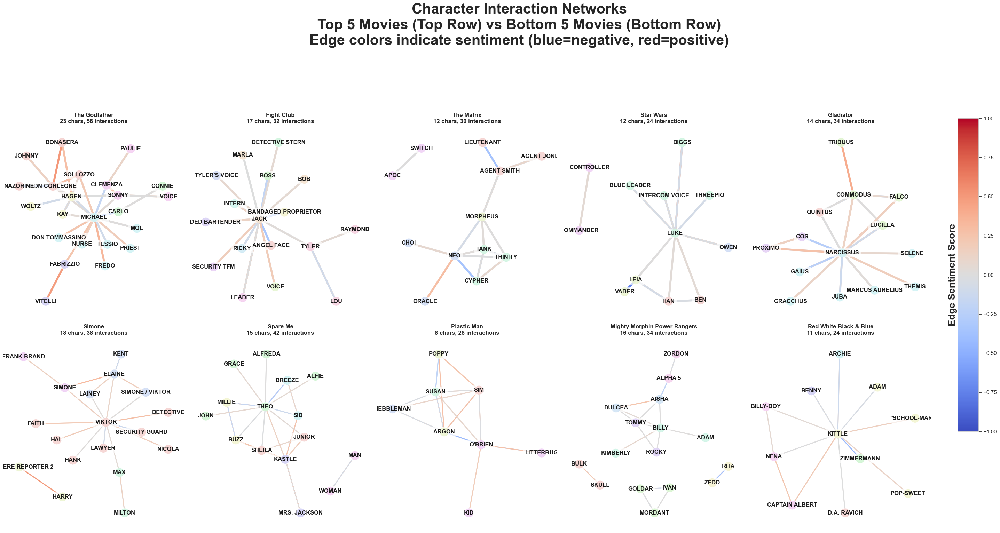

In [197]:
analyzer.plot_combined_interaction_networks(top_5_movie_ids, bottom_5_movie_ids, title=True)

4. **`plot_combined_sentiment_arcs(top_ids, bottom_ids)`**  
   Takes two lists of movie IDs (e.g., top 10 and bottom 10) and plots their cumulative sentiment arcs in a 2-row grid.  
   - The first row shows the top movies’ arcs, and the second row shows the bottom movies’ arcs.
   - Each arc is created by computing the cumulative average sentiment of lines across the movie.
   - Positive sentiment areas are shaded green; negative areas are shaded red.


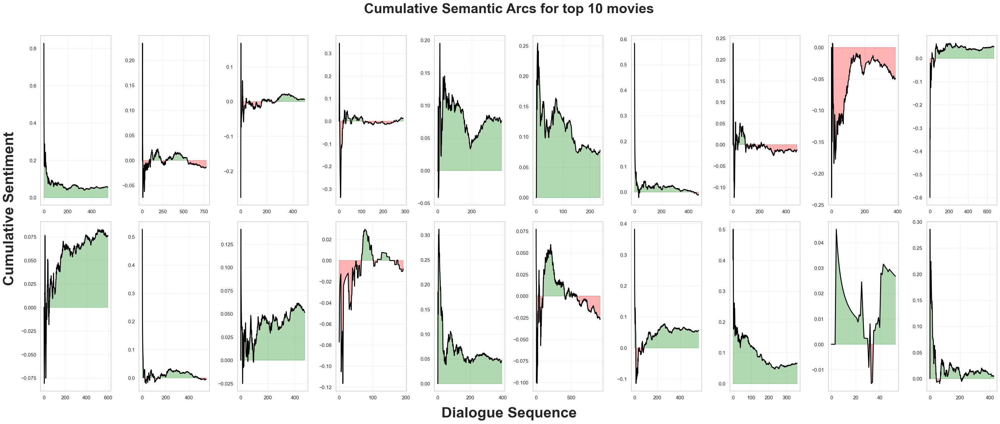

In [183]:
analyzer.plot_combined_sentiment_arcs(top_10_movie_ids, bottom_10_movie_ids, title=True)

5. **`plot_combined_emotional_keywords(top_ids, bottom_ids)`**  
   Identifies "emotional" keywords in the top and bottom sets of movies.  
   - Tokenizes each movie’s text, removes stopwords and punctuation.
   - Scores each word’s sentiment; selects words with notable sentiment (abs > 0.1).
   - Plots the top emotionally charged words (by frequency and sentiment magnitude) in a bar chart for each movie.

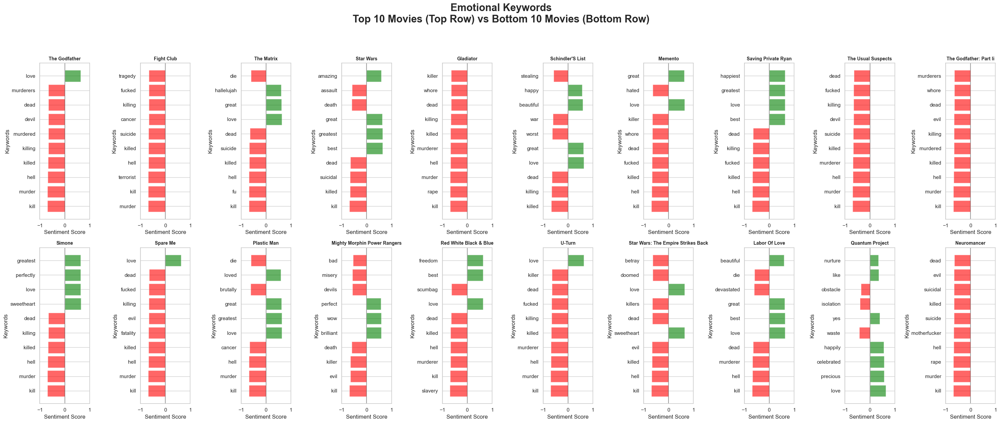

In [82]:
analyzer.plot_combined_emotional_keywords(top_10_movie_ids, bottom_10_movie_ids)

6. **`compute_advanced_network_metrics(movie_ids)`**  
   For a list of movie IDs, calculates a comprehensive set of network metrics:  
   - Basic metrics: number of nodes, edges, density, average degree.
   - Clustering coefficient, modularity (via Louvain), sentiment distribution of edges.
   - Path metrics (average shortest path, diameter), centralities (betweenness, closeness, eigenvector) in the largest connected component.
   - Degree assortativity.
   Returns these metrics in a DataFrame.

In [83]:
# Top/Bottom 100 for statistical analysis
top_100_movies = movie_titles.nlargest(100, 'Votes')
top_100_movie_ids = top_100_movies['MovieID'].tolist()

bottom_100_movies = movie_titles.nsmallest(100, 'Votes')
bottom_100_movie_ids = bottom_100_movies['MovieID'].tolist()

# Compute metrics for top 100 and bottom 100 movies
top_100_metrics_df = analyzer.compute_advanced_network_metrics(top_100_movie_ids)
bottom_100_metrics_df = analyzer.compute_advanced_network_metrics(bottom_100_movie_ids)

# Add "Group" column
top_100_metrics_df['Group'] = 'Top'
bottom_100_metrics_df['Group'] = 'Bottom'

# Combine into one DataFrame
combined_100_df = pd.concat([top_100_metrics_df, bottom_100_metrics_df], ignore_index=True)

# Save the DataFrame
combined_100_df.to_csv(r"Data\statistics\combined_100_df.csv", index=False)

# display DFs
print("Stats for Top 100 Movies:")
display(top_100_metrics_df)
print("Stats for Bottom 100 Movies:")
display(bottom_100_metrics_df)



Stats for Top 100 Movies:


,MovieID,Title,NumNodes,NumEdges,AvgDegree,Density,AvgClustering,Modularity,MeanEdgeSentiment,StdEdgeSentiment,SkewEdgeSentiment,KurtEdgeSentiment,AvgShortestPath,Diameter,AvgBetweenness,AvgCloseness,AvgEigenvector,Assortativity,Group
0,m203,the godfather,23,58,5.043478,0.114625,0.186304,0.359096,0.051864,0.193242,-0.311217,0.579088,2.407115,4,0.067005,0.432069,0.164241,-0.475741,Top
1,m348,fight club,17,32,3.764706,0.117647,0.000000,-0.035156,-0.025133,0.175814,-0.377471,-0.441152,2.073529,3,0.071569,0.498289,0.203606,-0.826463,Top
2,m433,the matrix,12,30,5.000000,0.227273,0.291667,0.277778,-0.022971,0.135743,-0.653074,1.205301,2.155556,4,0.144444,0.487120,0.261211,-0.035354,Top
3,m529,star wars,12,24,4.000000,0.181818,0.172619,0.253472,-0.019420,0.220051,-1.196451,3.149460,1.888889,3,0.111111,0.552072,0.280465,-0.571317,Top
4,m76,gladiator,14,34,4.857143,0.186813,0.382900,0.174740,0.082674,0.180302,0.314374,0.352043,1.901099,3,0.075092,0.543326,0.233387,-0.711427,Top
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,m153,"o brother, where art thou?",15,25,3.333333,0.123810,0.136508,0.494083,0.037242,0.148231,1.594038,5.499807,1.916667,3,0.130952,0.545326,0.297328,-0.405063,Top
96,m390,hotel rwanda,20,42,4.200000,0.110526,0.133918,-0.095238,0.023687,0.180624,-1.453547,3.298522,1.889474,2,0.049415,0.540731,0.190240,-0.868460,Top
97,m594,vertigo,10,18,3.600000,0.200000,0.000000,-0.074074,0.028411,0.131127,-1.529699,2.981068,1.955556,3,0.119444,0.533750,0.279628,-0.834764,Top
98,m249,as good as it gets,15,32,4.266667,0.152381,0.090370,0.388672,0.018741,0.177709,-0.881614,0.149602,2.219048,3,0.093773,0.467096,0.217864,-0.669303,Top


Stats for Bottom 100 Movies:


,MovieID,Title,NumNodes,NumEdges,AvgDegree,Density,AvgClustering,Modularity,MeanEdgeSentiment,StdEdgeSentiment,SkewEdgeSentiment,KurtEdgeSentiment,AvgShortestPath,Diameter,AvgBetweenness,AvgCloseness,AvgEigenvector,Assortativity,Group
0,m181,simone,18,38,4.222222,0.124183,0.148822,0.344875,0.077409,0.168324,-1.108261,4.446376,2.133333,4,0.080952,0.487517,0.209117,-0.567304,Bottom
1,m527,spare me,15,42,5.600000,0.200000,0.380808,0.208617,0.045302,0.149746,0.390292,0.552751,1.820513,3,0.074592,0.568452,0.242428,-0.503704,Bottom
2,m160,plastic man,8,28,7.000000,0.500000,0.550000,-0.038265,0.053766,0.184591,-0.629106,0.036551,1.642857,3,0.107143,0.640171,0.322165,-0.342466,Bottom
3,m135,mighty morphin power rangers,16,34,4.250000,0.141667,0.402083,0.413495,-0.007486,0.151667,-0.465880,1.025574,2.000000,4,0.142857,0.527128,0.288292,0.058893,Bottom
4,m488,red white black & blue,11,24,4.363636,0.218182,0.246465,-0.010417,0.016094,0.152524,-1.118319,2.108911,1.781818,2,0.086869,0.580323,0.268520,-0.822476,Bottom
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,m537,suburbia,12,46,7.666667,0.348485,0.452381,0.086957,0.051117,0.163093,-0.666377,0.579159,1.863636,4,0.086364,0.564238,0.250599,-0.350552,Bottom
96,m210,the crow: salvation,11,22,4.000000,0.200000,0.000000,0.301653,-0.125606,0.189379,-0.825459,0.681840,2.181818,4,0.131313,0.478015,0.267446,-0.571429,Bottom
97,m421,leviathan,10,34,6.800000,0.377778,0.605000,0.070934,-0.071164,0.140314,-0.618530,-0.445741,1.666667,3,0.083333,0.619821,0.288598,-0.553763,Bottom
98,m573,trouble in paradise,13,30,4.615385,0.192308,0.260806,0.268889,0.088691,0.163640,0.288243,-0.601931,2.018182,4,0.113131,0.518422,0.263345,-0.454616,Bottom


7. **`compute_cumulative_arcs(movie_ids, num_points=100)`**  
   Computes an averaged sentiment arc across multiple movies by normalizing each movie’s cumulative sentiment trajectory to a fixed length (`num_points`).  
   - Useful for comparing overall sentiment progression trends across different sets of movies.


In [42]:
arc = analyzer.compute_cumulative_arcs(top_10_movie_ids, num_points=100)
print(arc)


[ 0.05359     0.01108306 -0.01028548  0.02984072  0.01475417  0.01574719
  0.01047408  0.00532413  0.01937181  0.03078508  0.02828061  0.03712987
  0.03708335  0.03287518  0.02942237  0.02998781  0.03052022  0.02727753
  0.02365965  0.02100042  0.02199633  0.02715873  0.02978003  0.03123283
  0.03494118  0.03462762  0.03111334  0.03298531  0.03481925  0.03625554
  0.03386541  0.03733273  0.03699372  0.03792096  0.03676462  0.03494708
  0.03434293  0.03189596  0.03210034  0.03176824  0.03315424  0.031191
  0.0292329   0.02917879  0.0324732   0.02855795  0.02827679  0.02709541
  0.02675561  0.02632929  0.02434265  0.02501382  0.02507321  0.02600705
  0.02513379  0.02483889  0.0236981   0.02362935  0.0235227   0.0224697
  0.02255223  0.021556    0.02000408  0.01997384  0.02002587  0.02241589
  0.02230032  0.02355808  0.02211317  0.02211681  0.02122146  0.0210746
  0.02148014  0.02167492  0.02205281  0.02249537  0.02192113  0.02150011
  0.01999864  0.02137997  0.02183458  0.02263075  0.022

8. **`plot_average_arcs_top_bottom_20(top_20_ids, bottom_20_ids)`**  
   Uses `compute_cumulative_arcs` to produce average sentiment arcs for top 20 vs bottom 20 movies and plots them together on one graph.


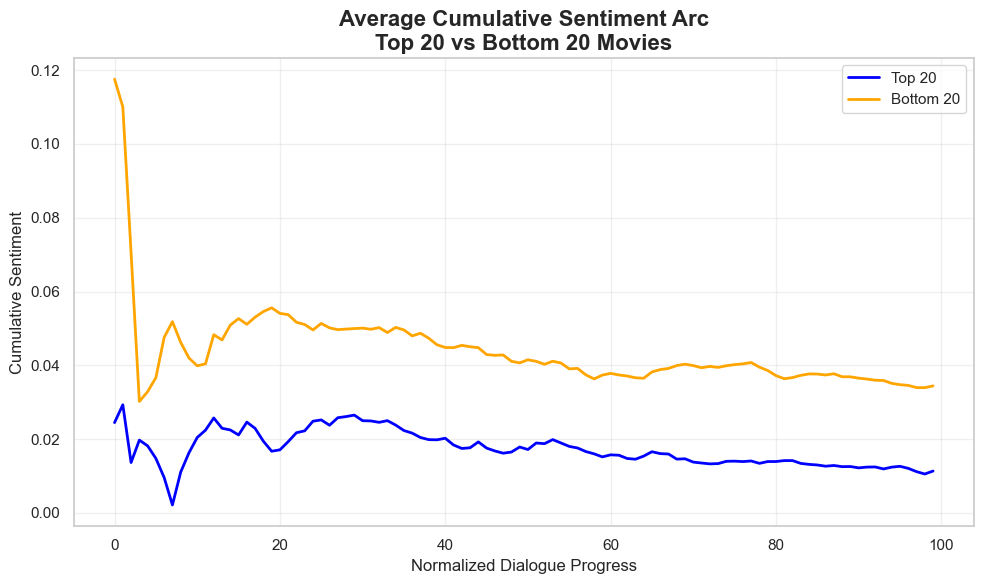

In [43]:
# Compute top/bottom 20 sets
top_20_movies = movie_titles.nlargest(20, 'Votes')
top_20_movie_ids = top_20_movies['MovieID'].tolist()

bottom_20_movies = movie_titles.nsmallest(20, 'Votes')
bottom_20_movie_ids = bottom_20_movies['MovieID'].tolist()

analyzer.plot_average_arcs_top_bottom_20(top_20_movie_ids, bottom_20_movie_ids)

9. **`plot_average_arcs_per_genre(num_points=100)`**  
   Categorizes movies by genre and computes an average sentiment arc for each genre.  
   - Plots all genre arcs on one figure, allowing easy comparison of how sentiment dynamics vary by genre.

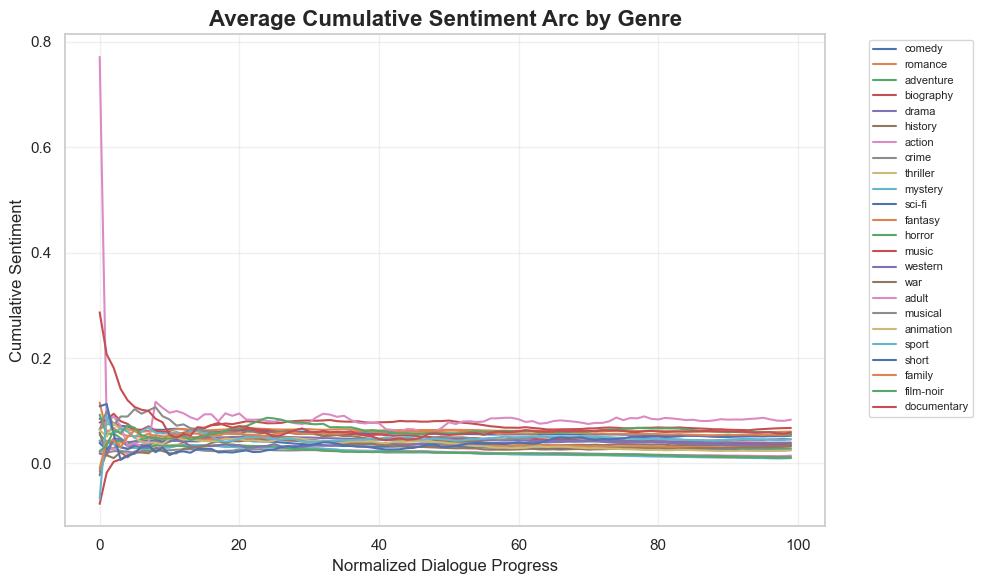

In [44]:
analyzer.plot_average_arcs_per_genre(num_points=100)

### **Statistical Analysis (Semantic Networks)**

In the previous parts, we constructed a comprehensive dataset of network metrics and sentiment-related features derived from our semantic networks using the `MovieDialogueAnalyzer`. This dataset—containing metrics like average degree, modularity, clustering, as well as sentiment-based edge features—serves as the foundation for the statistical tests and classification procedures that follow.

Having generated a DataFrame that splits movies into "Top" and "Bottom" groups (for instance, by votes or rating), we now proceed to more rigorous statistical testing. Here, we use non-parametric Mann-Whitney tests to identify which network-level metrics differ significantly between these two groups, while applying multiple comparison corrections to maintain statistical validity. Additionally, we will build a predictive model (logistic regression) to see if these network metrics can classify movies as "Top" vs. "Bottom." We further confirm the significance of our classifier’s performance with a permutation test.

**In other words:** The code below builds upon the DataFrame already created by the `MovieDialogueAnalyzer` class and its associated analyses. Now that we have a well-structured dataset, we apply a series of statistical procedures to rigorously test the differences and predictive power of the extracted metrics.


In [84]:
import os
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.utils import shuffle

# Create output directory for tables if it doesn't exist
os.makedirs("Tables", exist_ok=True)

combined_20_df = pd.read_csv(r"Data\statistics\combined_100_df.csv")

# ------------------------------------------------------------
# STEP 1: Mann-Whitney Tests with Multiple Comparison Correction
# ------------------------------------------------------------
metrics_to_test = [
    'NumNodes', 'NumEdges', 'AvgDegree', 'Density', 'AvgClustering', 'Modularity',
    'MeanEdgeSentiment', 'StdEdgeSentiment', 'SkewEdgeSentiment', 'KurtEdgeSentiment',
    'AvgShortestPath', 'Diameter', 'AvgBetweenness', 'AvgCloseness', 'AvgEigenvector',
    'Assortativity'
]

# Compute the mean of each metric for the top and bottom groups
group_means = combined_20_df.groupby('Group')[metrics_to_test].mean()

# Save group means to a LaTeX table
group_means_latex = group_means.T
group_means_latex.to_latex("Tables/means_by_group.tex", float_format="%.4f")

top_values_dict = {}
bottom_values_dict = {}
p_values = []

# Perform Mann-Whitney tests
for metric in metrics_to_test:
    top_values = combined_20_df.loc[combined_20_df['Group'] == 'Top', metric].dropna()
    bottom_values = combined_20_df.loc[combined_20_df['Group'] == 'Bottom', metric].dropna()
    if len(top_values) > 0 and len(bottom_values) > 0:
        stat, p_value = mannwhitneyu(top_values, bottom_values, alternative='two-sided')
        p_values.append(p_value)
    else:
        p_values.append(np.nan)

# Multiple comparison correction (Benjamini-Hochberg)
valid_indices = [i for i, v in enumerate(p_values) if not np.isnan(v)]
valid_p_values = [p_values[i] for i in valid_indices]

reject, p_adjusted, _, _ = multipletests(valid_p_values, method='fdr_bh')

# Prepare a DataFrame for Mann-Whitney test results
results_data = []
for i, metric in enumerate(metrics_to_test):
    if i in valid_indices:
        adj_idx = valid_indices.index(i)
        results_data.append({
            'Metric': metric,
            'Original p-value': p_values[i],
            'Adjusted p-value': p_adjusted[adj_idx],
            'Reject H0 (FDR)': reject[adj_idx]
        })
    else:
        # Missing values scenario
        results_data.append({
            'Metric': metric,
            'Original p-value': np.nan,
            'Adjusted p-value': np.nan,
            'Reject H0 (FDR)': np.nan
        })

mw_results_df = pd.DataFrame(results_data)
mw_results_df.set_index('Metric', inplace=True)

# Save Mann-Whitney results to a LaTeX table
mw_results_df.to_latex("Tables/mannwhitney_results.tex", float_format="%.4e")

# ------------------------------------------------------------
# STEP 2: Classification with Cross-Validation
# ------------------------------------------------------------
# Prepare features and target for classification
data = combined_20_df.dropna(subset=metrics_to_test)  # Drop rows with NaNs in metrics
X = data[metrics_to_test].values
y = (data['Group'] == 'Top').astype(int).values  # Top=1, Bottom=0

clf = LogisticRegression(max_iter=1000)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')

mean_acc = np.mean(scores)
std_acc = np.std(scores, ddof=1)

# Create a DataFrame for classification results
classification_results_df = pd.DataFrame({
    'Mean Accuracy': [mean_acc],
    'Std Accuracy': [std_acc]
})

# Save classification results to a LaTeX table
classification_results_df.to_latex("Tables/classification_accuracy.tex", float_format="%.4f", index=False)

# ------------------------------------------------------------
# STEP 3: Permutation Test for Classifier
# ------------------------------------------------------------
n_permutations = 1000
permutation_accuracies = []

for _ in range(n_permutations):
    y_perm = shuffle(y, random_state=None)
    perm_score = np.mean(cross_val_score(clf, X, y_perm, cv=cv, scoring='accuracy'))
    permutation_accuracies.append(perm_score)

permutation_accuracies = np.array(permutation_accuracies)
p_value_permutation = np.mean(permutation_accuracies >= mean_acc)

# Create a DataFrame for permutation test results
perm_test_results_df = pd.DataFrame({
    'Observed Accuracy': [mean_acc],
    'p-value (Permutation)': [p_value_permutation]
})

# Save permutation test results to a LaTeX table
perm_test_results_df.to_latex("Tables/permutation_results.tex", float_format="%.4f", index=False)

In [85]:
# Print summaries to console
print("\nMean values for each metric by group:")
display(group_means.T)

print("\nMann-Whitney Tests with Benjamini-Hochberg correction:")
display(mw_results_df)

print("\nClassification Accuracy (Logistic Regression):")
display(classification_results_df)

print("\nPermutation Test Results:")
display(perm_test_results_df)



Mean values for each metric by group:


Group,Bottom,Top
NumNodes,13.040000,15.880000
NumEdges,30.080000,34.530000
AvgDegree,4.604409,4.347922
Density,0.236454,0.176835
AvgClustering,0.240862,0.185440
Modularity,0.201285,0.266762
MeanEdgeSentiment,0.034837,0.024559
StdEdgeSentiment,0.156094,0.164334
SkewEdgeSentiment,-0.066126,-0.054815
KurtEdgeSentiment,0.799651,1.078703



Mann-Whitney Tests with Benjamini-Hochberg correction:


,Original p-value,Adjusted p-value,Reject H0 (FDR)
Metric,,,
NumNodes,0.000415,0.003320,True
NumEdges,0.044796,0.089593,False
AvgDegree,0.078337,0.117593,False
Density,0.000069,0.001104,True
AvgClustering,0.027611,0.063111,False
Modularity,0.007965,0.021241,True
MeanEdgeSentiment,0.266775,0.328338,False
StdEdgeSentiment,0.080845,0.117593,False
SkewEdgeSentiment,0.952265,0.952265,False



Classification Accuracy (Logistic Regression):


,Mean Accuracy,Std Accuracy
0,0.603077,0.118785



Permutation Test Results:


,Observed Accuracy,p-value (Permutation)
0,0.603077,0.005


### **Semantic Arc Clustering**

Having analyzed various network structures and their associated sentimental patterns, we now turn to a more nuanced perspective: **clustering movies based on their sentiment arcs.** Our previous steps gave us tools to extract sentiment arcs from movie dialogue lines, compute similarities between these arcs, and then construct networks from these similarities.

In this stage, we leverage these sentiment-based representations of movies to identify clusters using the Louvain community detection algorithm. By treating movies as nodes and their pairwise sentiment arc similarities as edges, we form a graph on which we can run clustering. This allows us to reveal groups of movies that share common sentiment trajectories over their dialogues, potentially corresponding to similar storytelling patterns or thematic structures.

After identifying clusters, we also annotate these clusters with information about their most frequent genres and highlight representative movies. This approach integrates semantic (textual), sentiment (emotional), and structural (network) analysis into a single framework, offering a richer understanding of the cinematic landscape.

**In other words:** The code below uses sentiment arcs (computed from the lines of each movie) to create a similarity network of movies. It then applies Louvain clustering to identify communities of movies with similar sentiment arcs. Finally, it visualizes these clusters, annotating each with its top genres and highlighting representative films.


In [86]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from community import community_louvain
from sklearn.metrics.pairwise import cosine_similarity
# from semantic_clustering import load_movie_data, MovieDialogueAnalyzer
import pandas as pd
from matplotlib.lines import Line2D
import math
import ast
from matplotlib import font_manager

def prepare_sentiment_data(movie_ids, movie_lines, sia):
    """Prepare sentiment arcs as a feature matrix for clustering.
    
    For each movie:
    - Extract line-by-line sentiments using `sia`.
    - Compute a cumulative average sentiment arc.
    - Interpolate the arc to a fixed length (100 points) for uniform comparison.
    
    Returns:
    - A numpy array (movies x 100) of sentiment arcs.
    """
    sentiment_data = []
    for movie_id in movie_ids:
        movie_lines_filtered = movie_lines[movie_lines['MovieID'] == movie_id].sort_values('LineID')
        movie_lines_filtered['Sentiment'] = movie_lines_filtered['Text'].apply(
            lambda x: sia.polarity_scores(x)['compound']
        )
        movie_lines_filtered['CumulativeAverage'] = movie_lines_filtered['Sentiment'].expanding().mean()
        x_original = np.linspace(0, 1, len(movie_lines_filtered))
        y_original = movie_lines_filtered['CumulativeAverage'].values
        f_interp = interp1d(x_original, y_original, kind='linear', fill_value="extrapolate")
        x_resampled = np.linspace(0, 1, 100)
        y_resampled = f_interp(x_resampled)
        sentiment_data.append(y_resampled)
    return np.array(sentiment_data)

def create_similarity_graph(sentiment_data):
    """Create a graph where each node is a movie, and edges represent cosine similarity of their sentiment arcs.
    
    - Compute the cosine similarity between every pair of sentiment arcs.
    - Add an edge if similarity > 0.5 (a chosen threshold).
    
    Returns:
    - A NetworkX Graph object representing the similarity network.
    """
    similarity_matrix = cosine_similarity(sentiment_data)
    graph = nx.Graph()
    for i in range(len(similarity_matrix)):
        graph.add_node(i)
    for i in range(len(similarity_matrix)):
        for j in range(i + 1, len(similarity_matrix)):
            similarity = similarity_matrix[i, j]
            if similarity > 0.5:
                graph.add_edge(i, j, weight=similarity)
    return graph

def cluster_with_louvain(graph):
    """Cluster movies using the Louvain algorithm on the similarity graph.
    
    Returns:
    - partition: A dictionary mapping each node (movie) to a cluster ID.
    """
    partition = community_louvain.best_partition(graph, weight='weight', resolution=1.0)
    return partition

def get_genre_frequencies(partition, movie_ids, movie_titles):
    """Calculate genre frequencies for each cluster.
    
    For each cluster identified by partition:
    - Extract the genres of the movies in that cluster.
    - Count how often each genre appears.
    
    Returns:
    - genre_frequencies: dict of cluster_id -> {genre: count}
    """
    genre_frequencies = {}
    movie_titles = movie_titles.set_index('MovieID')
    for movie_idx, cluster_id in partition.items():
        movie_id = movie_ids[movie_idx]
        genres = movie_titles.loc[movie_id, 'Genres'].split('|')
        if cluster_id not in genre_frequencies:
            genre_frequencies[cluster_id] = {}
        for genre in genres:
            genre_frequencies[cluster_id][genre] = genre_frequencies[cluster_id].get(genre, 0) + 1
    return genre_frequencies

def plot_clusters_louvain(sentiment_data, partition, movie_ids, movie_titles, genre_frequencies, enable_title=True):
    """Visualize sentiment arcs for each Louvain cluster with genre annotations and top movies.
    
    Parameters
    ----------
    sentiment_data : np.ndarray
        The array of sentiment arcs for each movie (movies x 100).
    partition : dict
        A dictionary from node index to cluster ID.
    movie_ids : list
        The list of movie IDs corresponding to each sentiment_data row.
    movie_titles : pd.DataFrame
        DataFrame containing MovieID, Title, Votes, Genres.
    genre_frequencies : dict
        A dictionary with cluster_id as keys and genre frequency dictionaries as values.
    enable_title : bool
        Whether to display the main figure title.
    """
    # Group movies by clusters
    clusters = {}
    for movie_idx, cluster_id in partition.items():
        clusters.setdefault(cluster_id, []).append(movie_idx)
    
    movie_titles_indexed = movie_titles[movie_titles['MovieID'].isin(movie_ids)].copy()
    n_clusters = len(clusters)
    n_cols = 1
    n_rows = math.ceil(n_clusters / n_cols)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 7 * n_rows))
    if n_clusters == 1:
        axes = [axes]
    
    cluster_title_fontsize = 28
    legend_fontsize = 24
    title_fontsize = 28
    legend_font_prop = font_manager.FontProperties(size=legend_fontsize, weight='bold')
    
    for cluster_idx, (cluster_id, movies) in enumerate(clusters.items()):
        ax = axes[cluster_idx]
        cluster_movies = [movie_ids[movie_idx] for movie_idx in movies]
        
        # Plot all arcs in the cluster as a background
        for m_i, movie_idx in enumerate(movies):
            ax.plot(np.linspace(0, 1, 100), sentiment_data[movie_idx], alpha=0.3,
                    label='Individual Movies' if m_i == 0 else "")
        
        # Highlight top 5 movies by Votes
        movie_data = movie_titles_indexed[movie_titles_indexed['MovieID'].isin(cluster_movies)]
        top_movies = movie_data.nlargest(5, 'Votes')
        
        for _, movie_row in top_movies.iterrows():
            movie_id = movie_row['MovieID']
            idx = movie_ids.index(movie_id)
            ax.plot(np.linspace(0, 1, 100), sentiment_data[idx], linewidth=2,
                    label=f"Top Movie: {movie_row['Title']}")
        
        # Compute top genres
        genres = genre_frequencies[cluster_id]
        sorted_genres = sorted(genres.items(), key=lambda x: x[1], reverse=True)
        
        bullet_points = []
        for genre_str, count in sorted_genres[:3]:
            try:
                parsed_genres = ast.literal_eval(genre_str)
                pretty_genres = ", ".join(parsed_genres)
            except:
                pretty_genres = genre_str.strip("[]' ")
            
            bullet_points.append(f"• {pretty_genres} ({count})")
        
        top_genres_label = "Top Genres:\n" + "\n".join(bullet_points)
        
        # Set title and grid
        ax.set_title(f"Cluster {cluster_idx + 1} (Movies: {len(movies)})", 
                     fontsize=cluster_title_fontsize, fontweight='bold')
        ax.grid(True, alpha=0.3)
        
        # Modify legend
        handles, labels = ax.get_legend_handles_labels()
        
        # Add a dummy handle for top genres
        top_genres_handle = Line2D([], [], color='none')
        handles.append(top_genres_handle)
        labels.append(top_genres_label)
        
        if len(handles) > 0:
            ax.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.,
                      prop=legend_font_prop)
        
        # Remove x and y labels (use global labels)
        ax.set_xlabel("")
        ax.set_ylabel("")
    
    # Remove extra axes if any
    for k in range(cluster_idx + 1, len(axes)):
        axes[k].axis('off')
    
    # Main figure title if enabled
    if enable_title:
        plt.suptitle("Sentiment Clustering of Movies Using Louvain Algorithm", 
                     fontsize=title_fontsize, y=1.02, fontweight='bold')
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    
    # Global x and y labels
    fig.text(0.25, 0.02, "Dialogue Sequence", ha='center', va='center', fontsize=28, fontweight='bold')
    fig.text(-0.002, 0.5, "Cumulative Sentiment", ha='center', va='center', rotation='vertical', fontsize=28, fontweight='bold')
    
    plt.show()
    # plt.savefig('Figures/sentiment_clusters_louvain_annotated.png', dpi=500, bbox_inches='tight')
    # plt.close()

The following code will do the following using the class we defined above:

- **Loading movie dialog data:** The process begins by extracting the raw dialogue lines, conversations, and titles that form the foundation of our dataset. This initial step ensures we have all necessary textual and structural information ready for sentiment computation and subsequent clustering.

- **Filtering and selecting movies:**  After ensuring the 'Votes' field is numeric, we focus on those movies that have valid vote counts. This filtering step narrows our analysis to a clean, consistent subset, ensuring that sentiment arcs and clustering are performed on well-documented films.

- **Preparing sentiment arcs:** For each selected movie, we compute a sentiment arc representing its cumulative emotional trajectory across the dialogue. The arcs are normalized and resampled to a fixed length, allowing for meaningful comparisons between different movies’ sentiment progressions.

- **Creating a similarity graph:**  Once all sentiment arcs are ready, we measure how closely these arcs resemble one another. We construct a similarity graph where each movie is a node, and edges connect movies whose sentiment trajectories share a strong affinity. This graph is the structural basis for detecting communities of similarly emotive narratives.

- **Clustering with the Louvain algorithm:** Applying the Louvain algorithm to the similarity graph identifies clusters of movies that exhibit similar sentiment dynamics. This community detection helps reveal underlying groupings of films that follow comparable emotional patterns throughout their dialogues.



In [87]:
# We begin by loading the raw dialogue data and titles to form our foundational dataset.
print("Loading movie dialog data...")
movie_lines, movie_conversations, movie_titles = load_movie_data()
analyzer = MovieDialogueAnalyzer(movie_lines, movie_conversations, movie_titles)

# Next, we prepare a subset of movies, ensuring that the 'Votes' column is numeric and filtering out any missing values.
movie_titles['Votes'] = pd.to_numeric(movie_titles['Votes'], errors='coerce')
all_movies = movie_titles.dropna(subset=['Votes'])
movie_ids = all_movies['MovieID'].tolist()

# Using the filtered set of movies, we compute their sentiment arcs. 
# These arcs represent the cumulative average sentiment over each movie’s dialogue.
print("Preparing sentiment arcs...")
sentiment_data = prepare_sentiment_data(movie_ids, movie_lines, analyzer.sia)

# With sentiment arcs ready, we construct a similarity graph where edges link movies with similar sentiment trajectories.
print("Creating similarity graph...")
similarity_graph = create_similarity_graph(sentiment_data)

Loading movie dialog data...
Loading movie dialog dataset...
Processing conversations...
Loaded 304713 lines from 617 movies
Found 83079 valid conversations
Preparing sentiment arcs...
Creating similarity graph...


Applying the Louvain algorithm to the similarity graph clusters the movies into communities based on their sentiment arc similarity.

In [88]:
print("Clustering with Louvain algorithm...")
partition = cluster_with_louvain(similarity_graph)

print(f"Number of clusters: {len(set(partition.values()))}")

Clustering with Louvain algorithm...
Number of clusters: 4


Once clusters are defined, we analyze the distribution of genres within each cluster to understand their thematic composition.

In [89]:
print("Calculating genre frequencies...")
genre_frequencies = get_genre_frequencies(partition, movie_ids, movie_titles)

Calculating genre frequencies...


Finally, we visualize the clusters, plotting their sentiment arcs, highlighting top movies, and annotating dominant genres

Visualizing clusters...


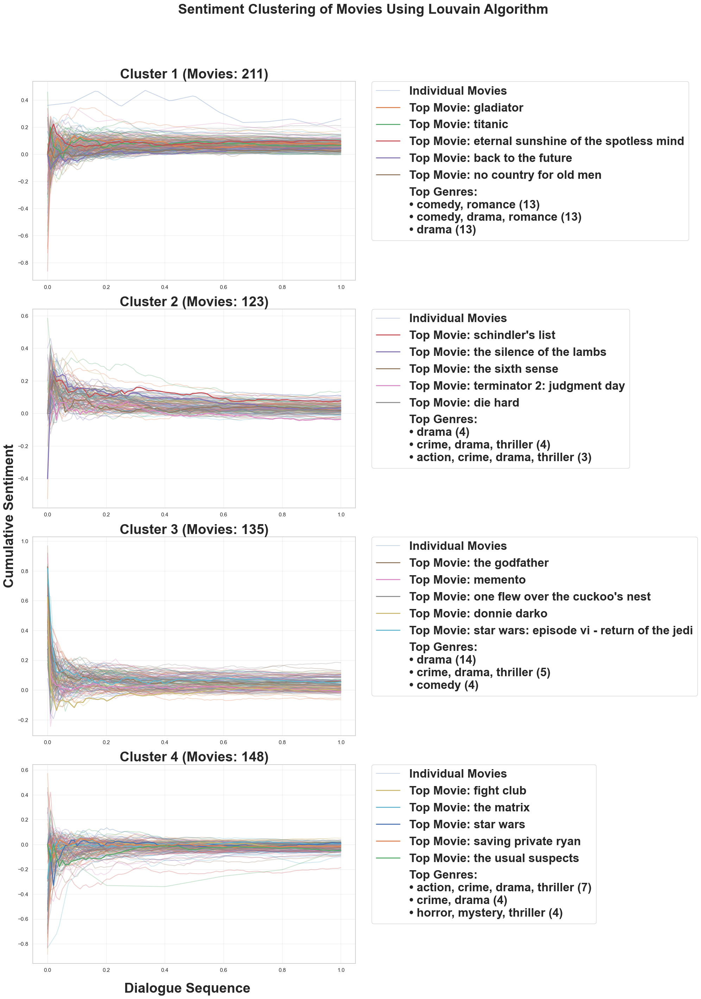

In [90]:
print("Visualizing clusters...")
plot_clusters_louvain(sentiment_data, partition, movie_ids, movie_titles, genre_frequencies, enable_title=True)

## **Sentiment Analysis of Movie Dialogues (Temporal patterns & Genre-differences)**

Sentiment analysis is a technique in natural language processing (NLP) that aims to determine the emotional tone of a given piece of text. It assigns a score to the text, typically ranging from positive to negative, to quantify its sentiment. In the context of movies, sentiment analysis provides valuable insights into the emotional tone of dialogues, helping to understand how the mood of a film evolves over time or how characters express their emotions. This approach can be useful in analyzing the impact of specific lines, characters, or scenes on the overall sentiment of the movie.

For this analysis, the VADER (Valence Aware Dictionary and sEntiment Reasoner) sentiment analyzer is employed. The following code performs sentiment analysis on movie dialogues and aggregates the results to explore the overall sentiment of each movie.

In [169]:
import kagglehub
import pandas as pd
import os
import numpy as np
import ast
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from matplotlib.cm import tab20  # Colormap for distinct colors
import matplotlib.ticker as ticker
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
from collections import defaultdict, Counter
import math

In [170]:
# Download necessary NLTK resources
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

# Initialize SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

# Load English stop words
stop_words = set(stopwords.words('english'))

# Function to clean text
def clean_text(text):
    tokens = word_tokenize(text)  # Tokenize text
    # Remove stop words and punctuation, convert to lowercase
    cleaned_tokens = [word.lower() for word in tokens if word.lower() not in stop_words and word.isalnum()]
    return " ".join(cleaned_tokens)  # Reconstruct the cleaned text

# Calculate sentiment for all movies
def calculate_all_movie_sentiments(movie_lines, movie_titles):
    # Clean and calculate sentiment for each line
    # Replace None or NaN values in the Text column with an empty string
    movie_lines['Text'] = movie_lines['Text'].fillna("")
    movie_lines['CleanedText'] = movie_lines['Text'].apply(clean_text)
    movie_lines['SentimentScore'] = movie_lines['CleanedText'].apply(lambda text: sia.polarity_scores(text)['compound'])
    
    # Group by MovieID to calculate average sentiment score for each movie
    avg_sentiments = movie_lines.groupby('MovieID')['SentimentScore'].mean().reset_index()
    avg_sentiments.rename(columns={'SentimentScore': 'AverageSentiment'}, inplace=True)
    
    # Merge with MovieTitles to include movie information (Title, Genres, Votes, and Rating)
    merged_df = pd.merge(avg_sentiments, movie_titles, on='MovieID')
    
    # Ensure Votes and Rating columns are numeric for sorting
    merged_df['Votes'] = pd.to_numeric(merged_df['Votes'], errors='coerce')
    merged_df['Rating'] = pd.to_numeric(merged_df['Rating'], errors='coerce')
    
    return merged_df

# Filter top 10 movies based on votes and rating
def filter_top_10_movies(all_movies_df):
    # Sort by Votes (descending) and then by Rating (descending)
    top_10_movies = all_movies_df.sort_values(['Votes', 'Rating'], ascending=[False, False]).head(10)
    return top_10_movies

# Formatting for Markdown output
def display_movies(result_df):
    result_df['Genres'] = result_df['Genres'].apply(lambda x: str(x))  # Convert Genres list to string for display
    from tabulate import tabulate
    print(tabulate(result_df[['Title', 'Genres', 'AverageSentiment']], headers='keys', tablefmt='grid'))


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\jbhan\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jbhan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jbhan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Genres and sentiment scores of top 10 movies according their votes and ratings can be seen in the table below.

In [171]:
all_movies_with_sentiments = calculate_all_movie_sentiments(movie_lines, movie_titles)
top_10_movies = filter_top_10_movies(all_movies_with_sentiments)
display_movies(top_10_movies)

+-----+------------------------+-------------------------------------------------------------+--------------------+
|     | Title                  | Genres                                                      |   AverageSentiment |
+=====+========================+=============================================================+====================+
| 117 | the godfather          | ['crime', 'drama', 'thriller']                              |        0.0818791   |
+-----+------------------------+-------------------------------------------------------------+--------------------+
| 277 | fight club             | ['crime', 'drama', 'mystery', 'thriller']                   |        0.0014068   |
+-----+------------------------+-------------------------------------------------------------+--------------------+
| 372 | the matrix             | ['action', 'adventure', 'adventure', 'adventure', 'sci-fi'] |        0.0292929   |
+-----+------------------------+----------------------------------------

#### **Average Sentiment Analysis by Genre over Decades**
The following part of our code analyses how the emotional tone of different movie genres has evolved over decades using sentiment analysis. It combines movie dialogues with genre and release year data, calculates average sentiment scores, and organizes them by decade and genre. The goal is to reveal trends in how genres like Comedy, Drama, and Thriller have shifted emotionally over time, reflecting changes in storytelling and audience preferences.

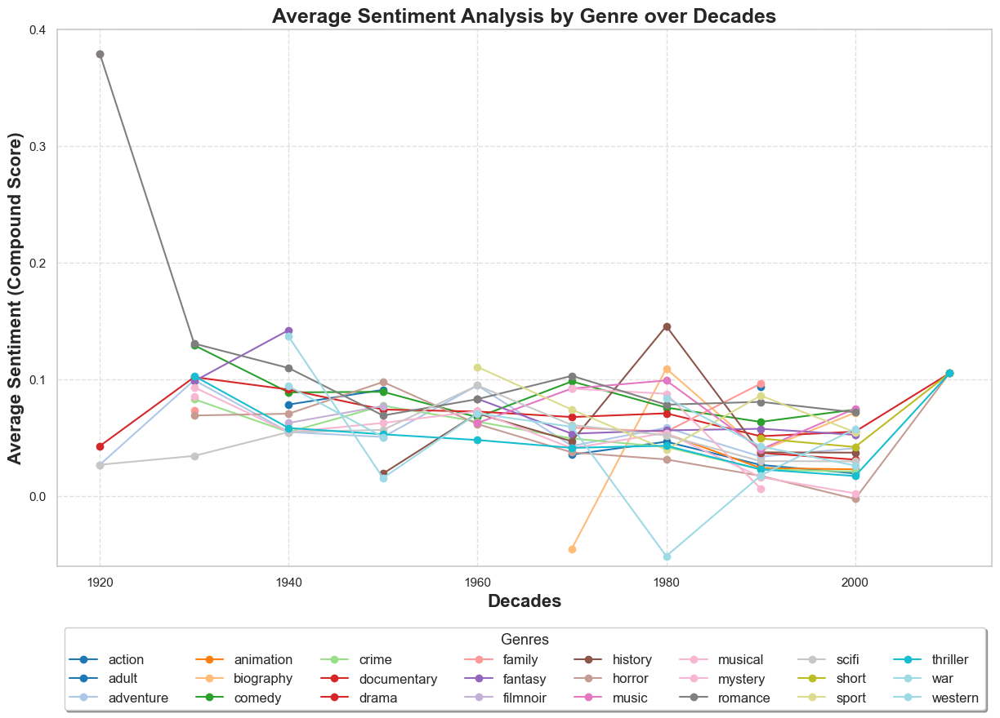

In [172]:

# Merge movie_lines with movie_titles on MovieID
movies_merged_df = movie_lines.merge(all_movies_with_sentiments, on='MovieID')


# Clean the Genres column
movies_merged_df['Genres'] = (
    movies_merged_df['Genres']
    .astype(str)
    .str.replace(r"[^\w\s,]", "", regex=True)  # Remove special characters except commas
    .str.strip()  # Remove leading/trailing whitespace
    .str.lower()  # Convert to lowercase
    .str.split()  # Split into individual words
)

# Explode the Genres column
movies_merged_df = movies_merged_df.explode('Genres')

# Clean again after exploding
movies_merged_df['Genres'] = movies_merged_df['Genres'].str.strip()  # Remove extra spaces
movies_merged_df['Genres'] = movies_merged_df['Genres'].str.replace(r",", "", regex=False)  # Remove any leftover commas

# Filter out empty or malformed genres
movies_merged_df = movies_merged_df[movies_merged_df['Genres'] != ""]
movies_merged_df = movies_merged_df.dropna(subset=['Genres'])  # Drop any NaN values

# Remove duplicate genres (e.g., 'documentary' vs 'documentary,')
movies_merged_df['Genres'] = movies_merged_df['Genres'].str.strip()

# Ensure 'Year' is numeric and calculate decades
movies_merged_df['Year'] = pd.to_numeric(movies_merged_df['Year'], errors='coerce')
movies_merged_df = movies_merged_df.dropna(subset=['Year'])
movies_merged_df['Year'] = movies_merged_df['Year'].astype(int)
movies_merged_df['Decade'] = (movies_merged_df['Year'] // 10) * 10

# Calculate average sentiment by Decade and Genre
decade_sentiment = (
    movies_merged_df.groupby(['Decade', 'Genres'])['AverageSentiment']
    .mean()
    .reset_index()
)

# Pivot the data for plotting (Decades as rows, Genres as columns)
pivot_table = decade_sentiment.pivot(index='Decade', columns='Genres', values='AverageSentiment')

# Assign unique colors dynamically
unique_genres = pivot_table.columns
num_genres = len(unique_genres)
colormap = plt.cm.get_cmap('tab20', num_genres)  # Generate enough distinct colors for all genres

# Create a dictionary mapping each genre to a unique color
genre_colors = {genre: colormap(i) for i, genre in enumerate(unique_genres)}

# Plot sentiment trends for all genres by decade
plt.figure(figsize=(13, 9))  # Adjusted figure size for compact display

for genre in pivot_table.columns:
    plt.plot(
        pivot_table.index, 
        pivot_table[genre], 
        label=genre, 
        color=genre_colors[genre], 
        marker='o', 
        markersize=6  # Adjusted marker size for readability
    )

# Customize the plot
plt.title('Average Sentiment Analysis by Genre over Decades', fontsize=18, fontweight='bold')
plt.xlabel('Decades', fontsize=16, fontweight='bold')
plt.ylabel('Average Sentiment (Compound Score)', fontsize=16, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.6)

# Adjust the legend with a border and shadow
plt.legend(
    title='Genres',
    title_fontsize=13,
    loc='upper center',
    # Move the legend slightly down
    bbox_to_anchor=(0.5, -0.1),
    ncol=8,
    fontsize=12,
    # Add a border around the legend
    frameon=True,
    # Add a shadow for visual separation
    shadow=True     

)

# Adjust y-axis scale for better clarity
plt.ylim(-0.06, 0.4)

# Final layout adjustments
plt.tight_layout()
plt.show()


The plot above visualizes the average sentiment trends of movie genres over decades. The x-axis represents the decades, starting from the earliest available data while the y-axis shows the average compound sentiment score, derived from analyzing the emotional tone of dialog across movies.

Most genres shows relatively stable sentiment scores, which suggests that while the tone may vary, the average sentiment within genres remains consistent across time. However, some genres show sharp peaks and dips in sentiment during specific decades. The reason for this can be the influence of historical events or cultural shifts.

The genres *"Romance"* and *"Comedy"* display consistently positive sentiment across decades, reflecting their inherently cheerful and lighthearted themes. The *War* genre shows significant variability across decades, with a noticeable dip in sentiment scores during the 1980s, reaching the most negative value on the graph. This could be reflective of the themes and tone of war movies during this time. *"Thriller"* genre tends to cluster toward the lower range of sentiment scores across all decades. This aligns with the nature of the genre, which often relies on suspense, fear, and tension to drive their narratives.

After 2000s, several genres show a clear upward trend in sentiment scores. This could be indicative of a shift toward more uplifting, family-friendly, or optimistic storytelling in modern cinema. For example, studios like Pixar and DreamWorks popularized feel-good, emotionally engaging stories. Moreover, interest in lighthearted romantic comedies rose, too. Interestingly, even traditionally darker genres like *"War"* show slight increases in sentiment post-2000. This can be an indicator of change in audience preference. 

#### **Sentiment of Individual Dialogues in a Specific Movie**

Analyzing individual movies allows us to track how the emotional tone evolves throughout the film, providing insights into its narrative structure and character development. By plotting the sentiment of each dialogue and the cumulative average sentiment over time, we can observe shifts in mood, such as rising tension and emotional peaks. The plot also includes a neutral sentiment line for comparison, making it easier to see whether the film leans positive or negative overall. Additionally, a heatmap visualizes the sentiment distribution, highlighting patterns or clusters of emotional intensity within the movie.

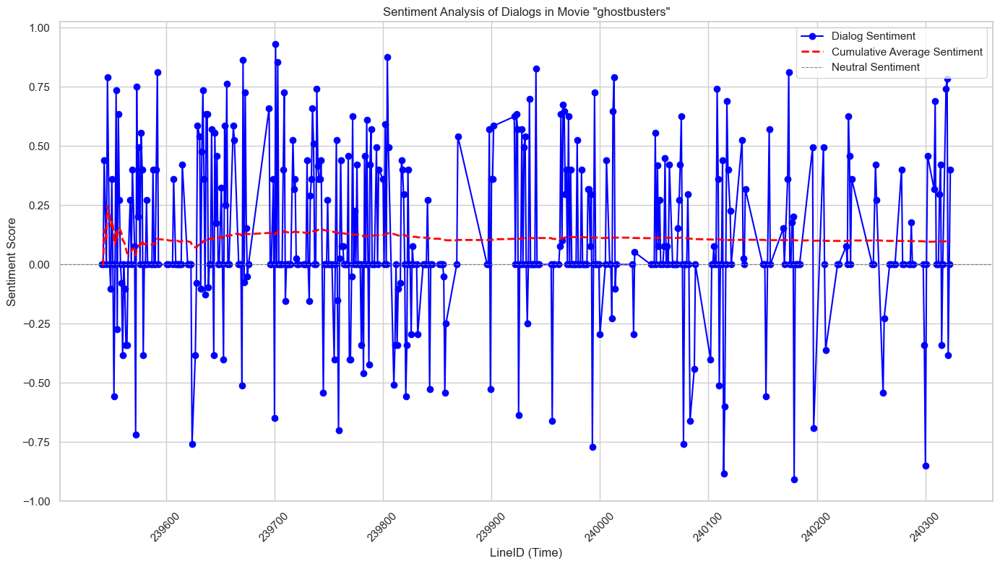

In [173]:
# Filter data for the specific movie
movie_id_to_analyze = "m75"

# Extract the movie title
movie_title = movie_titles.loc[movie_titles['MovieID'] == movie_id_to_analyze, 'Title'].values[0]
movie_lines_filtered = movie_lines[movie_lines['MovieID'] == movie_id_to_analyze]

# Extract numeric part of LineID and add as a new column
movie_lines_filtered['LineID_numeric'] = movie_lines_filtered['LineID'].str.extract('(\d+)').astype(int)

#  Sort by the numeric LineID to ensure chronological order
movie_lines_filtered = movie_lines_filtered.sort_values(by='LineID_numeric').reset_index(drop=True)

# Use the already calculated sentiment scores
movie_lines_filtered['Sentiment'] = movie_lines_filtered['SentimentScore']  # Use pre-calculated sentiment

# Calculate cumulative average sentiment
movie_lines_filtered['CumulativeAverage'] = movie_lines_filtered['Sentiment'].expanding().mean()

# Step 6: Plot sentiment score and cumulative average over time
plt.figure(figsize=(14, 8))

# Plot individual dialog sentiment
plt.plot(
    movie_lines_filtered['LineID_numeric'],
    movie_lines_filtered['Sentiment'],
    marker='o',
    linestyle='-',
    color='blue',
    label='Dialog Sentiment'
)

# Plot cumulative average sentiment
plt.plot(
    movie_lines_filtered['LineID_numeric'],
    movie_lines_filtered['CumulativeAverage'],
    color='red',
    linestyle='--',
    linewidth=2,
    label='Cumulative Average Sentiment'
)

# Add a neutral sentiment line
plt.axhline(y=0, color='gray', linestyle='--', linewidth=0.8, label='Neutral Sentiment')

# Add labels, legend, and title
plt.title(f'Sentiment Analysis of Dialogs in Movie "{movie_title}"')
plt.xlabel('LineID (Time)')
plt.ylabel('Sentiment Score')
plt.grid(True)
plt.legend()

# Format the x-axis to show intermittent values and rotate labels
ax = plt.gca()
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True, prune='both'))  # Show a manageable number of x-ticks
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


The plot above shows the sentiment analysis of Ghostbusters, illustrating the emotional shifts throughout the movie.

Ghostbusters maintains a dynamic emotional tone, mixing humor with moments of tension and drama. The movie balances light-hearted, funny scenes with some more serious or spooky moments, especially during ghost encounters. Overall, the sentiment remains mostly positive, reflecting its reputation as a family-friendly comedy-adventure. While it does include occasional intense elements, they are presented in a way that keeps the movie fun and entertaining for a broad audience.

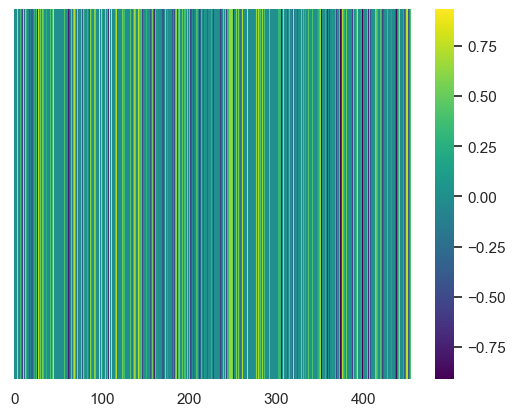

In [176]:
import seaborn as sns

sns.heatmap(
    movie_lines_filtered[['Sentiment']].T, 
    cmap='viridis', 
    cbar=True, 
    xticklabels=100, 
    yticklabels=False
)
plt.show()

The heat map above aligns with the previous line graph, further supporting the observations of Ghostbusters' sentiment analysis. Darker colors, representing negative sentiment, are sparse, while lighter colors, indicating positive or neutral sentiment, are more prevalent. This visualization reinforces the movie's overall positive tone, balancing its humor and occasional moments of tension in an engaging and family-friendly way.

### **Calculating and Visualizing TF-IDF for the Genres**

To understand the unique themes that define each genre, Term Frequency-Inverse Document Frequency (TF-IDF) is calculated for the movie genres.

The purpose of following code is:

1. **Extract Content by Genre:** The text content from each genre is collected by grouping the dialogues by genre. Special characters are removed, and the genres are split into individual words.

2. **Compute Term Frequency (TF):** The frequency of each word within each genre is calculated using logarithmic normalization to reduce the impact of very common terms.

3. **Calculate Inverse Document Frequency (IDF):** IDF values are calculated to determine how unique each word is across genres, down-weighting words that appear frequently across many genres.

4. **Calculate TF-IDF:** TF and IDF values are combined to score the importance of each word in distinguishing the genres.

5. **Visualize Top Words:** A table is generated that displays the top 10 TF-IDF words for each genre, showing the most important words that define the unique themes of each genre.

This process helps identify the distinctive vocabulary that characterizes each genre, providing valuable insights into the language and themes commonly associated with different genres in movies.

In [12]:
# Merge and clean genres
movies_genre_dialogs = movie_lines.merge(movie_titles[['MovieID', 'Genres']], on='MovieID', how='inner')

movies_genre_dialogs['Genres'] = (
    movies_genre_dialogs['Genres']
    .astype(str)
    .str.replace(r"[^\w\s,]", "", regex=True)  # Remove special characters except commas
    .str.strip()  # Remove leading/trailing whitespace
    .str.lower()  # Convert to lowercase
    .str.split()  # Split into individual words
)

movies_genre_dialogs = movies_genre_dialogs.explode('Genres')

movies_genre_dialogs['Genres'] = movies_genre_dialogs['Genres'].str.strip()  # Remove extra spaces
movies_genre_dialogs['Genres'] = movies_genre_dialogs['Genres'].str.replace(r",", "", regex=False)  # Remove commas
movies_genre_dialogs = movies_genre_dialogs.dropna(subset=['Genres'])  # Drop NaN genres
movies_genre_dialogs['Genres'] = movies_genre_dialogs['Genres'].astype(str)  # Ensure genres are strings

# Accumulate text for each genre
genres_texts = defaultdict(str)
for _, row in movies_genre_dialogs.iterrows():
    genre = row['Genres']
    
    content = row['CleanedText'] 
    if genre and content:
        # Accumulate dialogs for each genre
        genres_texts[genre] += " " + content 

# Calculate Term Frequency (TF) for each genre
tf_by_genre = {}
for genre, text in genres_texts.items():
    word_counts = Counter(text.split())
    tf_by_genre[genre] = {word: 1 + math.log(count) for word, count in word_counts.items()}  # Logarithmic TF

# Calculate Inverse Document Frequency (IDF)
total_genres = len(genres_texts)
df_counts = Counter()
for text in genres_texts.values():
    unique_words = set(text.split())
    for word in unique_words:
        df_counts[word] += 1

idf = {word: math.log(total_genres / df_count) for word, df_count in df_counts.items()}  # Calculate IDF

# Calculate TF-IDF for each genre
tfidf_by_genre = {}
for genre, tf_values in tf_by_genre.items():
    tfidf_by_genre[genre] = {word: tf * idf[word] for word, tf in tf_values.items()}  # TF-IDF calculation

# Extract top 10 TF-IDF words for each genre
top_words_by_genre = {}
for genre, tfidf in tfidf_by_genre.items():
    sorted_tfidf = sorted(tfidf.items(), key=lambda x: x[1], reverse=True)
    top_words = sorted_tfidf[:10]
    top_words_by_genre[genre] = top_words

# Prepare data for the table
table_data = []
for genre, words in top_words_by_genre.items():
    words = [f"{word} ({score:.2f})" for word, score in words]  # Format words with their scores
    table_data.append(words)

# Create a DataFrame with the top 10 words for each genre
df = pd.DataFrame(table_data, index=[str(genre).title() for genre in top_words_by_genre.keys()],
                  columns=[f"Word #{i+1}" for i in range(10)])
df.index.name = "Movie Genre"

# Configure pandas to display all columns and rows
pd.set_option('display.max_rows', None)  # Display all rows
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.width', 1000)  # Expand display width
pd.set_option('display.colheader_justify', 'left')  # Left-align column headers

# Display the DataFrame
print(df)

            Word #1            Word #2             Word #3             Word #4             Word #5             Word #6            Word #7             Word #8            Word #9             Word #10         
Movie Genre                                                                                                                                                                                                   
Comedy        gardiner (13.18)       shari (12.85)      dignan (12.53)  bialystock (12.36)   ninotchka (12.05)    windham (11.78)       hildy (11.74)      talia (11.57)   mordechai (11.57)     jabez (11.41)
Romance      ninotchka (12.05)    preysing (11.89)       hildy (11.74)  kringelein (11.46)      vivian (11.25)     jeanne (11.03)       swana (10.77)     lawson (10.63)  manchester (10.38)   marylin (10.30)
Adventure          neo (10.28)        duval (9.21)        benes (9.04)        magua (9.01)     morpheus (8.87)        erik (8.77)    narcissus (8.51)        indy (8.36)    

The table lists the top 10 words for each movie genre, and it is immediately apparent that these words are predominantly character names. The TF-IDF scores highlight these character names as important and distinctive to each genre, meaning they are used frequently within the context of the genre and are less common across other genres.

For instance, in the *adventure* genre, the name Neo stands out as one of the top words. This is a clear reference to Neo from The Matrix, one of the most iconic characters in action-adventure cinema. Similarly, Morpheus, another character from The Matrix, also makes the list for the *adventure* genre, reinforcing the centrality of character-driven narratives in these films.

The table reveals that genre-specific character names play a significant role in defining the essence of each genre. This demonstrates that characters are not only central to the plot but also to the identity of the genre itself. The TF-IDF analysis has effectively identified these iconic characters as fundamental elements of each genre's dialogue and thematic structure.

To better understand these patterns visually, we can use word clouds. Word clouds are an excellent way to display the most important words for each genre, with the size of each word reflecting its significance based on TF-IDF scores. These visualizations allow us to quickly grasp the defining vocabulary of each genre and see how character names dominate the top words across different categories.



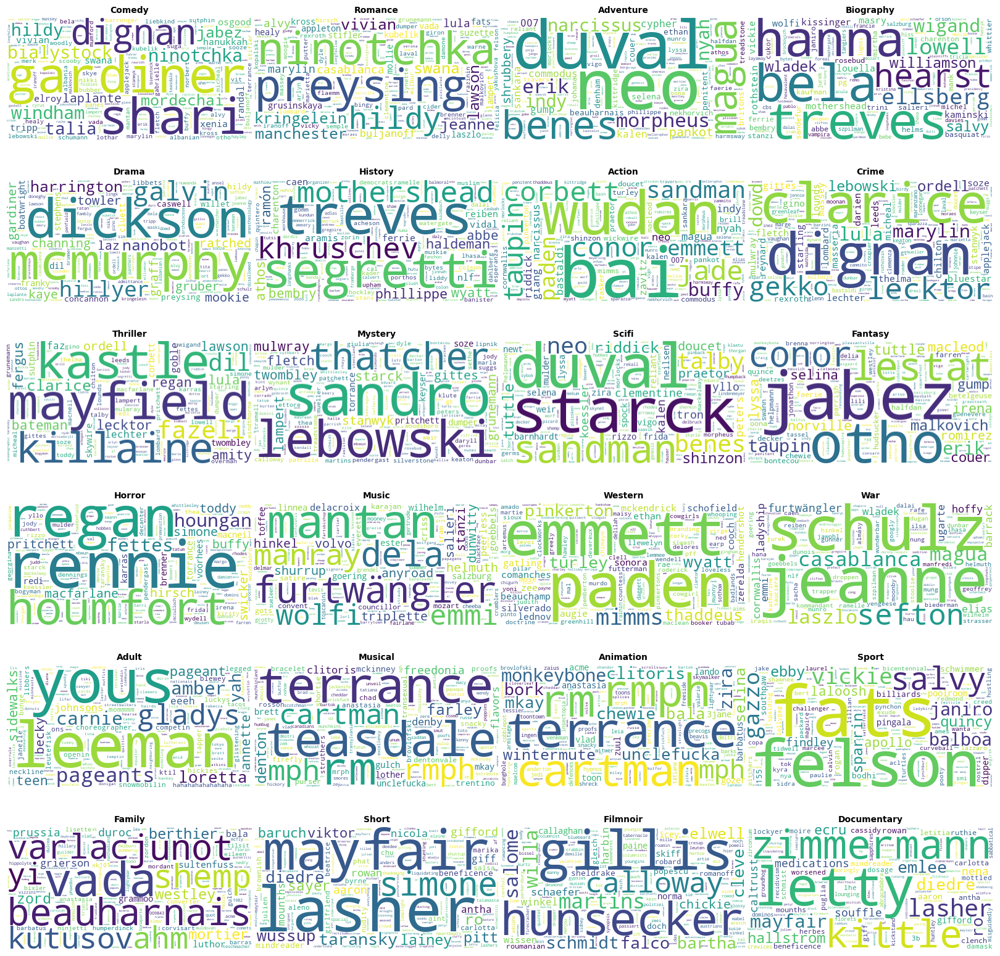

In [13]:
# Prepare word frequencies for each genre
genre_wordcloud_data = {}
for genre, tfidf_scores in tfidf_by_genre.items():
    # Use TF-IDF scores as word weights
    word_weights = {word: score for word, score in tfidf_scores.items()}
    genre_wordcloud_data[genre] = word_weights

# Define the number of rows and columns for the grid
rows, cols = 6, 4  # 6 rows and 4 columns
all_genres = list(genre_wordcloud_data.keys())

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(16, 16))  # Adjust figsize for tighter plots
axes = axes.flatten()  # Flatten the axes for easy iteration

# Generate word clouds and plot them
for idx, genre in enumerate(all_genres):
    wordcloud = WordCloud(
        width=400, height=200,
        background_color='white',
        colormap='viridis'
    ).generate_from_frequencies(genre_wordcloud_data[genre])
    
    # Plot the word cloud in the corresponding subplot
    axes[idx].imshow(wordcloud, interpolation='bilinear')
    axes[idx].axis('off')
    axes[idx].set_title(f"{genre.title()}", fontsize=10, fontweight='bold')

# Turn off remaining empty subplots if there are fewer genres than grid slots
for i in range(len(all_genres), len(axes)):
    axes[i].axis('off')

# Adjust layout for minimal spacing
plt.subplots_adjust(wspace=0.1, hspace=0.1)  # Further reduce space between subplots
plt.tight_layout(pad=0.0)  # Tighten the layout with padding
plt.show()


## **Genre-Based Insights**

In this analysis of the Cornell Movie-Dialogs Corpus, genre-based insights are explored by looking at how different genres perform across various metrics. By calculating factors like average movie lengths, sentiment scores, and audience engagement, we can find patterns that show how genres affect the viewing experience and critical reception. This approach helps us better understand the connection between genre characteristics and their impact on audience preferences and movie success.

We begin by analyzing the top 10 genres based on the number of votes and average ratings.

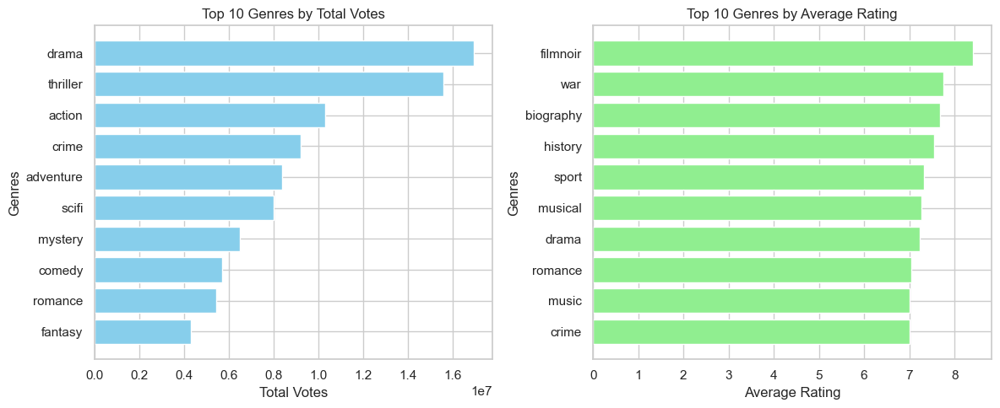

**Combined Top Genres by Votes and Rating (With Movie Counts):**

| Genres    |   Total_Votes |   Votes_Rank |   Avg_Rating |   Rating_Rank |   Number_of_Movies |
|:----------|--------------:|-------------:|-------------:|--------------:|-------------------:|
| filmnoir  |        143091 |           21 |      8.4     |             1 |                  4 |
| war       |       2020052 |           12 |      7.75652 |             2 |                 23 |
| biography |       1603695 |           13 |      7.684   |             3 |                 25 |
| history   |       1578009 |           14 |      7.54762 |             4 |                 21 |
| sport     |        361434 |           19 |      7.325   |             5 |                  8 |
| musical   |        355489 |           20 |      7.275   |             6 |                  8 |
| drama     |      16924104 |            1 |      7.23656 |             7 |                320 |
| romance   |       5431273 |            9 |      7.05076 |             8 |                132 |
| music     |        387263 |           18 |      7.01538 |             9 |                 13 |
| crime     |       9198826 |            4 |      7.00476 |            10 |                145 |
| mystery   |       6510248 |            7 |      6.96961 |            12 |                100 |
| adventure |       8395447 |            5 |      6.87155 |            14 |                107 |
| comedy    |       5713884 |            8 |      6.7284  |            16 |                159 |
| thriller  |      15554922 |            2 |      6.71413 |            17 |                265 |
| scifi     |       7989434 |            6 |      6.66833 |            18 |                112 |
| fantasy   |       4297265 |           10 |      6.59615 |            20 |                 74 |
| action    |      10285765 |            3 |      6.55833 |            22 |                158 |

LaTeX table saved to 'Tables/combined_top_genres.tex'.


In [99]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Markdown, display

# Function to clean and explode genres
def clean_and_explode_genres(df):
    df['Genres'] = (
        df['Genres']
        .astype(str)
        .str.replace(r"[^\w\s,]", "", regex=True)  # Remove special chars except commas
        .str.strip()  # Remove leading/trailing whitespace
        .str.lower()  # Convert to lowercase
        .str.split()  # Split into individual words
        .apply(lambda x: [genre.strip(",.") for genre in x])  # Remove trailing dots and commas
    )
    return df.explode('Genres').dropna(subset=['Genres'])

movie_genres = clean_and_explode_genres(movie_titles)

# Compute genre statistics
genre_stats = movie_genres.groupby('Genres').agg(
    Total_Votes=('Votes', 'sum'),
    Avg_Rating=('Rating', 'mean'),
    Number_of_Movies=('MovieID', 'nunique')
).reset_index()

# Create rank columns
genre_stats['Votes_Rank'] = genre_stats['Total_Votes'].rank(method='dense', ascending=False).astype(int)
genre_stats['Rating_Rank'] = genre_stats['Avg_Rating'].rank(method='dense', ascending=False).astype(int)

# Extract top 10 by votes and rating
top_10_votes_genres = genre_stats[genre_stats['Votes_Rank'] <= 10]
top_10_rating_genres = genre_stats[genre_stats['Rating_Rank'] <= 10]

# Combine sets
combined = pd.concat([top_10_votes_genres, top_10_rating_genres]).drop_duplicates(subset=['Genres'])

# Reorder columns so Votes_Rank is next to Total_Votes, Rating_Rank next to Avg_Rating,
# and Number_of_Movies is at the far right.
combined = combined[['Genres', 'Total_Votes', 'Votes_Rank', 'Avg_Rating', 'Rating_Rank', 'Number_of_Movies']]

# Sort by Rating_Rank
combined = combined.sort_values(by='Rating_Rank', ascending=True)

# Plot original charts for reference (top 10 by votes and rating)
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

top_10_votes = genre_stats.sort_values(by='Total_Votes', ascending=False).head(10)
axes[0].barh(top_10_votes['Genres'], top_10_votes['Total_Votes'], color='skyblue')
axes[0].invert_yaxis()
axes[0].set_title('Top 10 Genres by Total Votes')
axes[0].set_xlabel('Total Votes')
axes[0].set_ylabel('Genres')

top_10_ratings = genre_stats.sort_values(by='Avg_Rating', ascending=False).head(10)
axes[1].barh(top_10_ratings['Genres'], top_10_ratings['Avg_Rating'], color='lightgreen')
axes[1].invert_yaxis()
axes[1].set_title('Top 10 Genres by Average Rating')
axes[1].set_xlabel('Average Rating')
axes[1].set_ylabel('Genres')

plt.tight_layout()
plt.show()

# Display combined table
display(Markdown("**Combined Top Genres by Votes and Rating (With Movie Counts):**"))
display(Markdown(combined.to_markdown(index=False)))

# Save LaTeX table
latex_table = combined.to_latex(index=False, float_format="%.4f")
with open("Tables/combined_top_genres.tex", "w") as f:
    f.write(latex_table)

print("LaTeX table saved to 'Tables/combined_top_genres.tex'.")


The charts reveal a gap between what is popular and what is highly rated. *Drama* leads in total votes, appealing to a broad audience with relatable themes, while niche genres like *Film Noir*, *War*, and *Biography* receive the highest ratings due to their complexity, depth, and cultural or historical significance. In contrast, genres like Action and Thriller are popular but lack critical recognition as they prioritize entertainment over depth. This highlights how Drama balances both mass appeal and quality, while niche genres remain highly rated but less mainstream.

Now, we will focus on analyzing the length of movies across different genres to see if there are any patterns or trends related to how long movies are in each genre.

   Genres        Avg_Movie_Word_Count
0        action  4542.03             
1         adult  3178.00             
2     adventure  4463.21             
3     animation  4375.56             
4     biography  6649.24             
5        comedy  6095.21             
6         crime  5587.09             
7   documentary  4659.00             
8         drama  5847.37             
9        family  4396.25             
10      fantasy  4377.11             
11     filmnoir  5379.25             
12      history  4620.62             
13       horror  3734.23             
14        music  6213.69             
15      musical  3678.25             
16      mystery  5446.20             
17      romance  6147.20             
18        scifi  4437.22             
19        short  3114.20             
20        sport  5777.62             
21     thriller  4842.99             
22          war  4993.00             
23      western  5634.42             


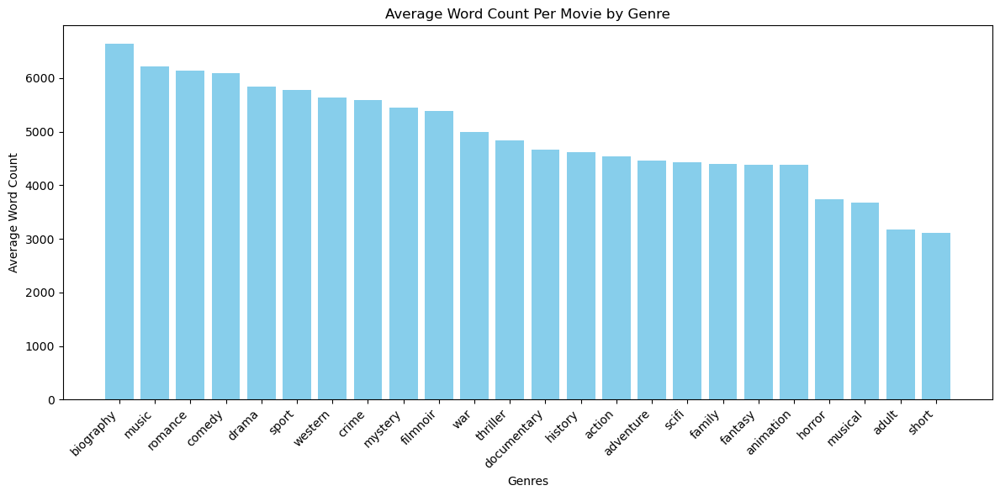

In [20]:
merged_lines = movie_lines.merge(movie_titles, on='MovieID', how='left')
merged_lines = merged_lines.explode('Genres')

def calculate_total_word_count(text_list):
    return sum(len(text.split()) for text in text_list if pd.notna(text))

movie_word_counts = merged_lines.groupby(['MovieID', 'Genres']).agg(
    Total_Word_Count=('Text', lambda x: calculate_total_word_count(x))
).reset_index()

avg_movie_word_count = movie_word_counts.groupby('Genres').agg(
    Avg_Movie_Word_Count=('Total_Word_Count', lambda x: round(x.mean(), 2))
).reset_index()

print(avg_movie_word_count)

# Plot the result
avg_movie_word_count_sorted = avg_movie_word_count.sort_values(by='Avg_Movie_Word_Count', ascending=False)

plt.figure(figsize=(12, 6)) 
plt.bar(avg_movie_word_count_sorted['Genres'], avg_movie_word_count_sorted['Avg_Movie_Word_Count'], color='skyblue')

plt.title('Average Word Count per Movie by Genre')
plt.ylabel('Average Word Count')
plt.xlabel('Genres')
plt.xticks(rotation=45, ha='right') 
plt.tight_layout()

plt.show()

### **Examining Genre-Based Differences in Dialogue Complexity:**  
While previous sections explored overarching structures and sentiment arcs, understanding how stylistic and linguistic variations differ among genres can reveal new dimensions of cinematic storytelling. By focusing on movies associated with a single genre, we can isolate the linguistic signatures that define that category.

In this section, we:
- Load movie metadata, including genre assignments, and filter for films that are strictly tied to a single genre.
- Compute various complexity metrics - such as average sentence length, vocabulary diversity, and overall word count—from each film’s dialogue.
- Aggregate these complexity measures by genre, thus identifying which genres tend toward more linguistically rich, verbose, or concise dialogue patterns.

This analysis complements our earlier examinations of sentiment and network structures, building toward a more holistic picture of how narrative complexity, thematic identity, and emotional tone coalesce to form the distinct character of each genre.


We start by merging the movie data and metadata into a single dataframe:


In [95]:
# First, assign column names to movie_lines
movie_lines.columns = ['LineID', 'CharacterID', 'MovieID', 'CharacterName', 'Text']

# Create a DataFrame with just 'MovieID' and 'Year' from movie_titles
movie_df = movie_titles[['MovieID', 'Year']].rename(columns={'MovieID': 'Movie ID'})

# Create a dialogue_df from movie_lines
# Selecting relevant columns and renaming them to match the previous naming scheme
dialogue_df = movie_lines[['LineID', 'MovieID', 'CharacterName', 'Text']].rename(
    columns={
        'LineID': 'Line ID',
        'MovieID': 'Movie ID',
        'CharacterName': 'Character',
        'Text': 'Dialogue'
    }
)

# Merge movie metadata with dialogues based on Movie ID
movie_dialogue_df = pd.merge(dialogue_df, movie_df, on='Movie ID')

# movie_dialogue_df now contains 'Line ID', 'Movie ID', 'Character', 'Dialogue', and 'Year'
print(movie_dialogue_df.head())

  Line ID Movie ID Character      Dialogue  Year
0   L1045       m0    BIANCA  They do not!  1999
1   L1044       m0   CAMERON   They do to!  1999
2    L985       m0    BIANCA    I hope so.  1999
3    L984       m0   CAMERON     She okay?  1999
4    L925       m0    BIANCA     Let's go.  1999


In this section, we measure how dialogue complexity varies by genre. For each movie belonging to a single genre, we compute average sentence length, vocabulary diversity, and overall word count. We then aggregate these metrics at the genre level, producing a summary that highlights which genres tend to have more linguistically rich or concise dialogues.


In [96]:
import pandas as pd
import re
import ast
from collections import defaultdict
from IPython.display import Markdown, display

# Ensure genres are parsed as lists
if movie_titles['Genres'].dtype == object and not isinstance(movie_titles['Genres'].iloc[0], list):
    movie_titles['Genres'] = movie_titles['Genres'].apply(ast.literal_eval)

# Function to calculate complexity metrics for a dialogue
def calculate_complexity(dialogue):
    sentences = re.split(r'[.!?]', dialogue)
    sentence_lengths = [len(re.findall(r'\w+', sentence)) for sentence in sentences if sentence.strip()]
    total_words = sum(sentence_lengths)
    unique_words = len(set(re.findall(r'\w+', dialogue.lower())))
    vocab_diversity = unique_words / total_words if total_words > 0 else 0
    avg_sentence_length = sum(sentence_lengths) / len(sentence_lengths) if sentence_lengths else 0
    return avg_sentence_length, vocab_diversity, total_words

# Rename columns in movie_lines for consistency
movie_lines.columns = ['LineID', 'CharacterID', 'MovieID', 'CharacterName', 'Text']

# Create a dialogue DataFrame with consistent column naming
dialogue_df = movie_lines[['LineID', 'MovieID', 'CharacterName', 'Text']].rename(
    columns={
        'LineID': 'Line ID',
        'CharacterName': 'Character',
        'Text': 'Dialogue'
    }
)

# Select only the necessary columns from movie_titles
movie_df = movie_titles[['MovieID', 'Year', 'Genres']].copy()

# Merge metadata and dialogue
movie_dialogue_df = pd.merge(dialogue_df, movie_df, on='MovieID')

# Filter for movies with exactly one genre
one_genre_df = movie_dialogue_df[movie_dialogue_df['Genres'].apply(lambda x: len(x) == 1)]

# Calculate complexity metrics for each genre
movie_complexity = defaultdict(list)
movie_counts = defaultdict(int)  # To count the number of movies per genre

for _, row in one_genre_df.iterrows():
    dialogue = row['Dialogue']
    avg_sentence_length, vocab_diversity, total_words = calculate_complexity(dialogue)
    genre = row['Genres'][0]
    movie_complexity[genre].append((avg_sentence_length, vocab_diversity, total_words))
    movie_counts[genre] += 1  # Count each unique movie for the genre

# Aggregate metrics by genre
genre_complexity = {
    genre: {
        'Avg Sentence Length': sum(x[0] for x in metrics) / len(metrics),
        'Vocab Diversity': sum(x[1] for x in metrics) / len(metrics),
        'Avg Word Count Per Movie': sum(x[2] for x in metrics) / movie_counts[genre],
    }
    for genre, metrics in movie_complexity.items()
}

# Convert to DataFrame
genre_complexity_df = pd.DataFrame.from_dict(genre_complexity, orient='index').reset_index()
genre_complexity_df.rename(columns={'index': 'Genre'}, inplace=True)

# Print results as a Markdown-formatted table in the notebook
display(Markdown(genre_complexity_df.to_markdown(index=False)))

# Save LaTeX table to file
latex_table = genre_complexity_df.to_latex(index=False, float_format="%.4f")
with open("Tables/genre_complexity.tex", "w") as f:
    f.write(latex_table)

print("Summary statistics saved to 'Tables/genre_complexity.tex'.")


| Genre       |   Avg Sentence Length |   Vocab Diversity |   Avg Word Count Per Movie |
|:------------|----------------------:|------------------:|---------------------------:|
| drama       |               6.40557 |          0.939332 |                   12.4605  |
| horror      |               5.57546 |          0.952642 |                   10.043   |
| thriller    |               6.09064 |          0.949518 |                   10.6915  |
| comedy      |               6.18222 |          0.951519 |                   10.68    |
| short       |               5.50293 |          0.966827 |                    7.91892 |
| documentary |               6.30536 |          0.953686 |                    9.62195 |
| action      |               6.11643 |          0.953865 |                   12.8303  |
| sci-fi      |               5.11112 |          0.955226 |                   10.0758  |
| fantasy     |               5.97322 |          0.962352 |                    8.50476 |

Summary statistics saved to 'Tables/genre_complexity.tex'.


### **Aggregating Artist Counts by Genre**

By linking the number of unique characters per movie with genre classifications, we can examine casting complexity as a potential factor influencing narrative depth, thematic richness, and viewer engagement.
This next code cell computes the average number of distinct characters (artists) per movie for each genre. Ultimately, these insights can highlight patterns in how different genres allocate storytelling “space” among their characters, potentially affecting how audiences experience and interpret these films.


In [108]:
from collections import defaultdict
import pandas as pd

# Count distinct characters (artists) per movie
artist_count_per_movie = dialogue_df.groupby('MovieID')['Character'].nunique().reset_index()
artist_count_per_movie = artist_count_per_movie.rename(columns={'Character': 'Artist Count'})

# Merge the artist count with movie genres
merged_data = pd.merge(artist_count_per_movie, movie_titles, on='MovieID', how='left')

# Calculate the average artist count per genre
genre_artist_count = defaultdict(lambda: {'total_artists': 0, 'movie_count': 0})

for _, row in merged_data.iterrows():
    genres = row['Genres']
    artist_count = row['Artist Count']
    for genre in genres:
        genre_artist_count[genre]['total_artists'] += artist_count
        genre_artist_count[genre]['movie_count'] += 1

# Calculate average artists per genre
avg_artists_per_genre = [
    [genre, data['total_artists'] / data['movie_count']] 
    for genre, data in genre_artist_count.items()
]

genre_data = pd.DataFrame(avg_artists_per_genre, columns=['Genre', 'Average Artist Count'])
genre_data = genre_data.sort_values(by='Average Artist Count', ascending=False)



### **Visualizing Genre-Based Casting Complexity**

Having determined average artist counts per genre, we now want to present these results in a more interpretable format. The subsequent code block will produce a polar bar chart, where each genre is positioned around a circular axis and represented by a bar whose length corresponds to its average artist count.

This visualization method allows us to quickly compare genres and identify which ones tend to have more complex ensemble casts. Understanding these differences may help us connect genre conventions with narrative strategies and audience preferences, offering a clearer perspective on the interplay between casting complexity and filmic storytelling.

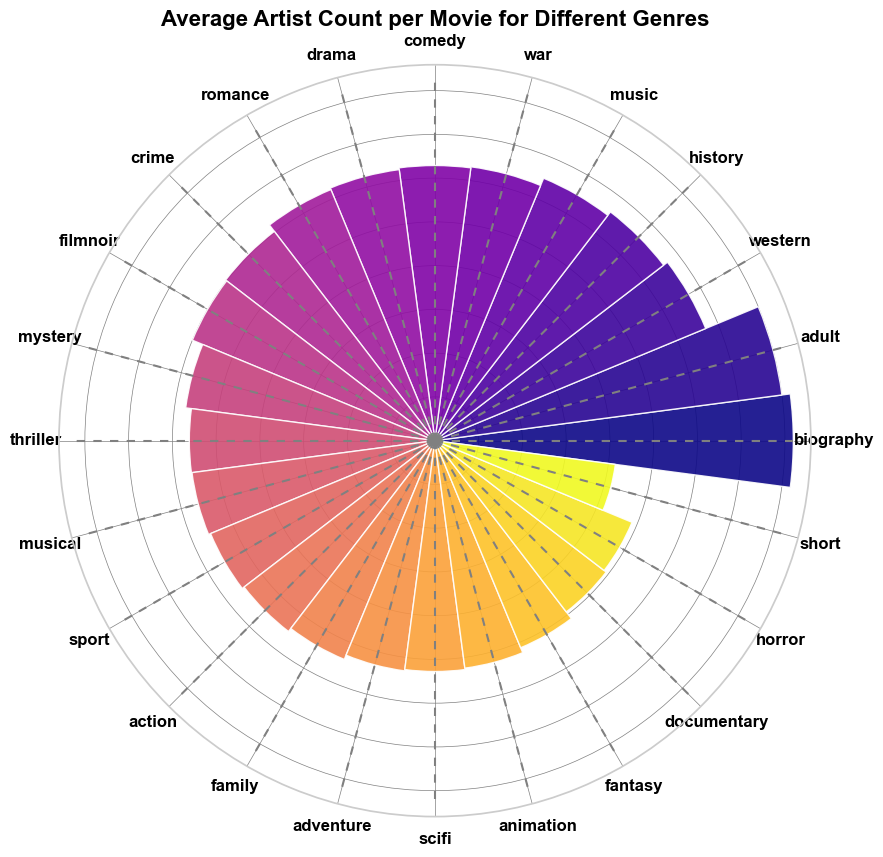

| Genre       |   Average Artist Count |
|:------------|-----------------------:|
| biography   |                20.48   |
| adult       |                20      |
| western     |                16.75   |
| history     |                16.4762 |
| music       |                16.2308 |
| war         |                15.7826 |
| comedy      |                15.7222 |
| drama       |                15.6219 |
| romance     |                15.5303 |
| crime       |                15.0748 |
| filmnoir    |                15      |
| mystery     |                14.3627 |
| thriller    |                14.0335 |
| musical     |                14      |
| sport       |                13.875  |
| action      |                13.744  |
| family      |                13.5294 |
| adventure   |                13.2672 |
| scifi       |                13.1917 |
| animation   |                13.1111 |
| fantasy     |                12.8077 |
| documentary |                12.3333 |
| horror      |                12.1919 |
| short       |                10.4    |

In [127]:
import numpy as np
import matplotlib.pyplot as plt
from textwrap import wrap
import matplotlib.cm as cm
import pandas as pd
from IPython.display import display, Markdown

# Get the necessary values from genre_data
genres = genre_data['Genre'].values
avg_artist_counts = genre_data['Average Artist Count'].values

# Number of genres
num_genres = len(genres)

# Initialize layout in polar coordinates
fig, ax = plt.subplots(figsize=(9, 12.6), subplot_kw={"projection": "polar"})

# Set background color to white, both axis and figure.
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

# Set parameters for polar plot
# Angle for each genre in radians (equal spacing)
angles = np.linspace(0, 2 * np.pi, num_genres, endpoint=False).tolist()

# The bars will be the radial distance from the center
radii = avg_artist_counts

# Bar width
width = 2 * np.pi / num_genres

# Generate a smooth gradient of colors using a colormap (e.g., 'Plasma')
colors = cm.plasma(np.linspace(0, 1, num_genres)) 

# Add bars to represent the average artist count for each genre with gradient colors
bars = ax.bar(angles, radii, color=colors, alpha=0.9, width=width, zorder=10)

# Add dashed vertical lines to reference angles (like a radar chart)
ax.vlines(angles, 0, max(radii), color='grey', ls=(0, (4, 4)), zorder=11)

# Add labels for the regions (genres)
# Wrap the genre names for better display
wrapped_genres = ["\n".join(wrap(r, 5, break_long_words=False)) for r in genres]

# Set the labels at the right angle (using the angles computed above)
ax.set_xticks(angles)
ax.set_xticklabels(wrapped_genres, size=12, fontweight='bold', color='black')

# Add title and other visual elements
ax.set_title("Average Artist Count per Movie for Different Genres", size=16, fontweight='bold', color='black')

# Remove the radial labels (optional) and adjust the radius of the plot
ax.set_yticklabels([])  # Remove radial labels

# Adjust the radius (y-limit) so the bars are spread across the plot
ax.set_ylim(0, max(radii) + 1)  # Extend the y-limit for visual clarity

# Add gridlines (optional, can be useful for readability)
ax.grid(True, color='grey', linestyle='-', linewidth=0.5)

# Show the plot
plt.tight_layout()
plt.show()

# Create a DataFrame for the genre data
genre_df = pd.DataFrame({
    "Genre": genres,
    "Average Artist Count": avg_artist_counts
})

# Sort the DataFrame by the "Average Artist Count" column in descending order
genre_df_sorted = genre_df.sort_values(by="Average Artist Count", ascending=False)

# Display the sorted DataFrame as a Markdown table
display(Markdown(genre_df_sorted.to_markdown(index=False)))

# Save the sorted DataFrame as a LaTeX table
latex_table_path = "Tables/genre_artist_counts.tex"
genre_df_sorted.to_latex(latex_table_path, index=False, float_format="%.4f")

### **Visualizing Movie Genre Communities with Network Analysis**

This code snippet leverages network analysis to explore and visualize the relationships between movies based on shared genres. By constructing a graph where each node represents a movie and edges connect movies sharing at least one genre, the code applies the Louvain community detection algorithm to identify clusters of movies that are closely related in terms of genre. 

Number of communities detected: 5
Number of nodes (movies): 617
Number of edges (shared genres): 112603

Community sizes:
Community 4: 271 nodes
Community 2: 244 nodes
Community 0: 96 nodes
Community 1: 5 nodes
Community 3: 1 nodes


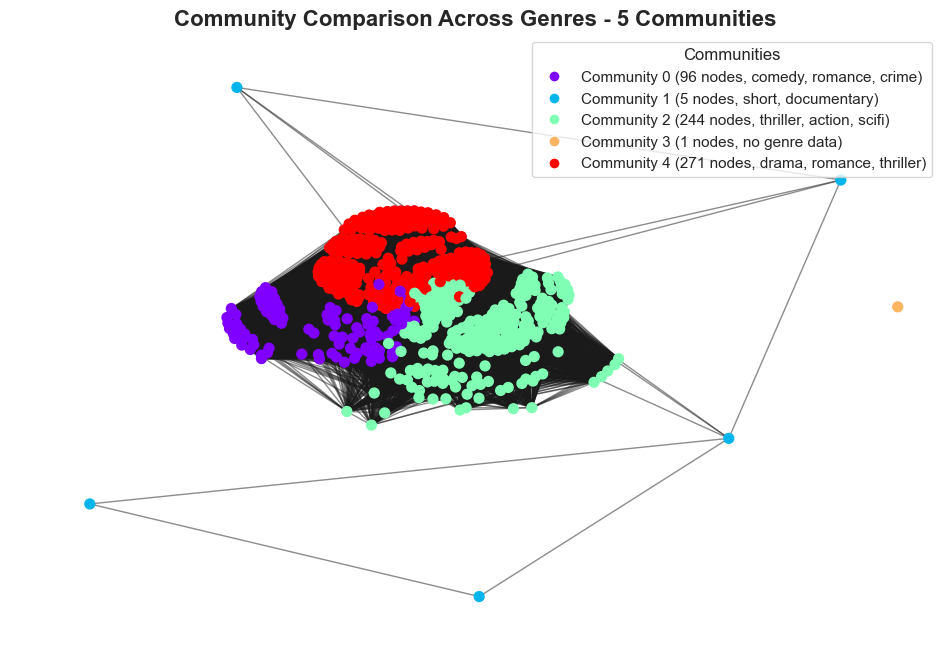

In [119]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
from collections import defaultdict, Counter
from community import community_louvain  # Louvain method for community detection

# Build a graph of movies based on shared genres
G = nx.Graph()

# Add nodes for each movie with 'genres' attribute
for _, row in movie_titles.iterrows():
    movie_id = row['MovieID']
    genres = row['Genres']
    G.add_node(movie_id, genres=genres)

# Add edges between movies that share at least one genre
movie_list = movie_titles.to_dict('records')

for i in range(len(movie_list)):
    movie_id = movie_list[i]['MovieID']
    genres_i = movie_list[i]['Genres']
    for j in range(i+1, len(movie_list)):
        other_movie_id = movie_list[j]['MovieID']
        genres_j = movie_list[j]['Genres']
        if any(g in genres_j for g in genres_i):
            G.add_edge(movie_id, other_movie_id)

# Run Louvain community detection
partition = community_louvain.best_partition(G, resolution=1.0)

# Calculate community sizes
num_communities = len(set(partition.values()))
community_sizes = defaultdict(int)
for community_id in partition.values():
    community_sizes[community_id] += 1

print(f"Number of communities detected: {num_communities}")
print(f"Number of nodes (movies): {len(G.nodes)}")
print(f"Number of edges (shared genres): {len(G.edges)}\n")

print("Community sizes:")
for community_id, size in sorted(community_sizes.items(), key=lambda x: x[1], reverse=True):
    print(f"Community {community_id}: {size} nodes")

# Compute the top genres for each community
community_genres = defaultdict(list)
for node, com_id in partition.items():
    node_genres = G.nodes[node]['genres']
    community_genres[com_id].extend(node_genres)

community_top_genres = {}
for com_id, genre_list in community_genres.items():
    if genre_list:
        genre_counts = Counter(genre_list)
        most_common = genre_counts.most_common()
        # If more than 3, take top 3, else take all
        if len(most_common) > 3:
            selected_genres = [g for g, _ in most_common[:3]]
        else:
            selected_genres = [g for g, _ in most_common]
        genres_str = ", ".join(selected_genres)
    else:
        genres_str = "no genre data"
    community_top_genres[com_id] = genres_str

# Use a force-directed layout for the network visualization
pos = nx.spring_layout(G, k=0.7, iterations=1000, seed=42)

community_colors = [partition[node] for node in G.nodes]

# Assign colors to each community
cmap = plt.cm.get_cmap('rainbow', num_communities)
colors = [cmap(i) for i in range(num_communities)]

community_color_map = {}
for i in range(num_communities):
    community_color_map[i] = colors[i]

plt.figure(figsize=(12, 8))

# Draw nodes colored by their community
nx.draw_networkx_nodes(G, pos, node_size=50, node_color=[community_color_map[c] for c in community_colors])

# Draw edges with some transparency
nx.draw_networkx_edges(G, pos, alpha=0.5)

# Make the title bold
plt.title(f"Community Comparison Across Genres - {num_communities} Communities", 
          fontsize=16, fontweight='bold')

# Create legend entries that include community size and top genres
legend_handles = []
for i in range(num_communities):
    size = community_sizes[i]
    top_genres = community_top_genres[i]
    top_genre_label = f"Community {i} ({size} nodes, {top_genres})"
    legend_handles.append(
        plt.Line2D([0], [0], marker='o', color='w', label=top_genre_label,
                   markerfacecolor=community_color_map[i], markersize=8)
    )

plt.legend(handles=legend_handles, loc='best', title='Communities')

plt.axis('off')
plt.show()


This code organizes movie community data into a sorted DataFrame by size, displays it, and saves it as a LaTeX table for further use

In [125]:
import pandas as pd
from IPython.display import display

# Prepare data for the DataFrame
community_data = {
    "Community": list(community_sizes.keys()),
    "Size": list(community_sizes.values()),
    "Top Genres": [community_top_genres[com_id] for com_id in community_sizes.keys()]
}

# Create a DataFrame
df = pd.DataFrame(community_data)

# Sort the DataFrame by the "Size" column in descending order
df_sorted = df.sort_values(by="Size", ascending=False)

# Display the sorted DataFrame in the notebook
display(df_sorted)

# Save the sorted DataFrame as a LaTeX table
latex_table_path = "Tables/communities_table.tex"
df_sorted.to_latex(latex_table_path, index=False, float_format="%.4f")

,Community,Size,Top Genres
1,4,271,"drama, romance, thriller"
2,2,244,"thriller, action, scifi"
0,0,96,"comedy, romance, crime"
4,1,5,"short, documentary"
3,3,1,no genre data
